In [1]:
import pandas as pd
import math
import numpy as np
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
import warnings
plt.rcParams["font.family"] = "AppleGothic"
plt.rcParams['axes.unicode_minus'] = False
warnings.filterwarnings("ignore")

In [2]:
merged_df = pd.read_csv('no_NaN_dataset_final.csv')#/31_0.99.csv')#no_NaN_dataset_final.csv')
merged_df
#df = df.drop(['Unnamed: 0'], axis=1) #이삭이의 데이터를 돌리때는 필요합니다..

,행정구역(시도),행정구역(시군구),연도,총인구수(명),유치원 수,초등학교 수,출생건수,사망건수,혼인건수,이혼건수,학령인구(명),총인구수-학령인구(명),행정구역
0,서울특별시,종로구,2010,170578,17,14,1107,852,1011,396,29164,141414,서울특별시 종로구
1,서울특별시,중구,2010,132822,13,12,1170,671,1049,378,19628,113194,서울특별시 중구
2,서울특별시,용산구,2010,244853,19,15,2312,1086,1784,528,37318,207535,서울특별시 용산구
3,서울특별시,성동구,2010,309093,31,20,2886,1226,2306,672,51562,257531,서울특별시 성동구
4,서울특별시,광진구,2010,375463,42,22,3366,1290,2672,811,67422,308041,서울특별시 광진구
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2894,경상남도,함양군,2022,37708,12,13,76,668,90,60,4135,33573,경상남도 함양군
2895,경상남도,거창군,2022,60387,16,17,175,804,163,94,8548,51839,경상남도 거창군
2896,경상남도,합천군,2022,42142,15,17,97,899,89,71,3385,38757,경상남도 합천군
2897,제주특별자치도,제주시,2022,493389,74,69,2766,3281,2034,1102,84346,409043,제주특별자치도 제주시


# 모델 생성

In [3]:
#Linear Regression

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import RandomForestRegressor
#from tensorflow.keras.models import Sequential
#from tensorflow.keras.layers import LSTM, Dense
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import BaggingRegressor

In [4]:
def mean_absolute_percentage_error(y_true, y_pred): 
    """
    평균절대백분율오차를 계산하는 함수
    
    :param y_true: 실제 값이 들어 있는 리스트 또는 배열
    :param y_pred: 예측 값이 들어 있는 리스트 또는 배열
    :return: MAPE 값
    """
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    non_zero_elements = y_true != 0
    
    if np.any(non_zero_elements):
        mape = np.mean(np.abs((y_true[non_zero_elements] - y_pred[non_zero_elements]) / y_true[non_zero_elements])) * 100
        return mape
    else:
        return np.inf

In [5]:
def prediction(df,idx):
    features = df[['총인구수(명)', '유치원 수','초등학교 수', '출생건수', '사망건수', '혼인건수', 
                        '이혼건수']]
    target = df['학령인구(명)']
    X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)
    
    model = RandomForestRegressor(n_estimators=idx,random_state=42)
    
    model.fit(X_train, y_train)

    y_pred = model.predict(X_test)
    
    mape = mean_absolute_percentage_error(y_test, y_pred)
    print(mape)#"MAPE", mape)

    return y_test,y_pred

In [6]:
def vis(test, pred):
    a=[]
    b=[]

    for i,j in zip(test,pred):
        a.append(i)
        b.append(j)
    plt.plot(a, label='Actual')
    plt.plot(b, label ='Predicted')
    plt.legend()
    plt.show()

5.900758960510392


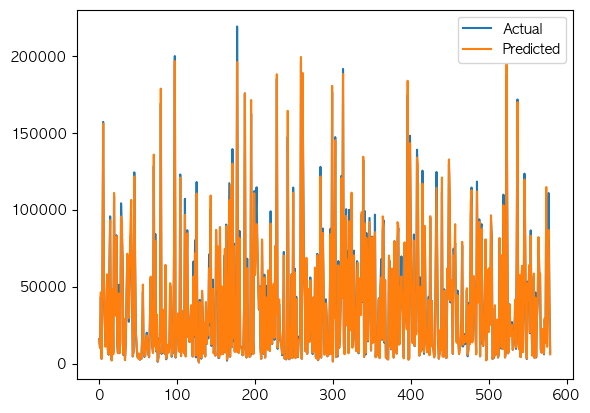

In [7]:
test, pred = prediction(merged_df, 50)
vis(test, pred)

# Prediction 함수 정의

In [8]:
def merge_region(df):
    sorted_cluster_df = df.sort_values(by=['행정구역(시도)', '행정구역(시군구)'])

    sorted_cluster_df['행정구역'] = sorted_cluster_df['행정구역(시도)'] + ' ' + sorted_cluster_df['행정구역(시군구)']

    sorted_cluster_df.drop(['행정구역(시도)', '행정구역(시군구)'], axis=1, inplace=True)
    
    return sorted_cluster_df

In [9]:
def split_by_region(df):
    regions = df['행정구역'].unique()
    cluster = []
    for i in range(len(regions)):
        cluster.append(df[df['행정구역'] == regions[i]])
        cluster[i] = cluster[i][['행정구역','연도','총인구수(명)','총인구수-학령인구(명)','유치원 수','초등학교 수', '출생건수', 
                              '사망건수','혼인건수','이혼건수','학령인구(명)']]
    return cluster

In [10]:
def actual_data(df, cluster_df):
    df = df[df['연도'] == 2021]

    df = df[['행정구역(시도)','행정구역(시군구)','총인구수-학령인구(명)']]
    df['행정구역'] = df['행정구역(시도)'] + ' ' + df['행정구역(시군구)']
    df.drop(['행정구역(시도)', '행정구역(시군구)'], axis=1, inplace=True)

    df = df[df['행정구역'].isin(cluster_df['행정구역'].unique())]
    df = df.sort_values(by=['행정구역'])
    actu = df['총인구수-학령인구(명)'].reset_index(drop=True)
    return actu

In [11]:
from statsmodels.tsa.arima.model import ARIMA

def run_ARIMA(cluster):
    # Assuming your time series data is stored in a Pandas DataFrame or Series
    # Replace this with your actual data
    features = ['연도','총인구수(명)','총인구수-학령인구(명)','유치원 수','초등학교 수', '출생건수', '사망건수', '혼인건수','이혼건수','학령인구(명)']
    not_two_f = ['총인구수-학령인구(명)','출생건수', '사망건수', '혼인건수','이혼건수']
    fv_list = []
    
    for feature in features:
        data = pd.Series(cluster[feature].reset_index(drop=True))

        # Fit ARIMA model
        if(feature in not_two_f):
            model = ARIMA(data, order=(1, 2, 1))  # You can adjust the order parameters based on your data characteristics
        else:
            model = ARIMA(data, order=(1, 2, 1))
        fit_model = model.fit()

        # Forecast the next 10 values
        forecast_values = fit_model.forecast(steps=39)
        fv_list.append(forecast_values)
    df = pd.DataFrame(fv_list).transpose()
    df.columns = features
    return df

In [12]:
from sklearn.linear_model import BayesianRidge

def run_BayesianRidge(cluster):
    # Assuming your time series data is stored in a Pandas DataFrame or Series
    # Replace this with your actual data
    features = ['연도', '총인구수(명)', '총인구수-학령인구(명)', '유치원 수', '초등학교 수', '출생건수', '사망건수', '혼인건수', '이혼건수', '학령인구(명)']
    not_two_f = ['총인구수-학령인구(명)', '출생건수', '사망건수', '혼인건수', '이혼건수']
    fv_list = []

    for feature in features:
        data = pd.Series(cluster[feature].reset_index(drop=True))

        # Fit BayesianRidge model
        model = BayesianRidge()
        model.fit(np.arange(len(data)).reshape(-1, 1), data)  # Assuming time is the only feature

        # Forecast the next 39 values
        forecast_values = model.predict(np.arange(len(data), len(data) + 39).reshape(-1, 1))
        fv_list.append(forecast_values)

    df = pd.DataFrame(fv_list).transpose()
    df.columns = features
    return df

# 22~60 Prediction

In [13]:

merged_df_2022 = merged_df[merged_df['연도'] == 2022]
merged_df_except_2022 = merged_df[merged_df['연도'] != 2022]


In [14]:
sort_cluster = merge_region(merged_df_except_2022)

sort_cluster.head()

,연도,총인구수(명),유치원 수,초등학교 수,출생건수,사망건수,혼인건수,이혼건수,학령인구(명),총인구수-학령인구(명),행정구역
103,2010,218503,40,35,1641,1413,1071,487,43102,175401,강원특별자치도 강릉시
326,2011,217571,40,35,1671,1434,1140,496,41960,175611,강원특별자치도 강릉시
549,2012,217741,40,35,1636,1490,1107,475,41589,176152,강원특별자치도 강릉시
772,2013,216806,40,35,1460,1471,1026,528,40758,176048,강원특별자치도 강릉시
995,2014,215807,41,35,1298,1539,983,473,39345,176462,강원특별자치도 강릉시


In [15]:
cluster = split_by_region(sort_cluster)
 
cluster[0].tail()

,행정구역,연도,총인구수(명),총인구수-학령인구(명),유치원 수,초등학교 수,출생건수,사망건수,혼인건수,이혼건수,학령인구(명)
1664,강원특별자치도 강릉시,2017,213952,179172,38,35,1084,1529,924,444,34780
1887,강원특별자치도 강릉시,2018,212957,179407,38,35,1036,1678,876,433,33550
2110,강원특별자치도 강릉시,2019,213442,180929,36,34,964,1720,893,494,32513
2333,강원특별자치도 강릉시,2020,213321,182434,37,35,950,1709,801,415,30887
2556,강원특별자치도 강릉시,2021,212965,183211,37,35,892,1710,799,420,29754


In [16]:
def vis1(a, b):
    mape = mean_absolute_percentage_error(a, b)
    print("MAPE:", mape)
    plt.plot(a, label='Actual')
    plt.plot(b, label ='Predicted')
    plt.legend()
    plt.show()

# Prediction Code


◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ 
 Linear Regression
MAPE: 13.638602441861886


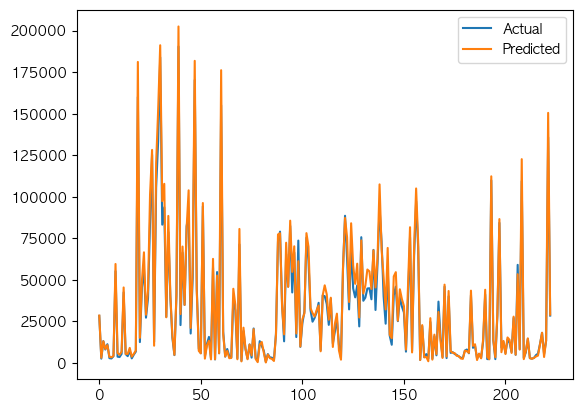


◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ 
 BayesianRidge
MAPE: 13.366967489442624


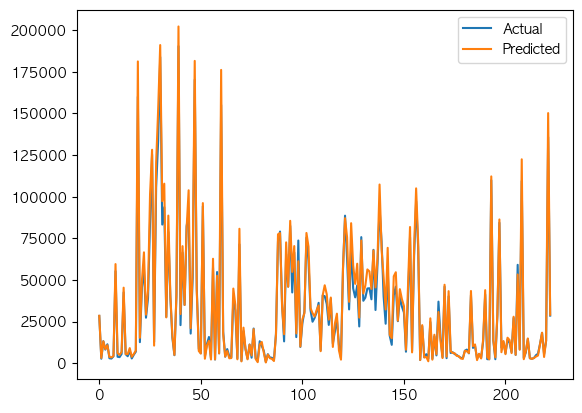


◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ 
 Ridge Regression
MAPE: 13.63859080742451


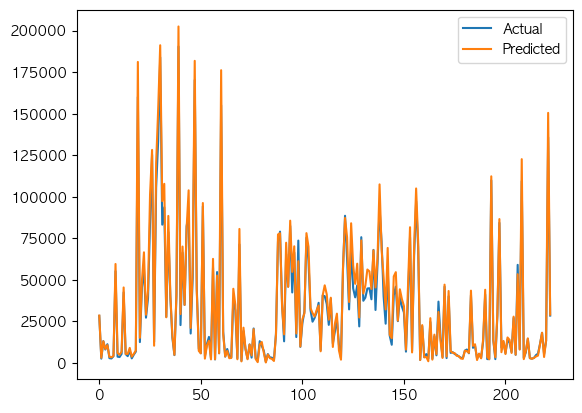


◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ 
 Lasso Regression
MAPE: 13.638075585825222


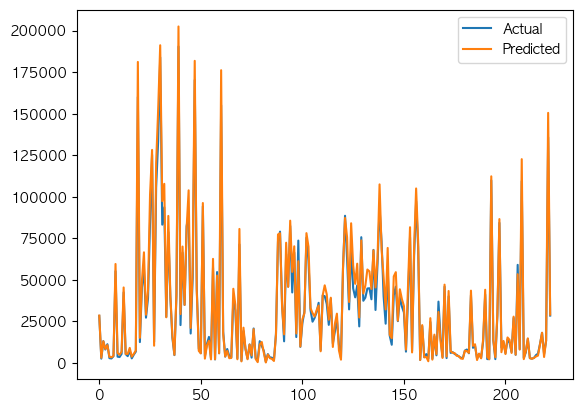


◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ 
 Elastic Net
MAPE: 13.569535941101151


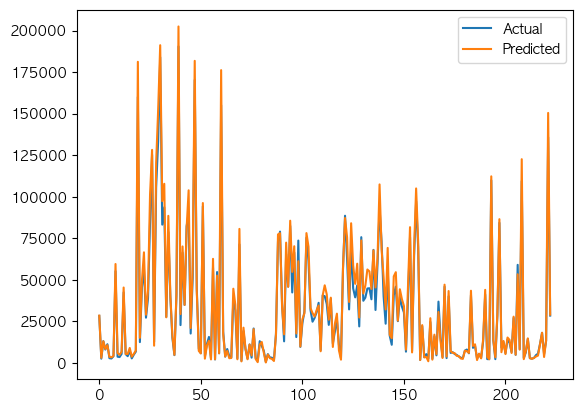


◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ 
 Decision Tree
MAPE: 6.667835258436355


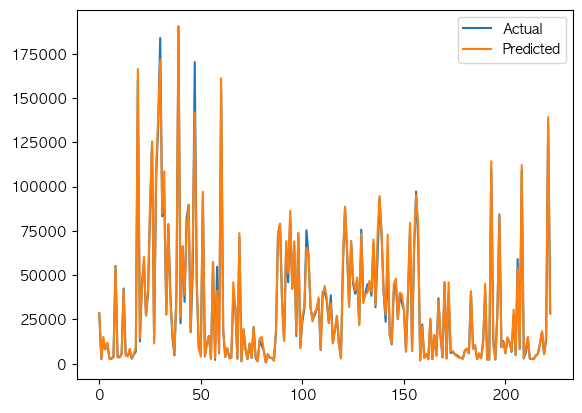


◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ 
 Random Forest
MAPE: 6.551425677511699


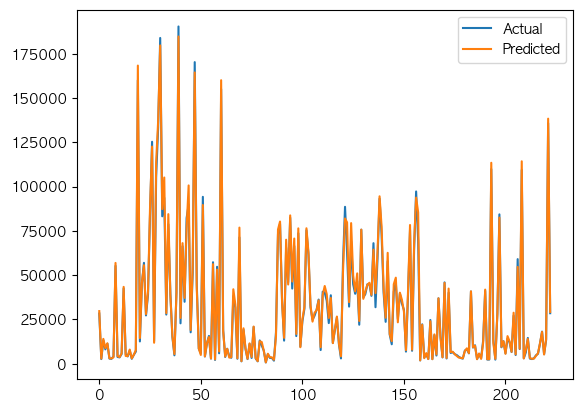


◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ 
 Gradient Boosting
MAPE: 12.72635758312617


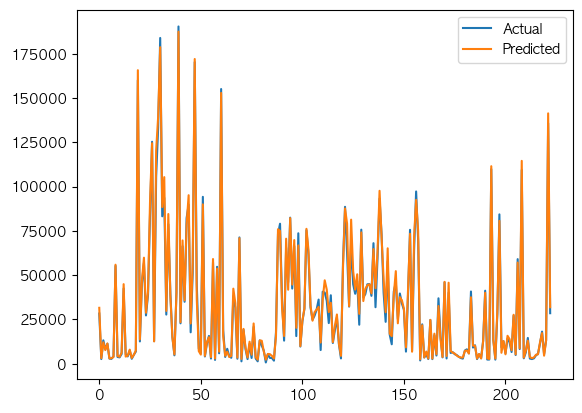


◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ 
 SVR
MAPE: 217.22103823399058


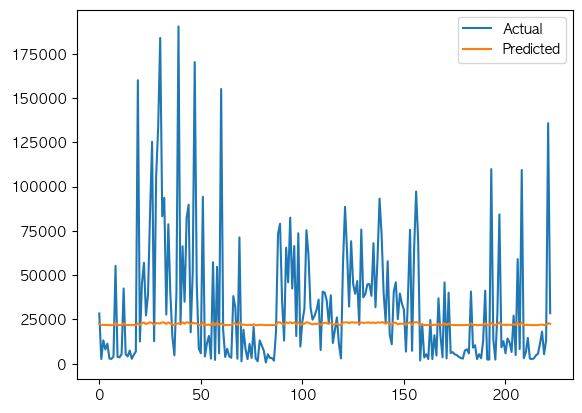


◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ 
 K-Nearest Neighbors
MAPE: 17.125858709746637


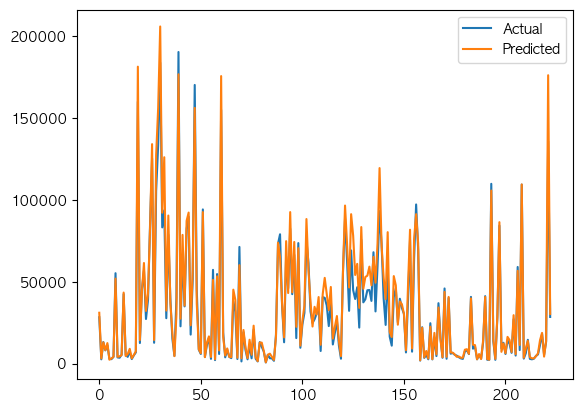

In [50]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet, BayesianRidge
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings("ignore")
models = {
    'Linear Regression': LinearRegression(),
    'BayesianRidge': BayesianRidge(),
    'Ridge Regression': Ridge(),
    #'Neural Net': MLPRegressor(max_iter=5000),
    'Lasso Regression': Lasso(),
    'Elastic Net': ElasticNet(),
    'Decision Tree': DecisionTreeRegressor(),
    'Random Forest': RandomForestRegressor(),
    'Gradient Boosting': GradientBoostingRegressor(),
    'SVR': SVR(),
    'K-Nearest Neighbors': KNeighborsRegressor()
}


# MAPE 계산 함수
def calculate_mape(y_true, y_pred):
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
    
def future_prediction1(df,model):
    features = df[['총인구수(명)','유치원 수','초등학교 수', '출생건수', '사망건수', '혼인건수','이혼건수']]
    target = df['학령인구(명)']
    #X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.0, random_state=42)
    
    #model = DecisionTreeRegressor()#n_estimators=50,random_state=42)
    model.fit(features, target)

    #y_pred = model.predict(X_test)
    #print(y_pred)

    return model

cluster = split_by_region(sort_cluster)

coll = ['총인구수(명)','유치원 수','초등학교 수', '출생건수', '사망건수', '혼인건수', '이혼건수']#,'총인구수-학령인구(명)']

    #print(df_log[i])
merged_df_2022 = merged_df_2022.sort_values(by=['행정구역'])

actual_value = merged_df_2022['학령인구(명)'].tolist()


df_log = []
for i in range(len(cluster)):
    df_log.append(cluster[i].applymap(lambda x: np.log(x) if isinstance(x, (int, float)) else x))


cluster = split_by_region(sort_cluster)
for name, model in models.items():
    predict_not_scholar_population_rf = []
    #model = MLPRegressor(max_iter=5000)
    model1 = future_prediction1(merged_df,model)
    print()
    for i in range(len(df_log)):
           
        test = run_ARIMA(df_log[i])#run_BayesianRidge(df_log[i])
        test = test.reset_index()
            
        print("◼", end = ' ')
 
        test = test.applymap(lambda x: np.exp(x) if isinstance(x, (int, float)) else x)
    
        #for j in range(len(test)):
            #test.loc[j,'총인구수-학령인구(명)'] = float(test.loc[j,'총인구수(명)']) - float(test.loc[j,'학령인구(명)'])
      
        #print(test)
        xx = model1.predict(np.array(test[coll]).reshape(-1,len(coll)))
        predict_not_scholar_population_rf.append(float(round(xx[0])))
        for j in range(len(test)):
            #test.loc[j,'총인구수-학령인구(명)'] = float(round(x[j]))
            test.loc[j,'학령인구(명)'] = float(xx[j])
            test['행정구역'] = str(cluster[i]['행정구역'].unique()[0])
        cluster[i] = pd.concat([cluster[i],test], ignore_index=True)
        cluster[i] = cluster[i].drop(['index'],axis=1)

    print('\n', name)
    mape = calculate_mape(actual_value,predict_not_scholar_population_rf)
    vis1(actual_value,predict_not_scholar_population_rf)
    #'[INFO]PREDICT',year+_,'FINISH')


# 제일 성능 좋은 RandomForestRegressor() 적용


◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ ◼ 
RandomForestRegressor
MAPE: 6.345706128211042


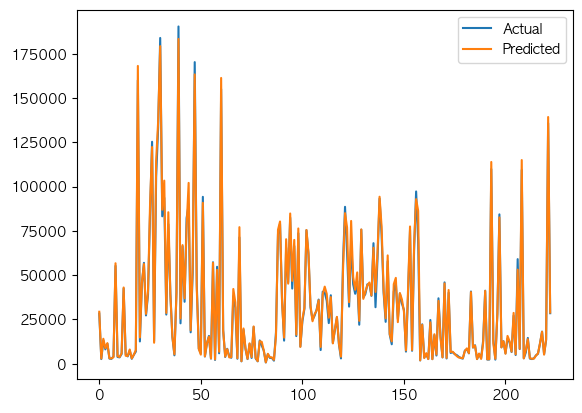

In [56]:
cluster = split_by_region(sort_cluster)

df_log = []
for i in range(len(cluster)):
    df_log.append(cluster[i].applymap(lambda x: np.log(x) if isinstance(x, (int, float)) else x))




predict_not_scholar_population_rf = []
model = RandomForestRegressor()#MLPRegressor(max_iter=5000)
model1 = future_prediction1(merged_df,model)
print()
for i in range(len(df_log)):
           
    test = run_ARIMA(df_log[i])#run_BayesianRidge(df_log[i])
    test = test.reset_index()
            
    print("◼", end = ' ')
 
    test = test.applymap(lambda x: np.exp(x) if isinstance(x, (int, float)) else x)
    
    xx = model1.predict(np.array(test[coll]).reshape(-1,len(coll)))
    
    predict_not_scholar_population_rf.append(float(round(xx[0])))
    for j in range(len(test)):
        test.loc[j,'학령인구(명)'] = float(xx[j])
        test['행정구역'] = str(cluster[i]['행정구역'].unique()[0])
    cluster[i] = pd.concat([cluster[i],test], ignore_index=True)
    cluster[i] = cluster[i].drop(['index'],axis=1)

print('\nRandomForestRegressor')
mape = calculate_mape(actual_value,predict_not_scholar_population_rf)
vis1(actual_value,predict_not_scholar_population_rf)

강원특별자치도 강릉시


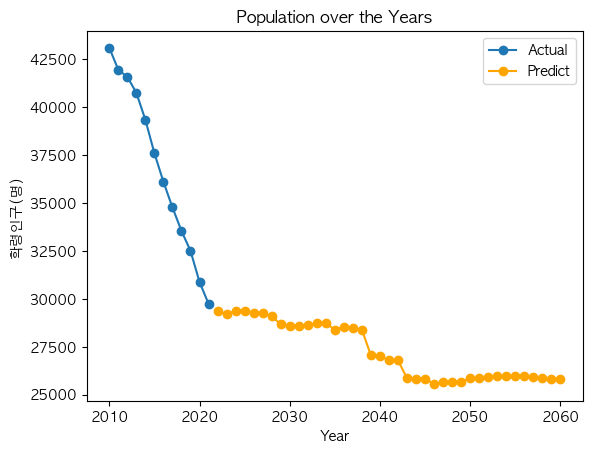

강원특별자치도 고성군


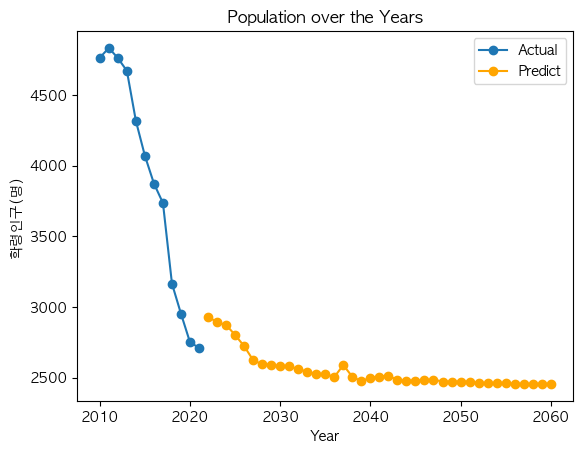

강원특별자치도 동해시


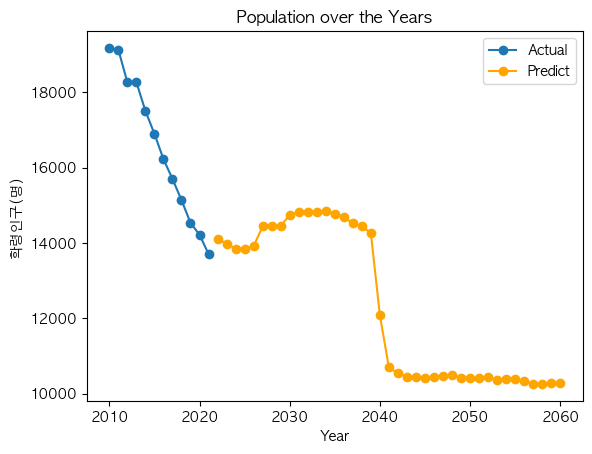

강원특별자치도 삼척시


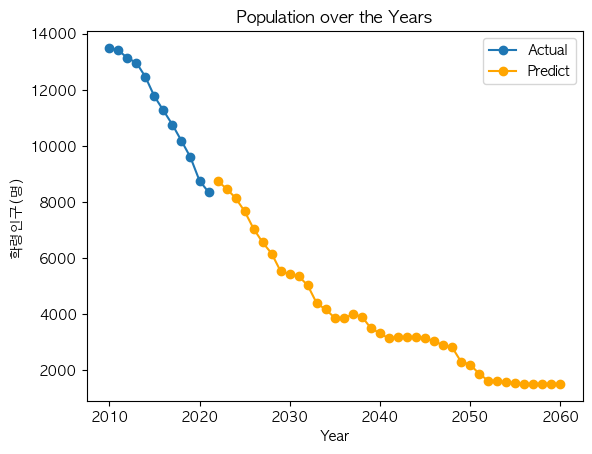

강원특별자치도 속초시


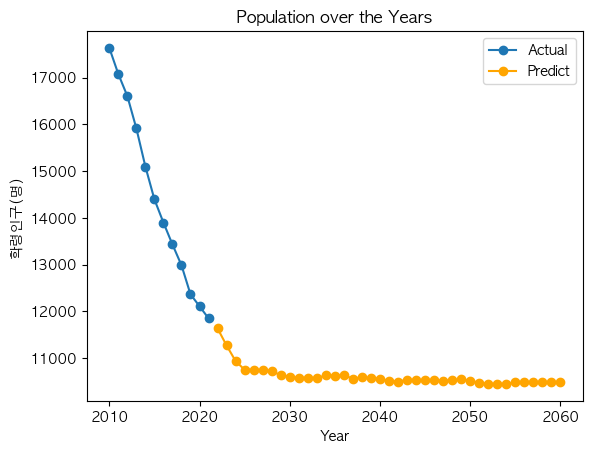

강원특별자치도 양구군


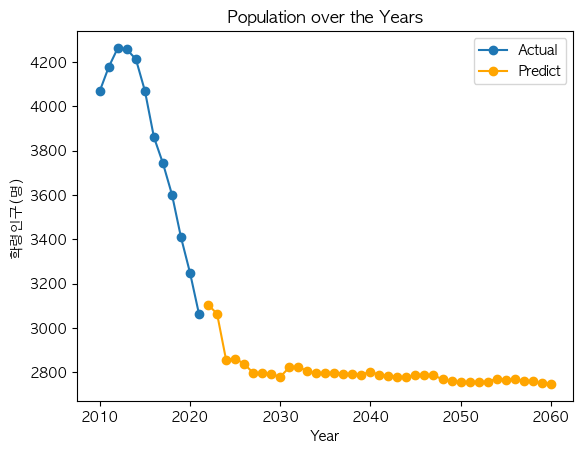

강원특별자치도 양양군


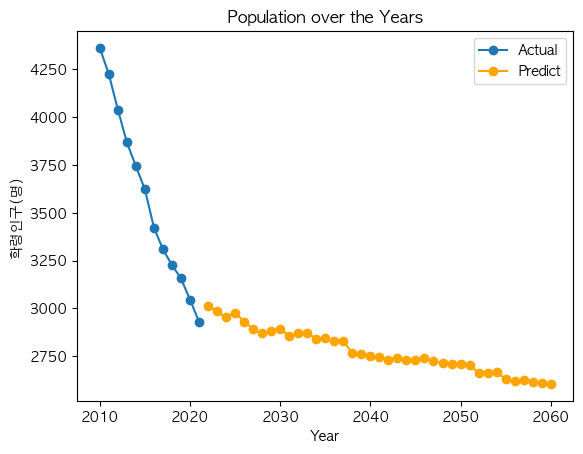

강원특별자치도 영월군


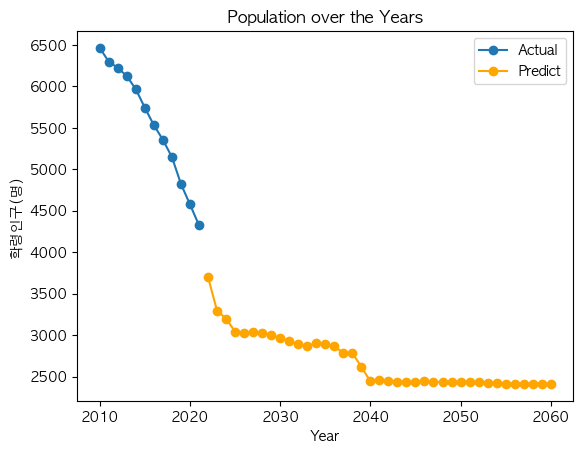

강원특별자치도 원주시


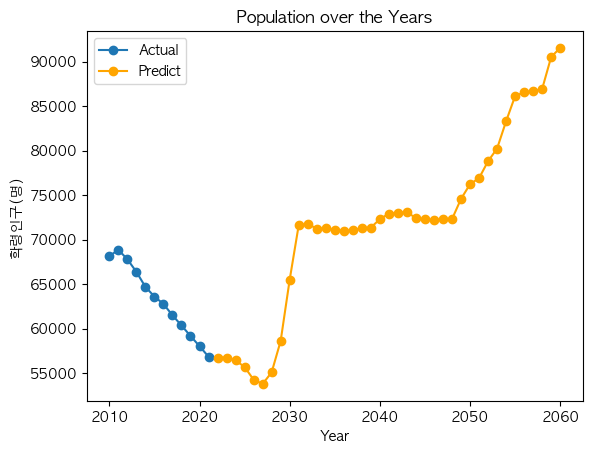

강원특별자치도 인제군


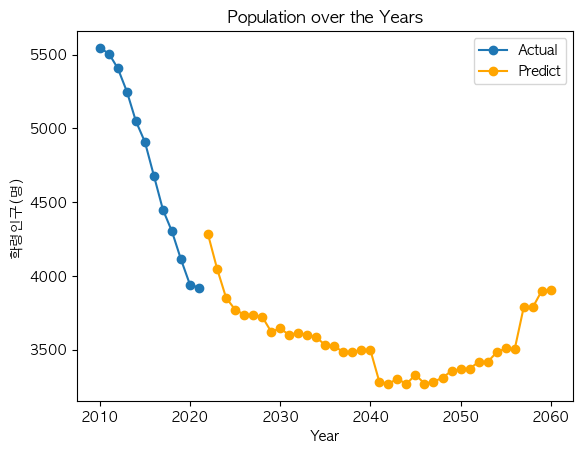

강원특별자치도 정선군


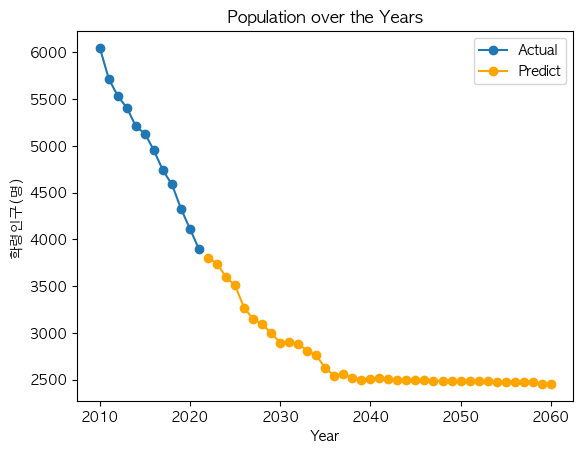

강원특별자치도 철원군


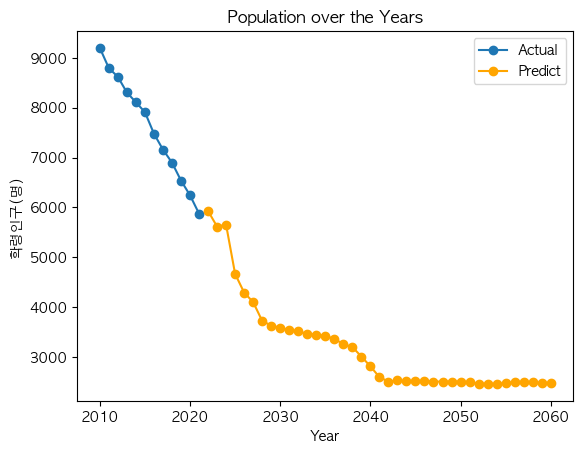

강원특별자치도 춘천시


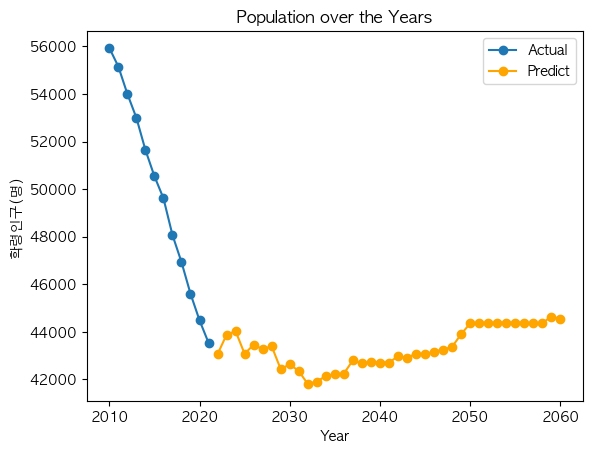

강원특별자치도 태백시


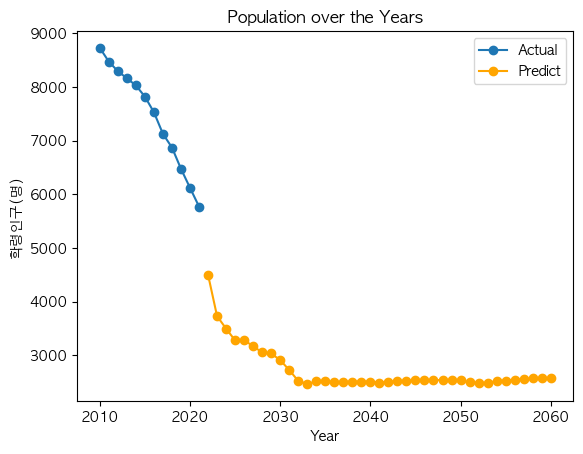

강원특별자치도 평창군


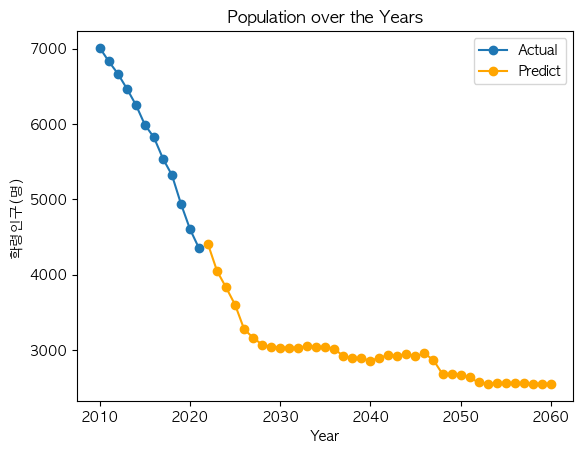

강원특별자치도 홍천군


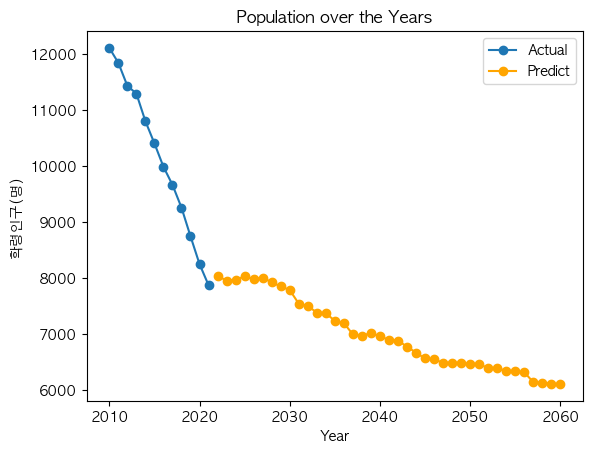

강원특별자치도 화천군


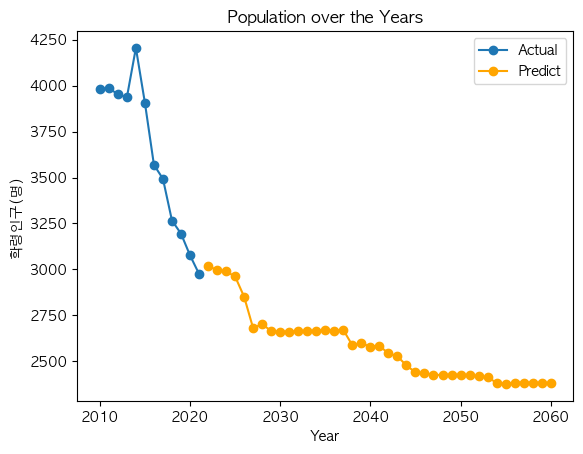

강원특별자치도 횡성군


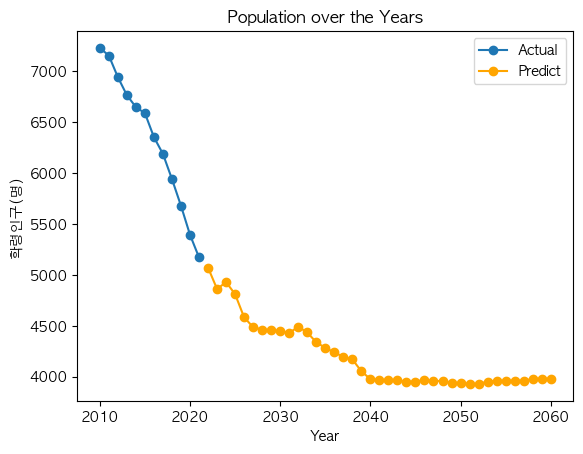

경기도 가평군


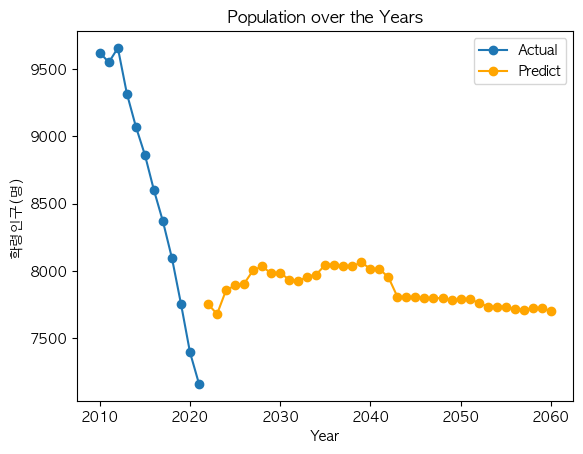

경기도 고양시


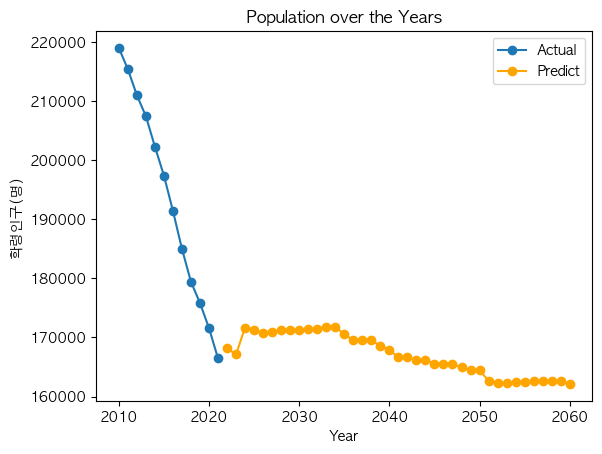

경기도 과천시


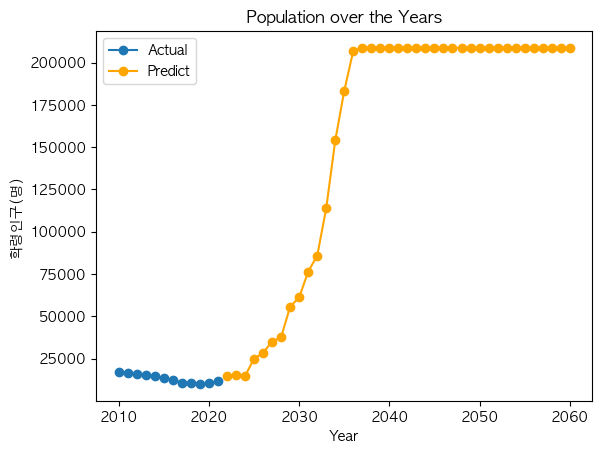

경기도 광명시


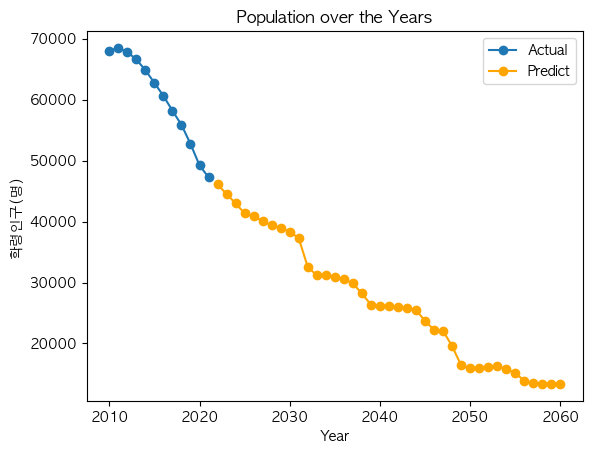

경기도 광주시


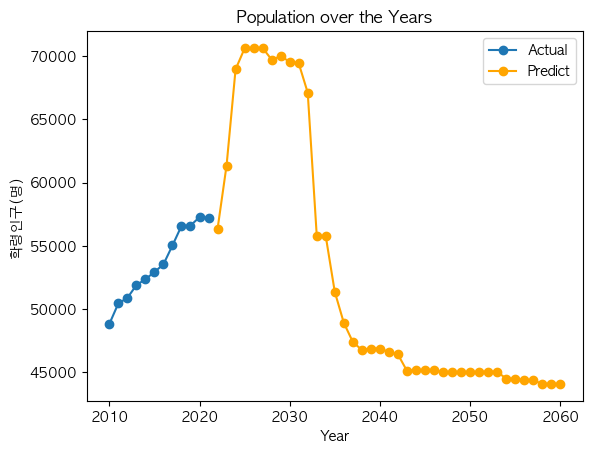

경기도 구리시


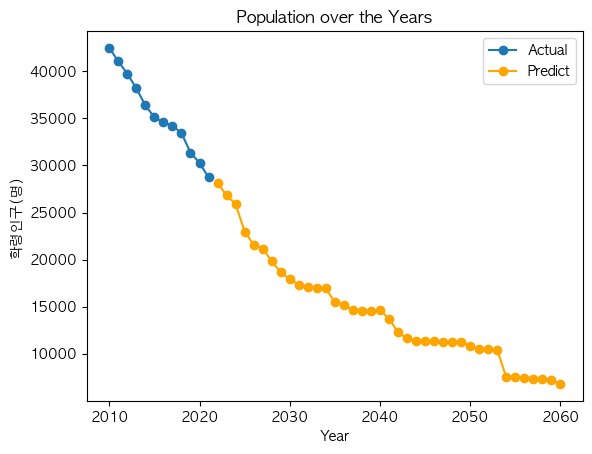

경기도 군포시


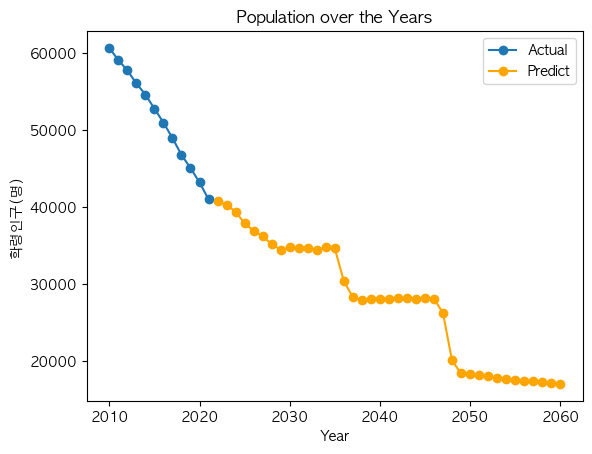

경기도 김포시


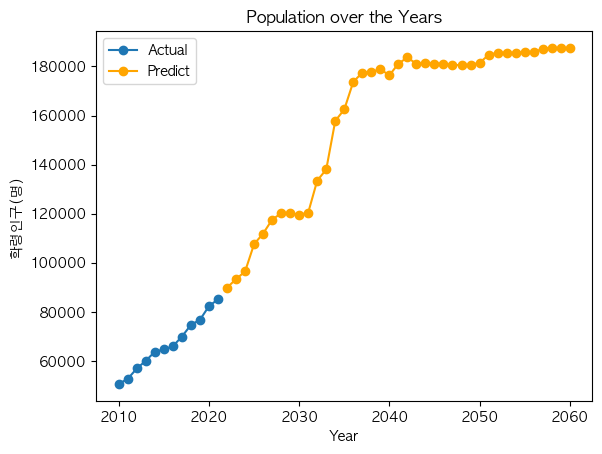

경기도 남양주시


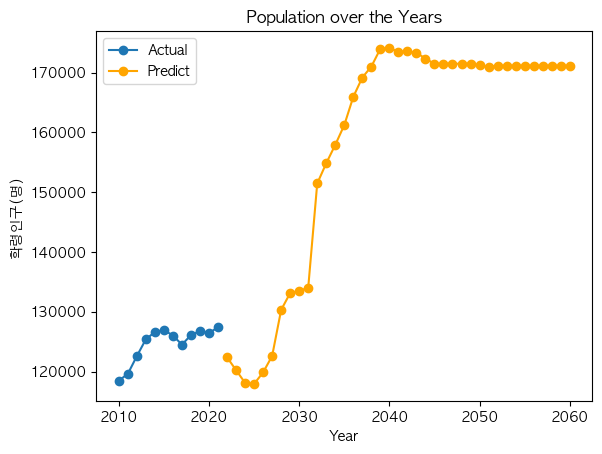

경기도 동두천시


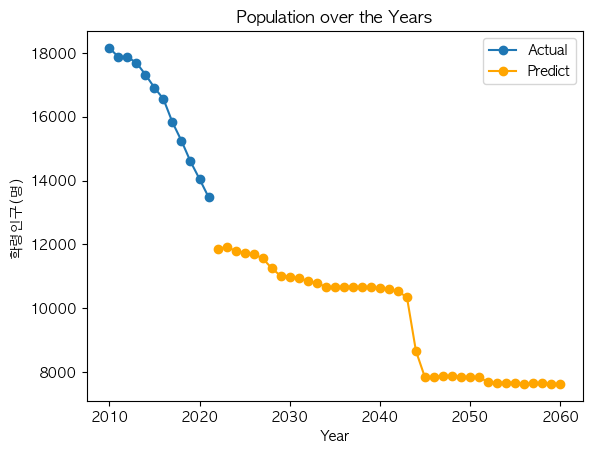

경기도 부천시


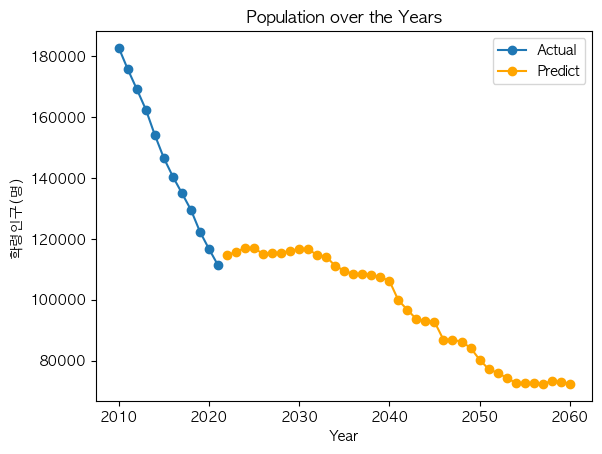

경기도 성남시


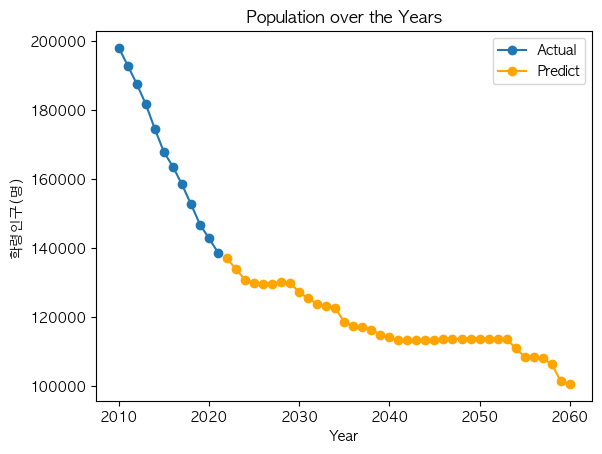

경기도 수원시


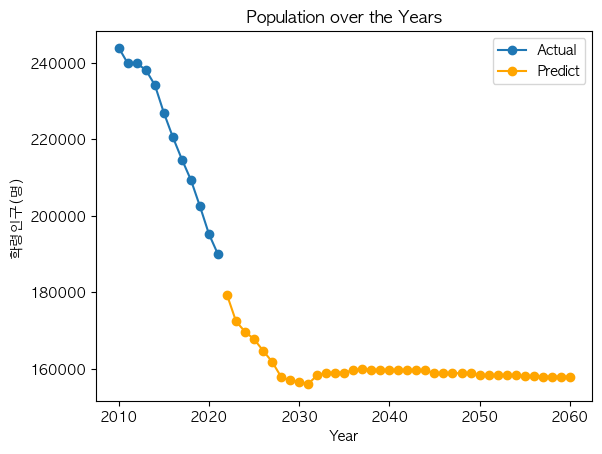

경기도 시흥시


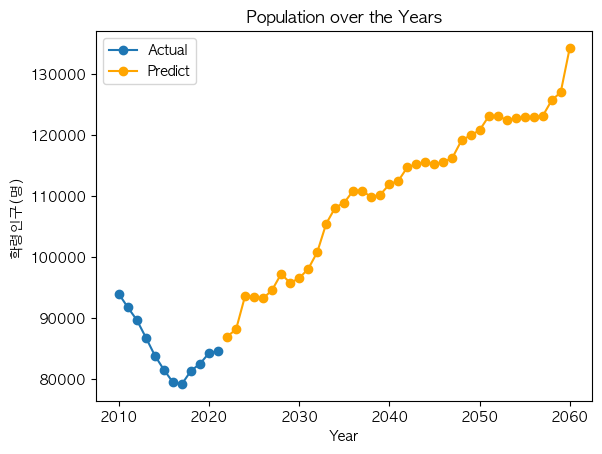

경기도 안산시


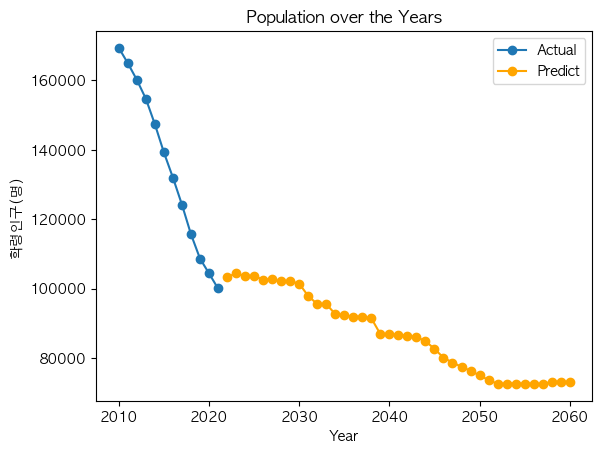

경기도 안성시


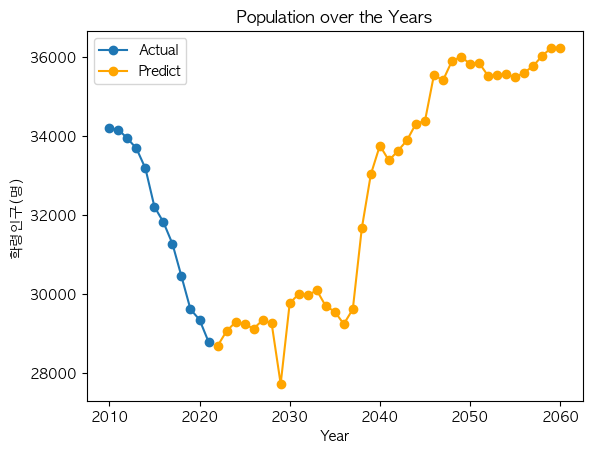

경기도 안양시


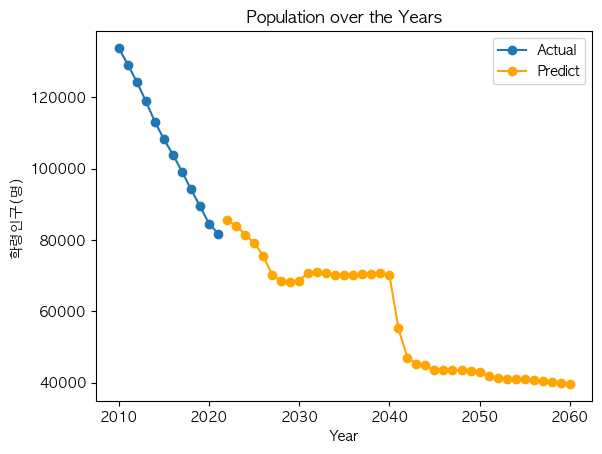

경기도 양주시


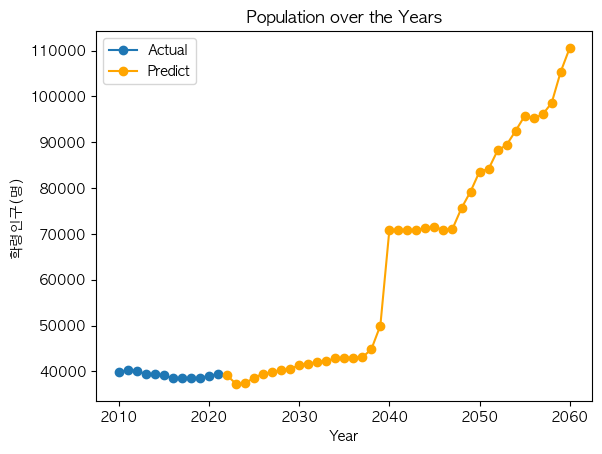

경기도 양평군


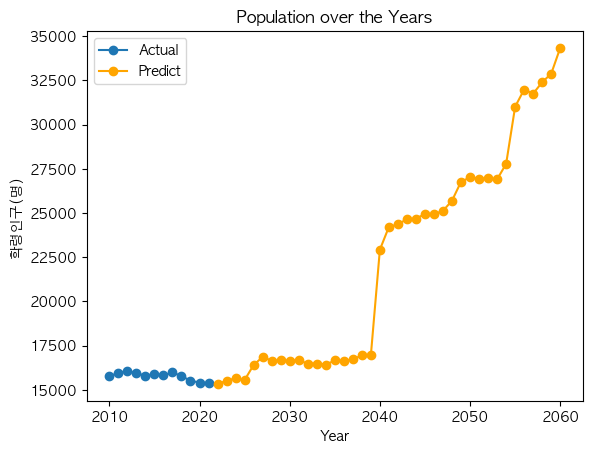

경기도 연천군


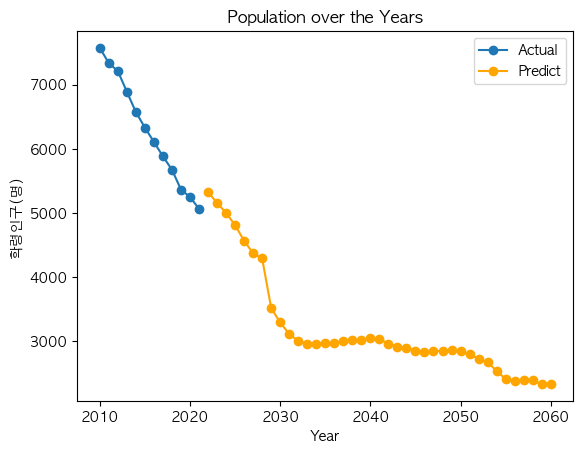

경기도 오산시


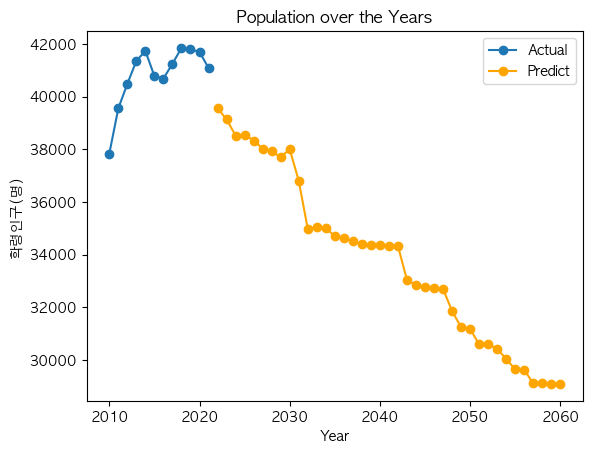

경기도 용인시


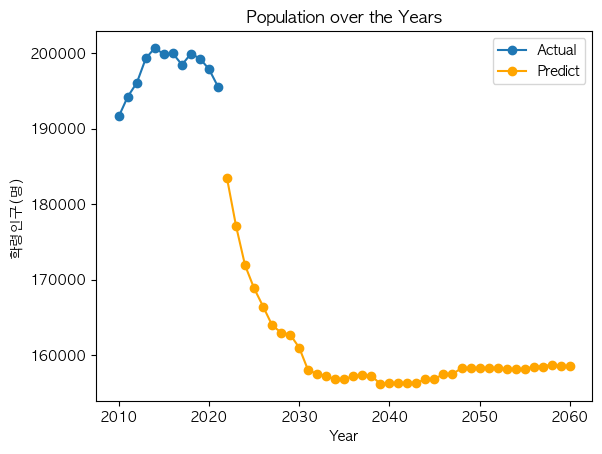

경기도 의왕시


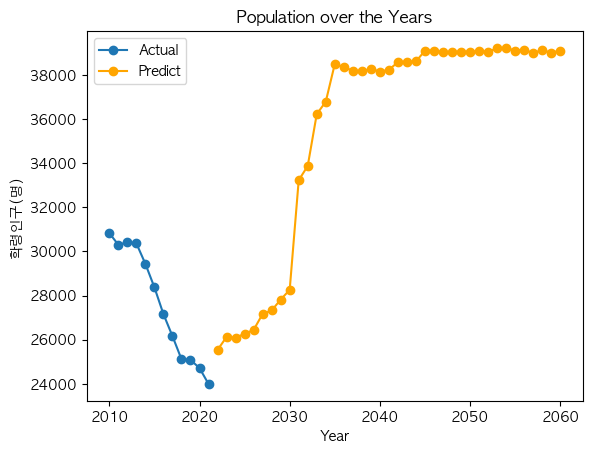

경기도 의정부시


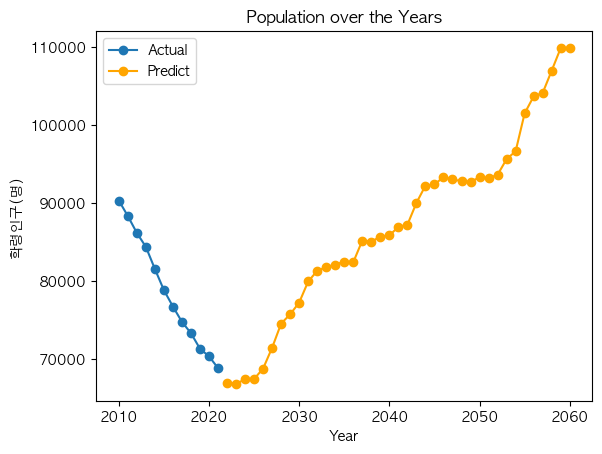

경기도 이천시


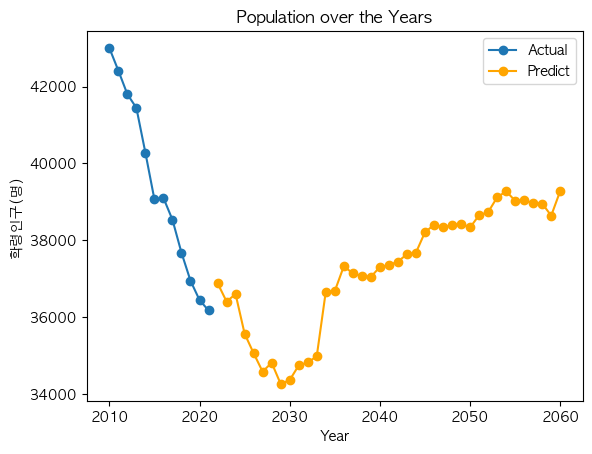

경기도 파주시


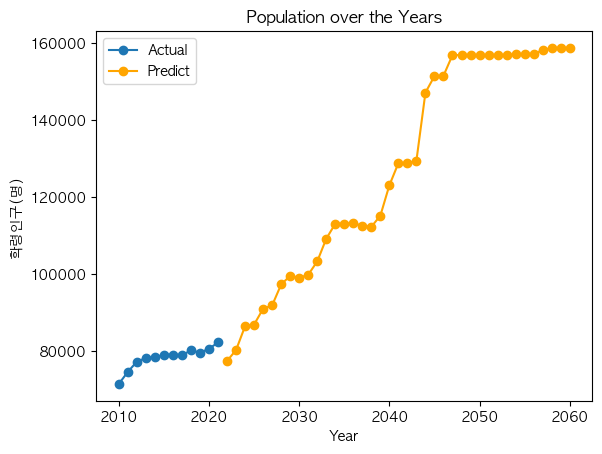

경기도 평택시


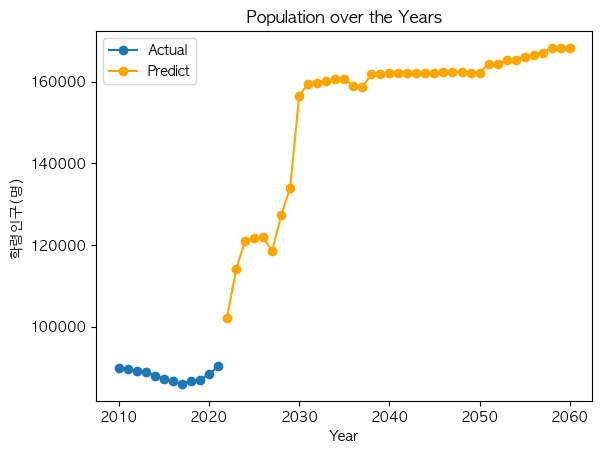

경기도 포천시


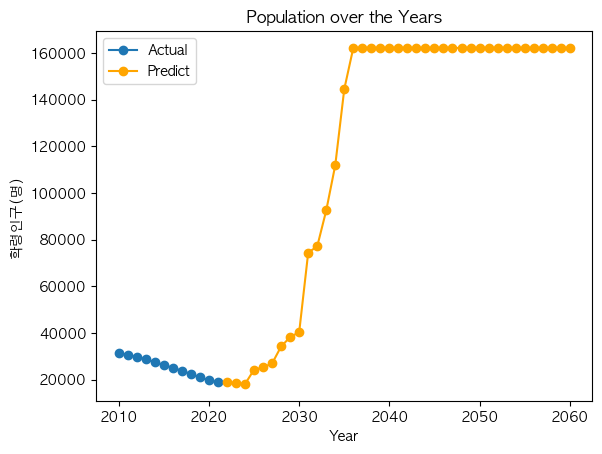

경기도 하남시


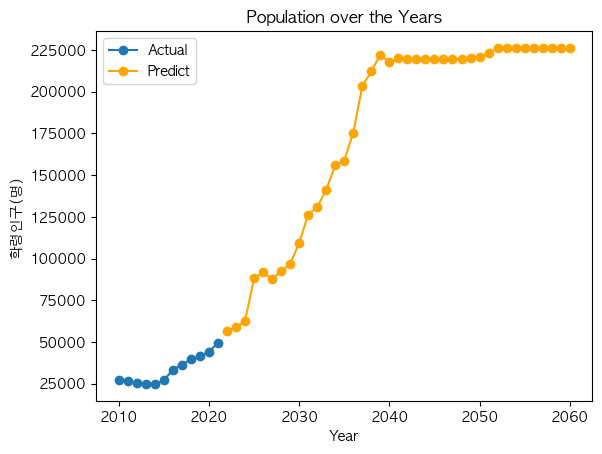

경기도 화성시


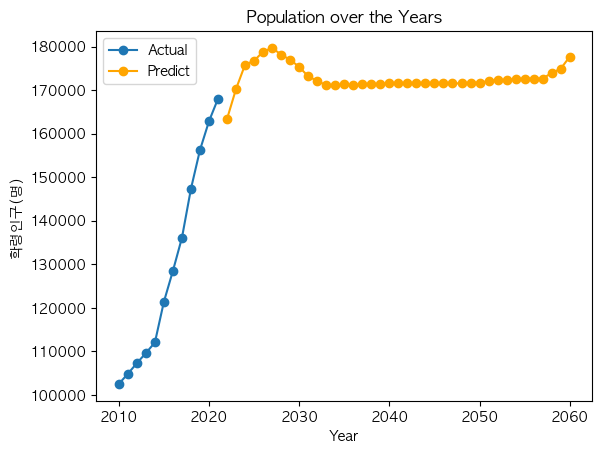

경상남도 거제시


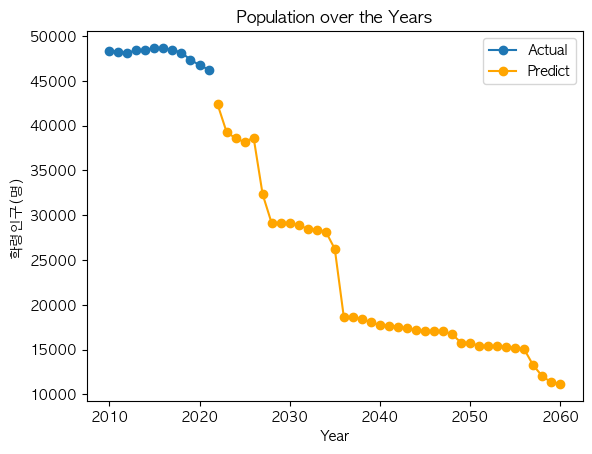

경상남도 거창군


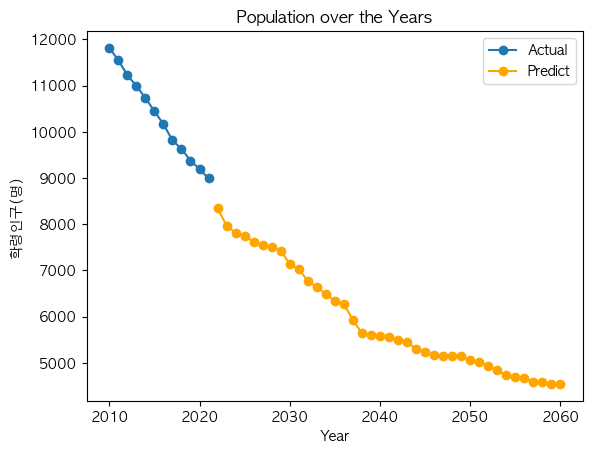

경상남도 고성군


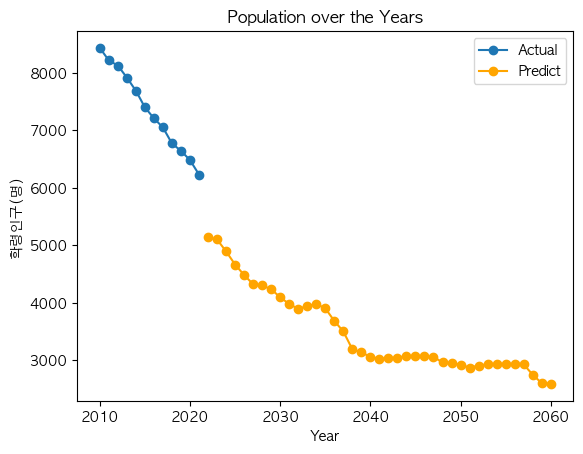

경상남도 김해시


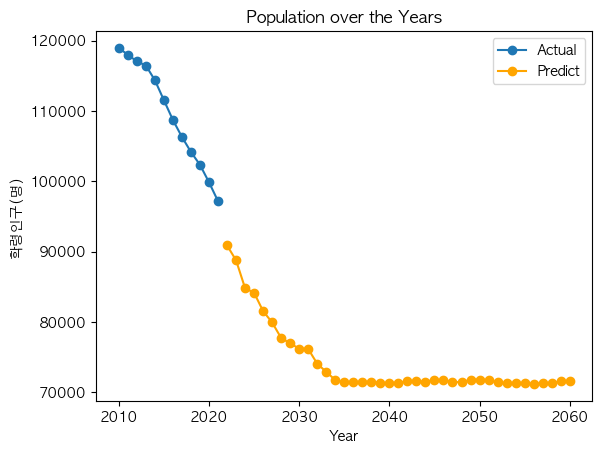

경상남도 남해군


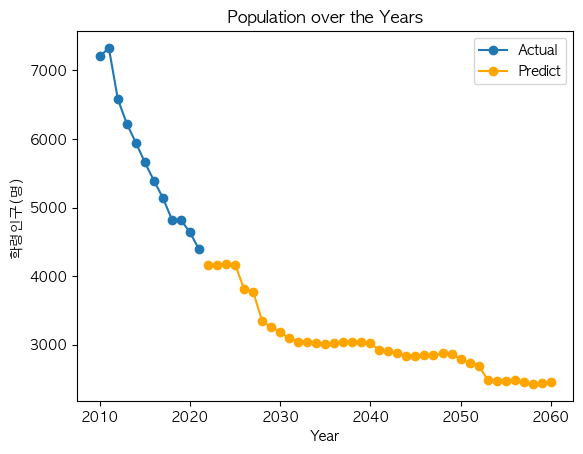

경상남도 밀양시


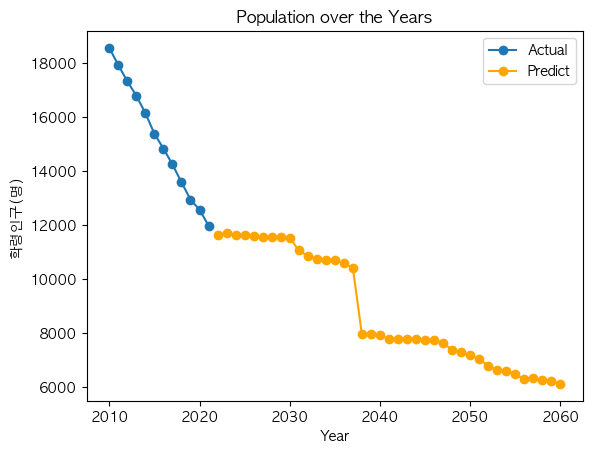

경상남도 사천시


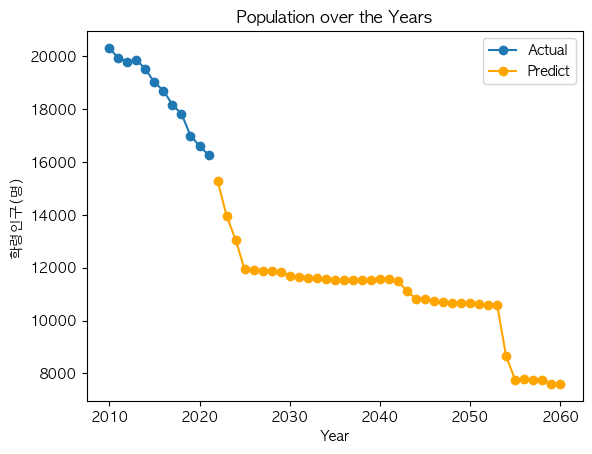

경상남도 산청군


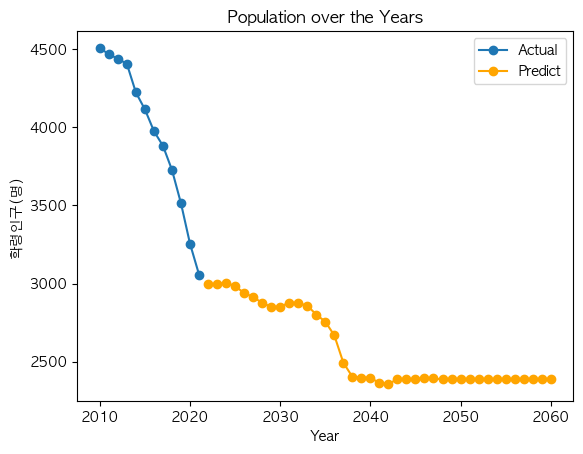

경상남도 양산시


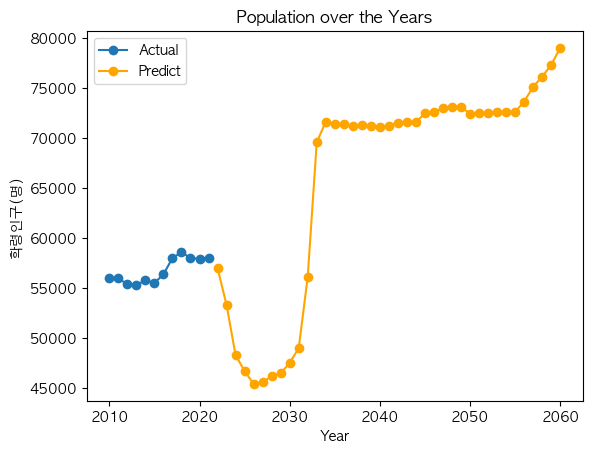

경상남도 의령군


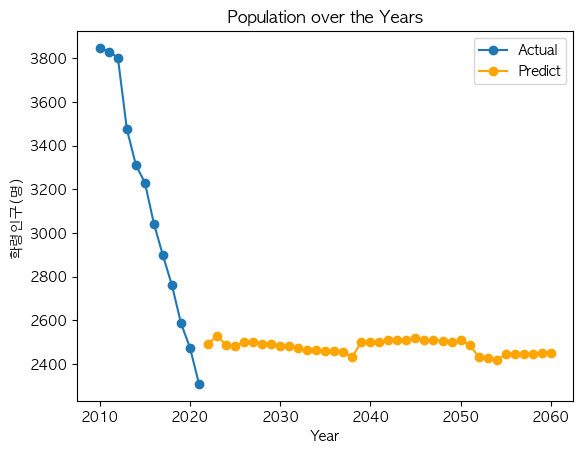

경상남도 진주시


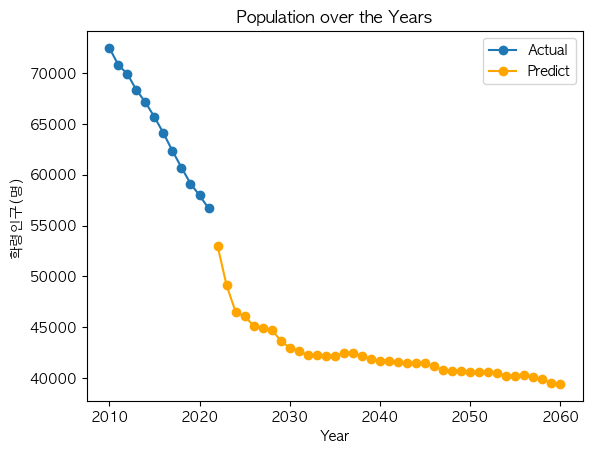

경상남도 창녕군


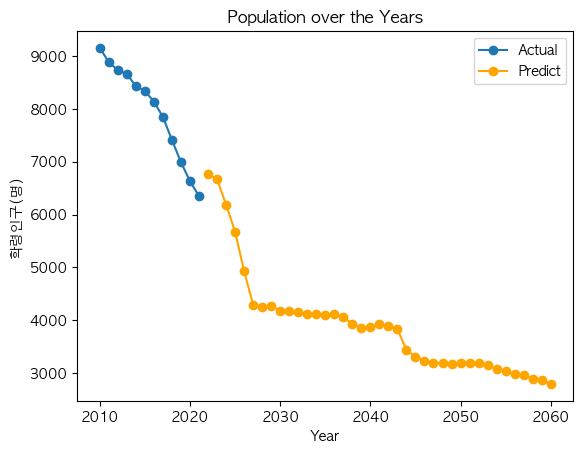

경상남도 창원시


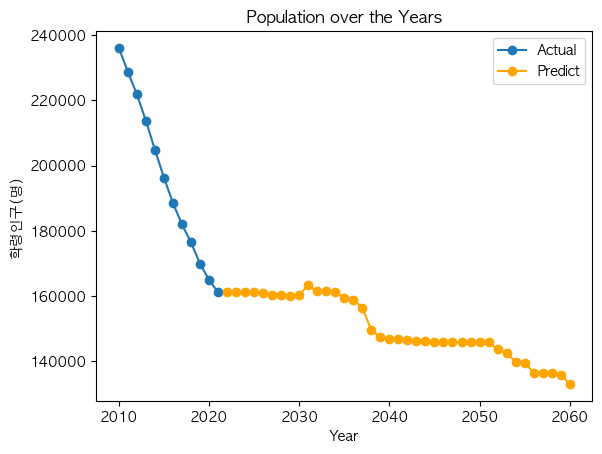

경상남도 통영시


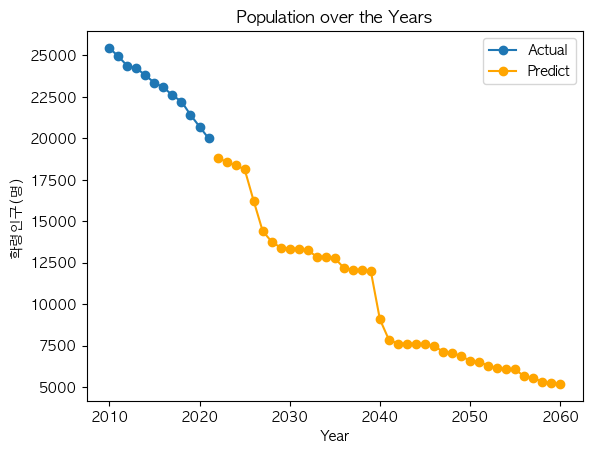

경상남도 하동군


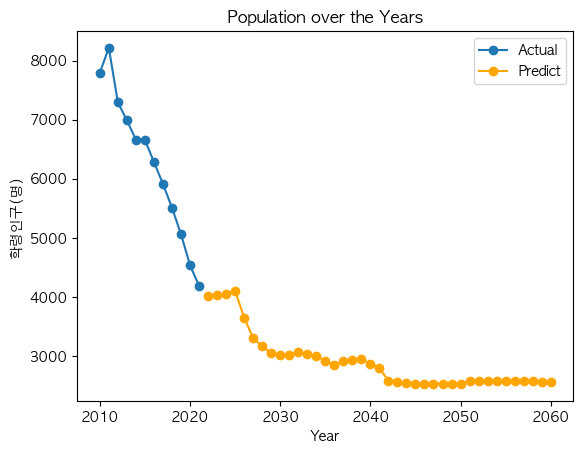

경상남도 함안군


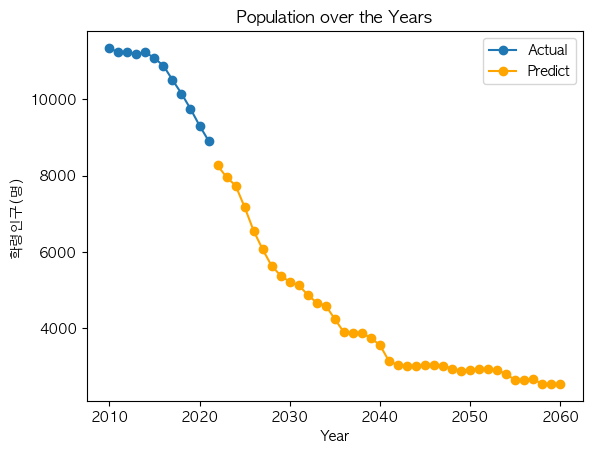

경상남도 함양군


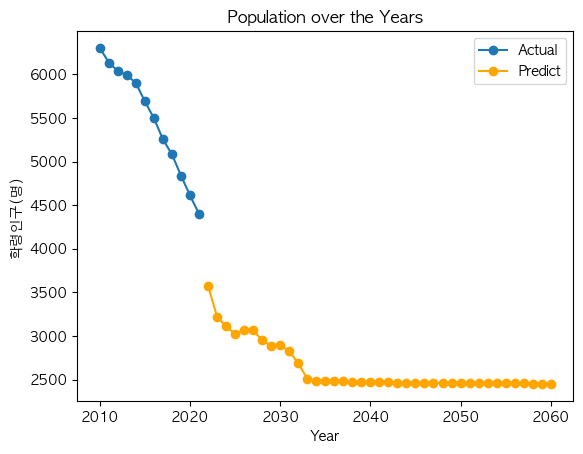

경상남도 합천군


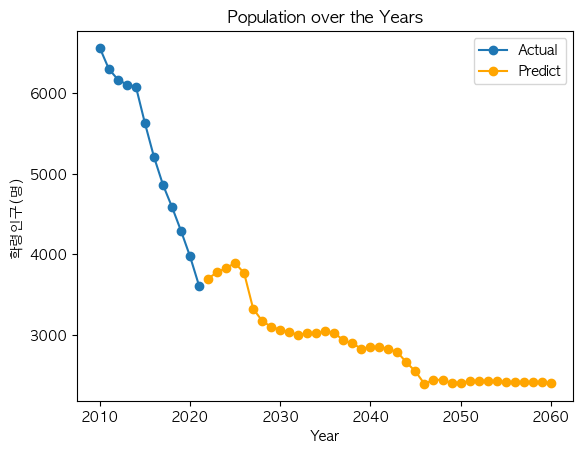

경상북도 경산시


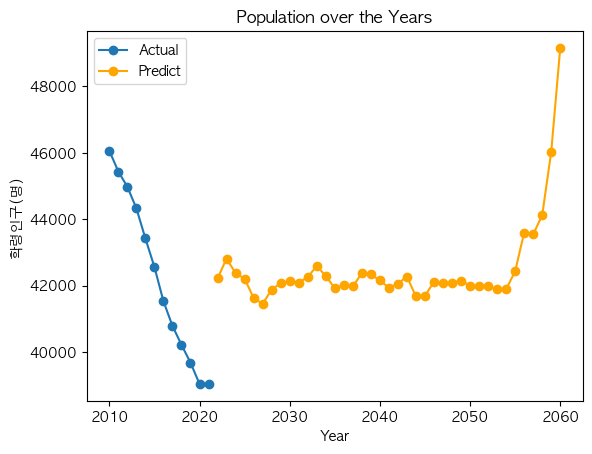

경상북도 경주시


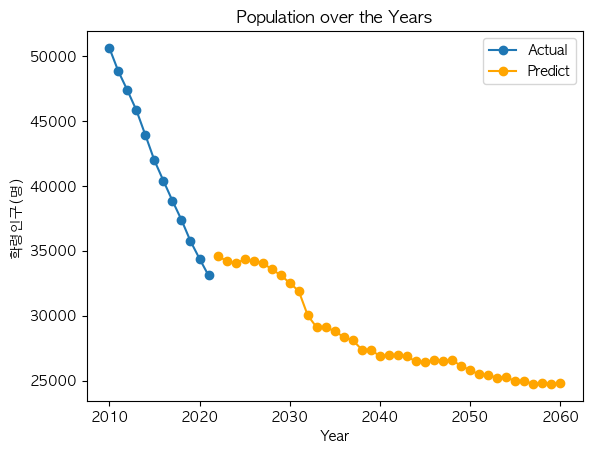

경상북도 고령군


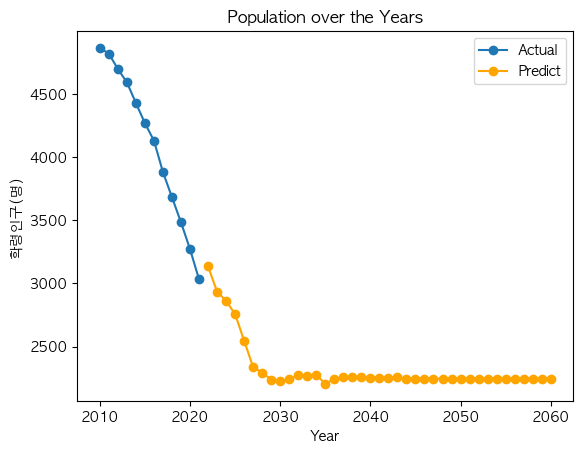

경상북도 구미시


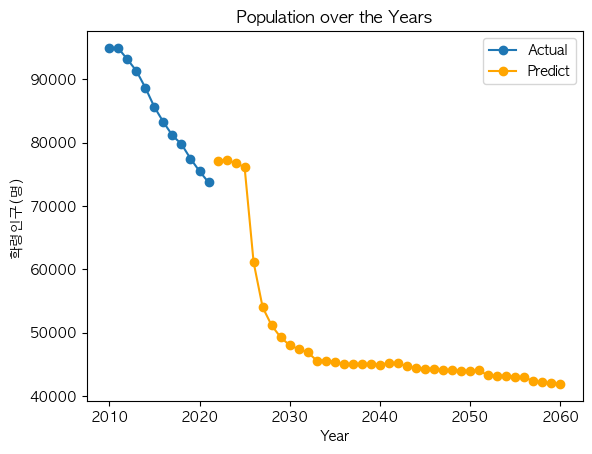

경상북도 군위군


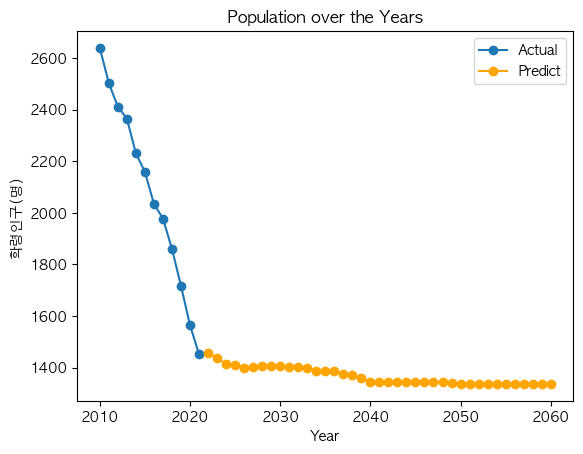

경상북도 김천시


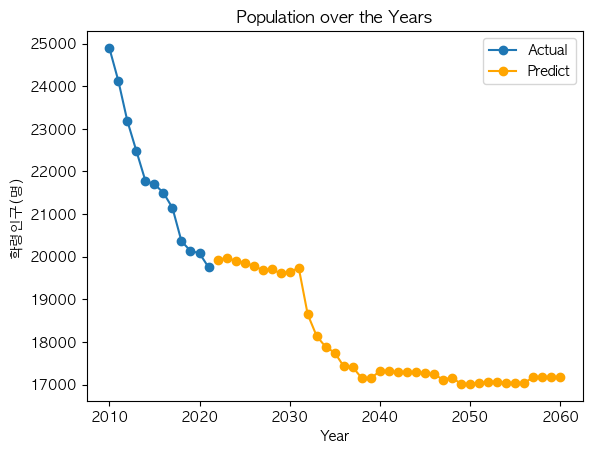

경상북도 문경시


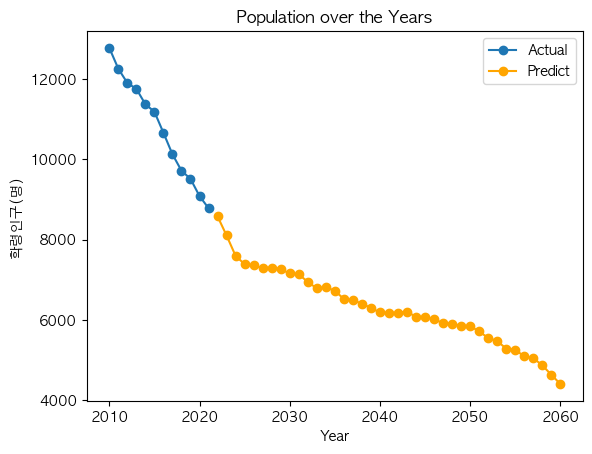

경상북도 봉화군


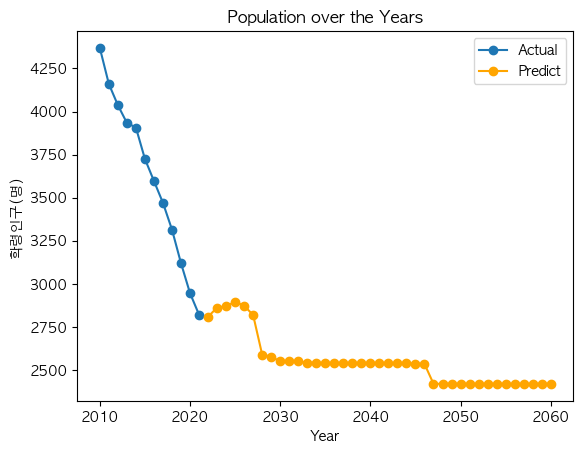

경상북도 상주시


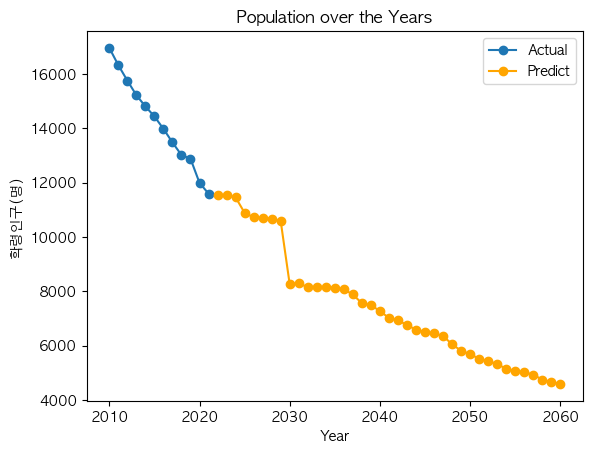

경상북도 성주군


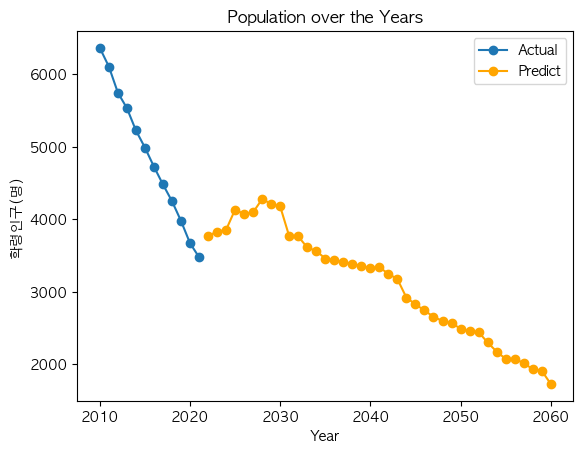

경상북도 안동시


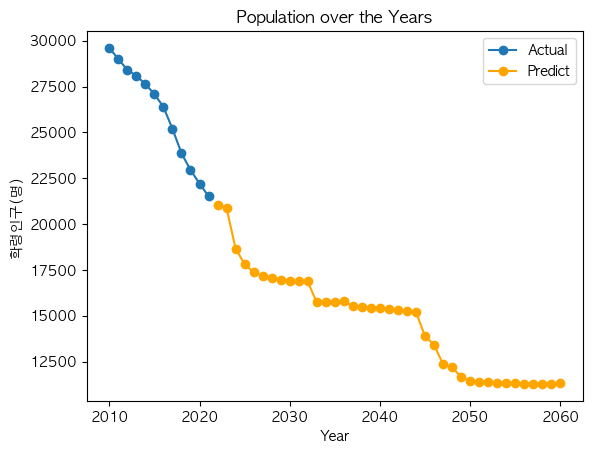

경상북도 영덕군


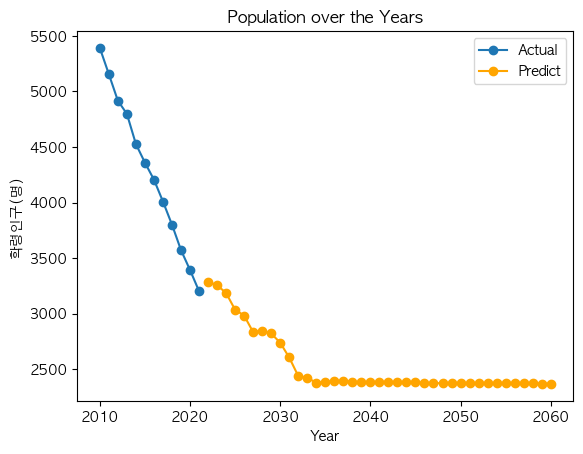

경상북도 영양군


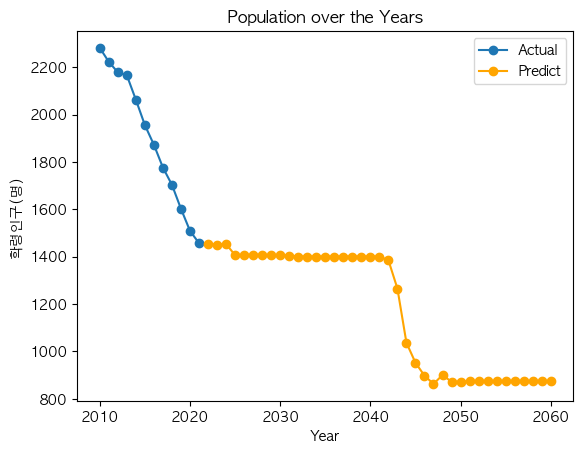

경상북도 영주시


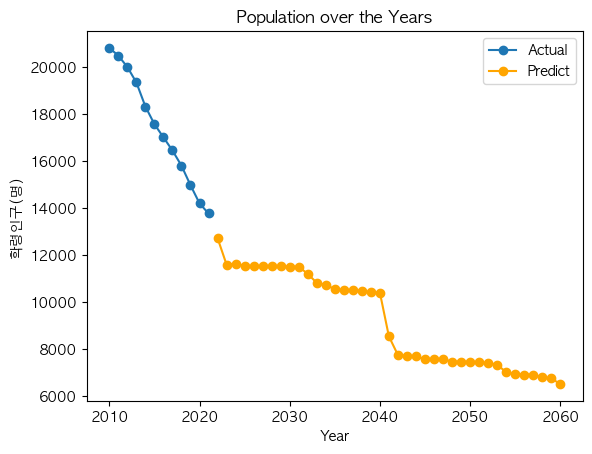

경상북도 영천시


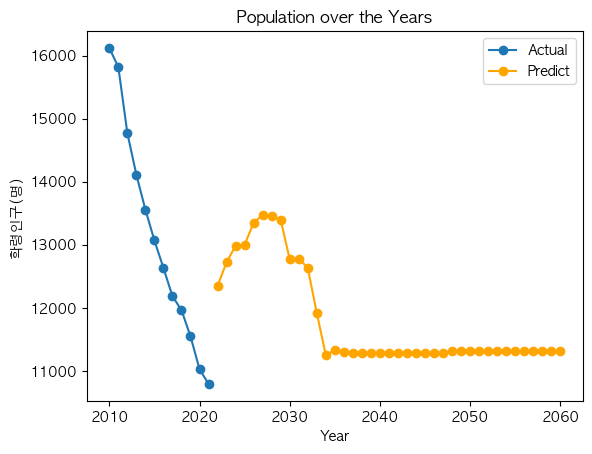

경상북도 예천군


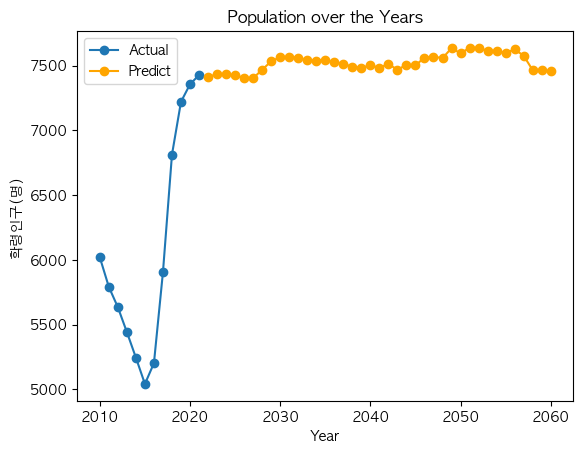

경상북도 울릉군


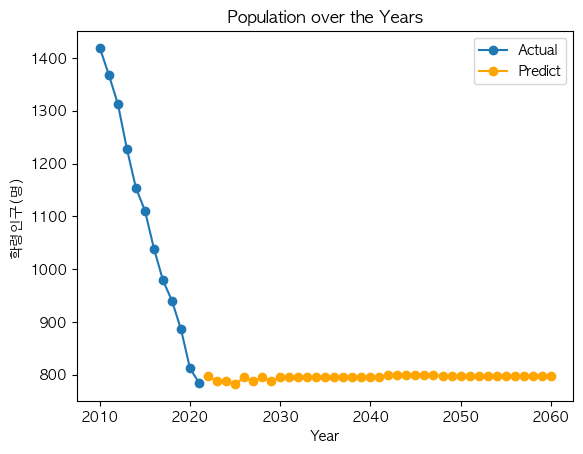

경상북도 울진군


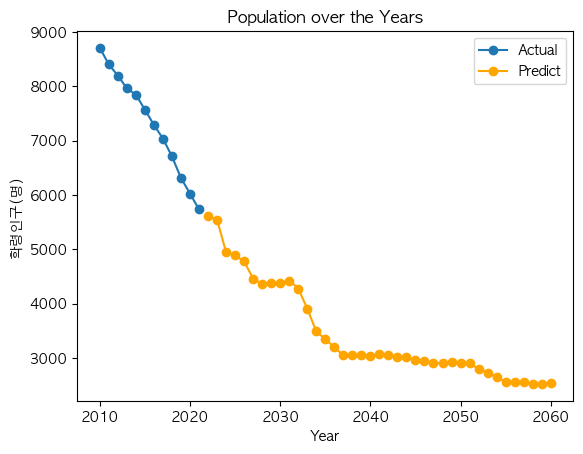

경상북도 의성군


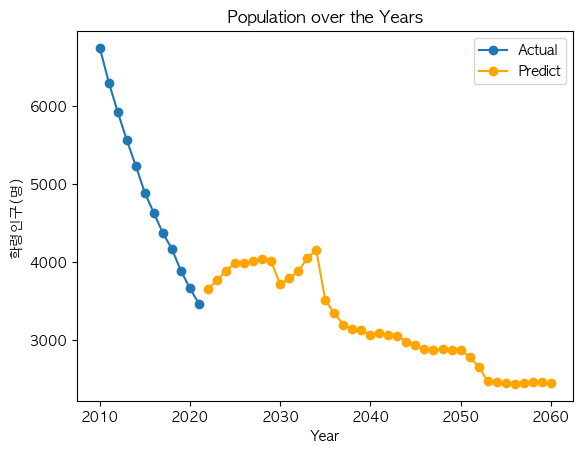

경상북도 청도군


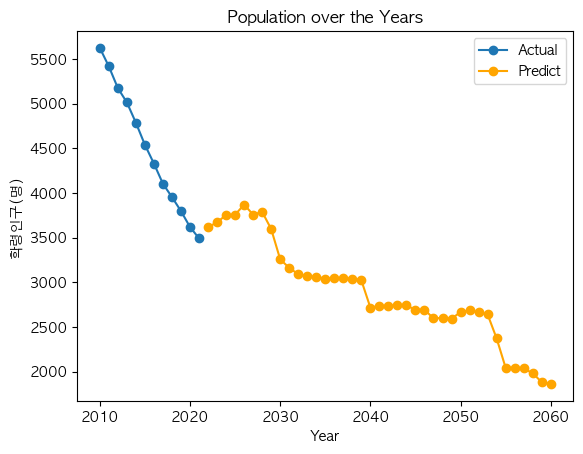

경상북도 청송군


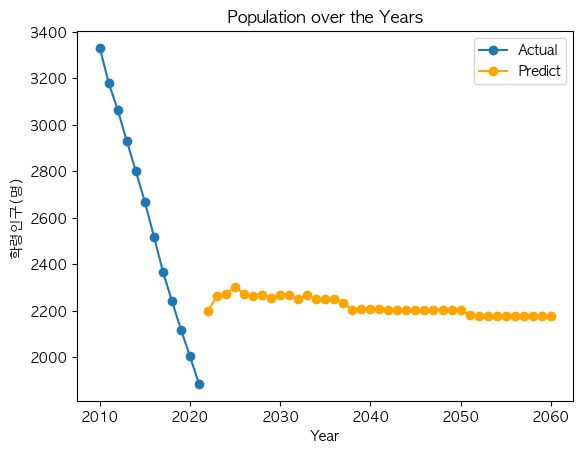

경상북도 칠곡군


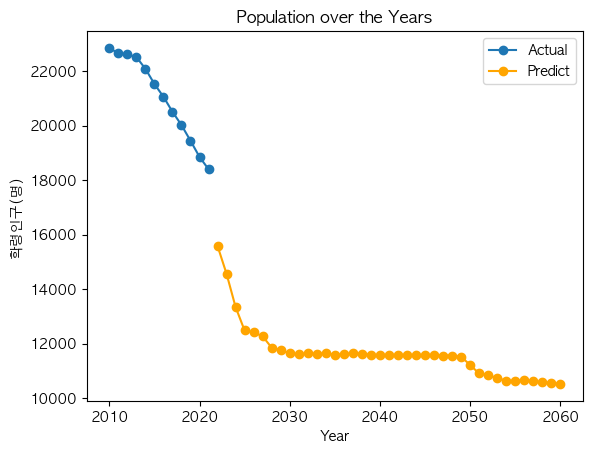

경상북도 포항시


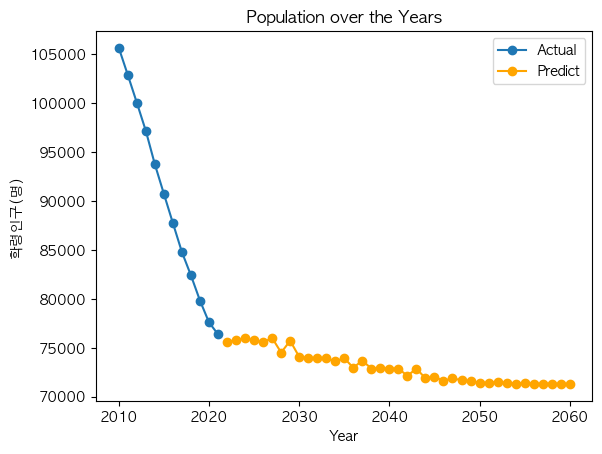

광주광역시 광산구


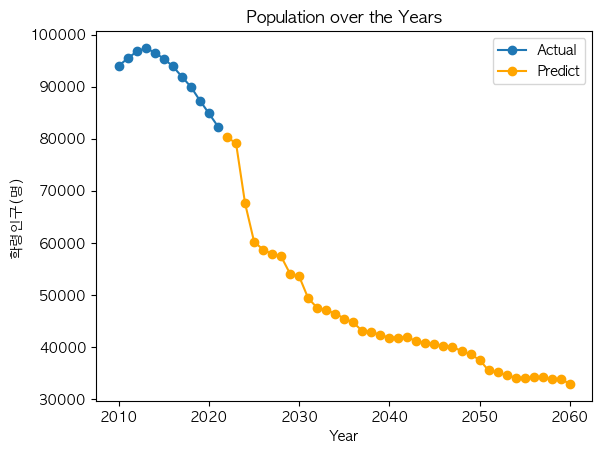

광주광역시 남구


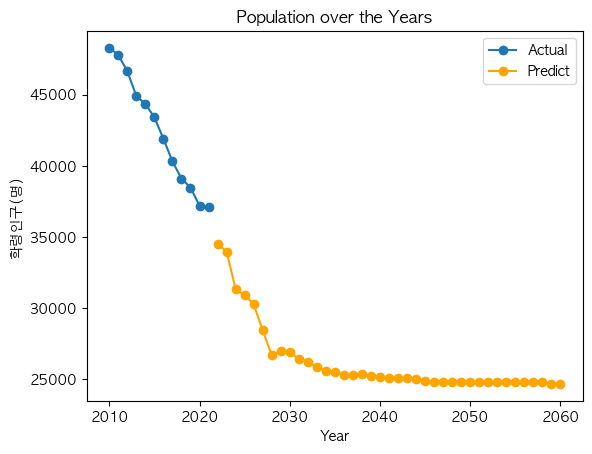

광주광역시 동구


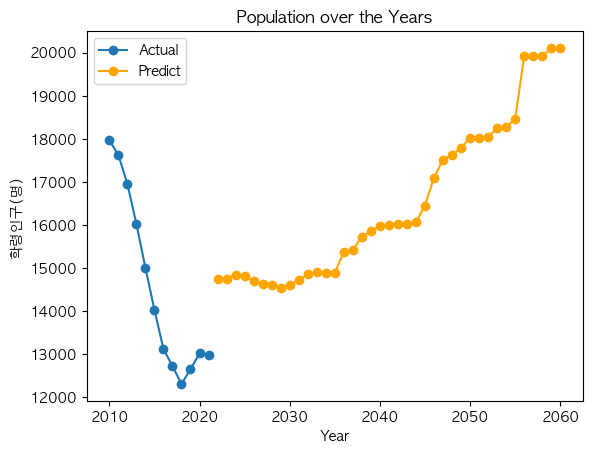

광주광역시 북구


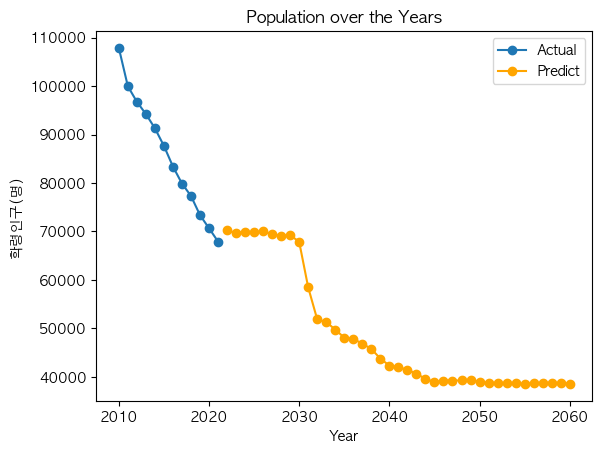

광주광역시 서구


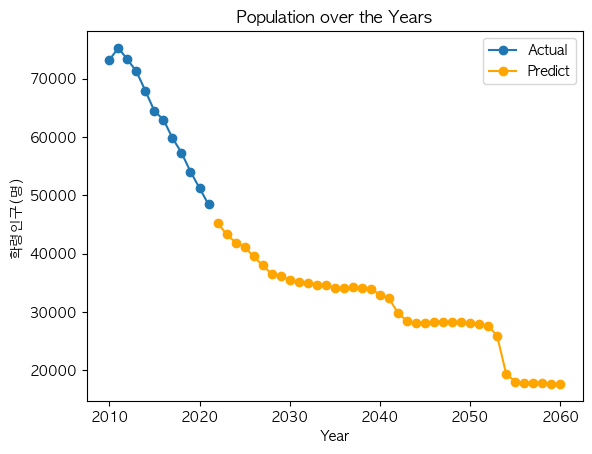

대구광역시 달서구


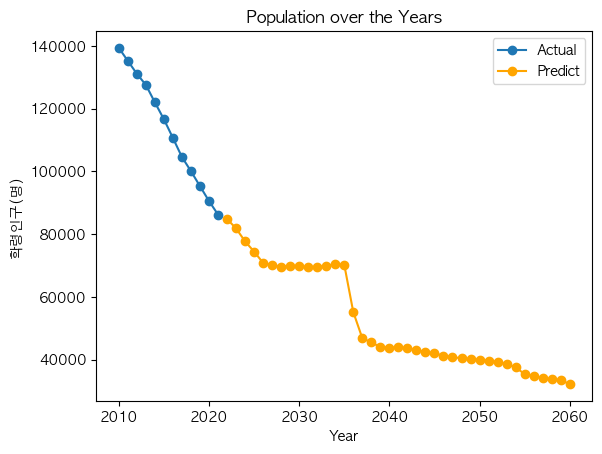

대구광역시 달성군


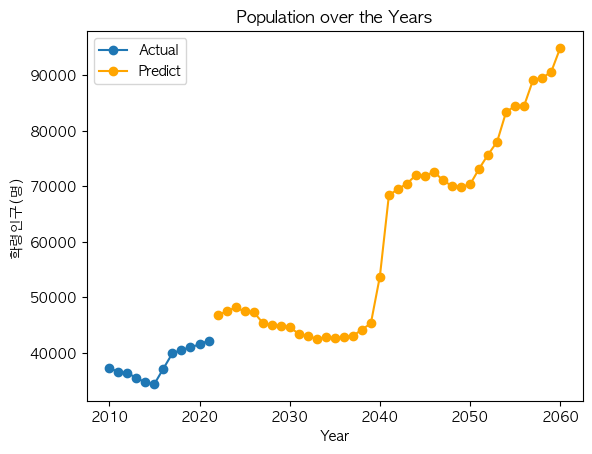

대구광역시 북구


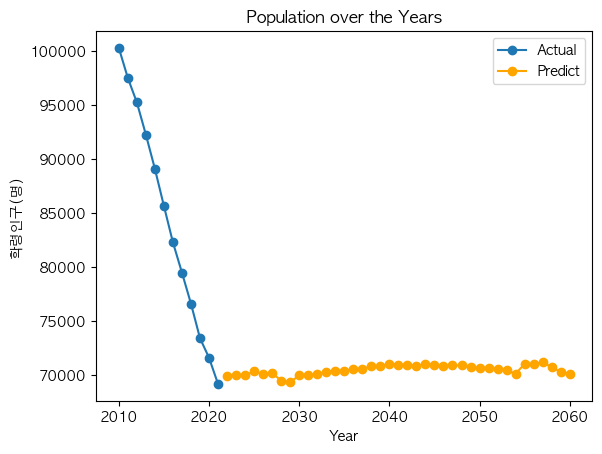

대구광역시 서구


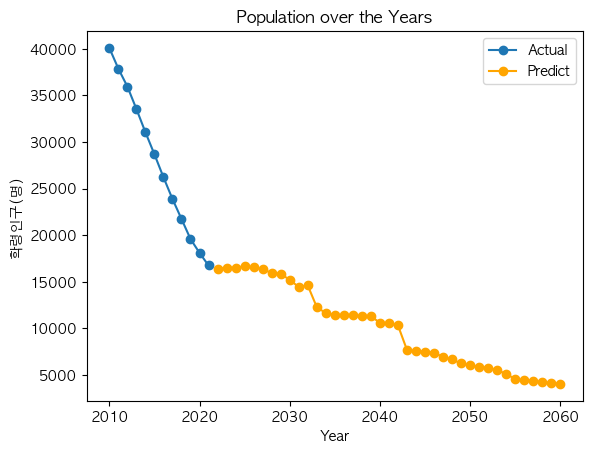

대구광역시 수성구


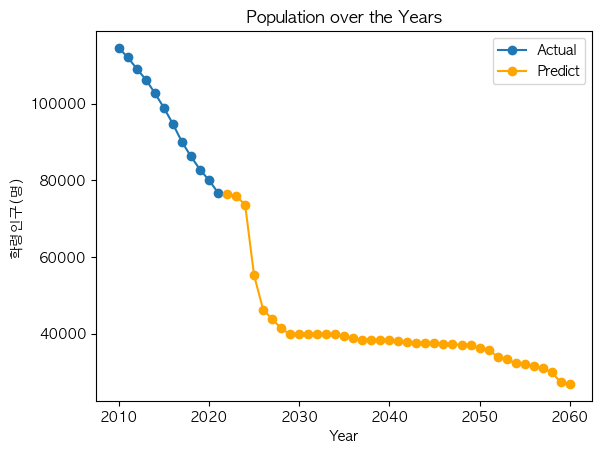

대구광역시 중구


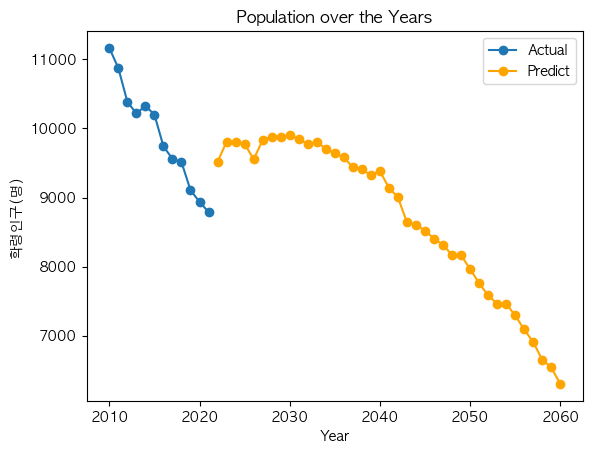

대전광역시 대덕구


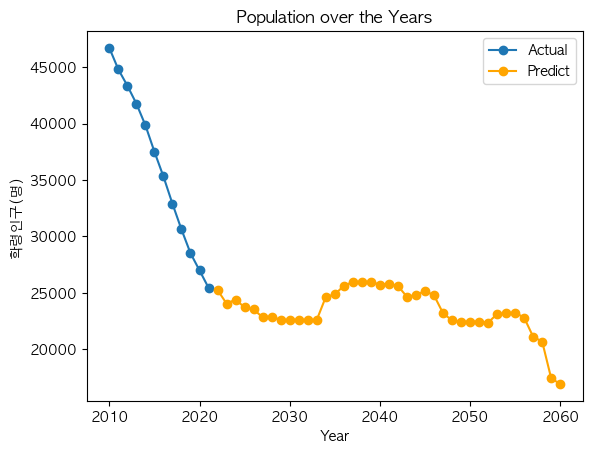

대전광역시 동구


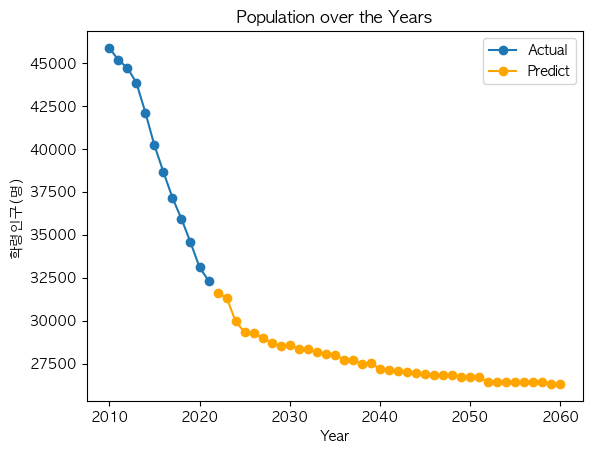

대전광역시 서구


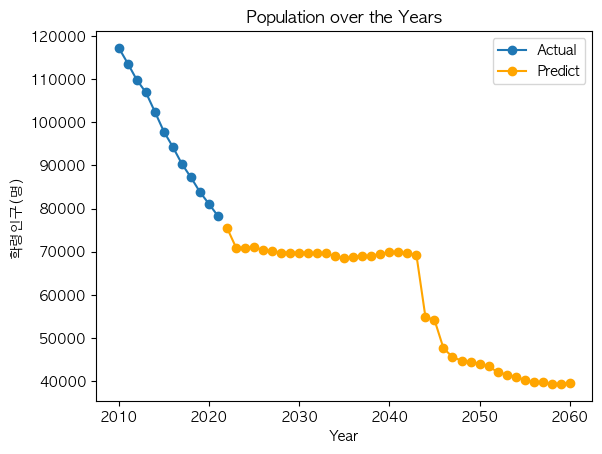

대전광역시 유성구


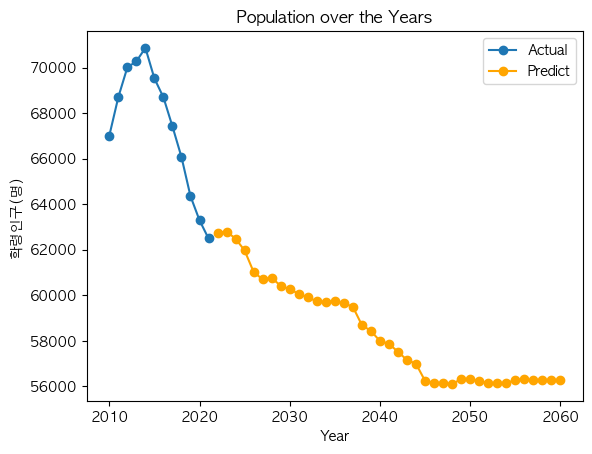

대전광역시 중구


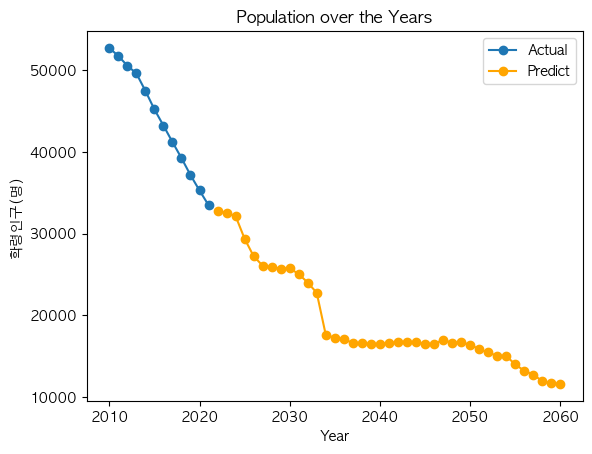

부산광역시 강서구


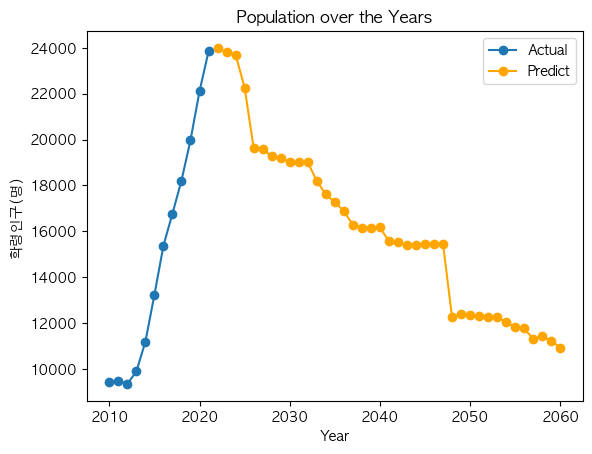

부산광역시 금정구


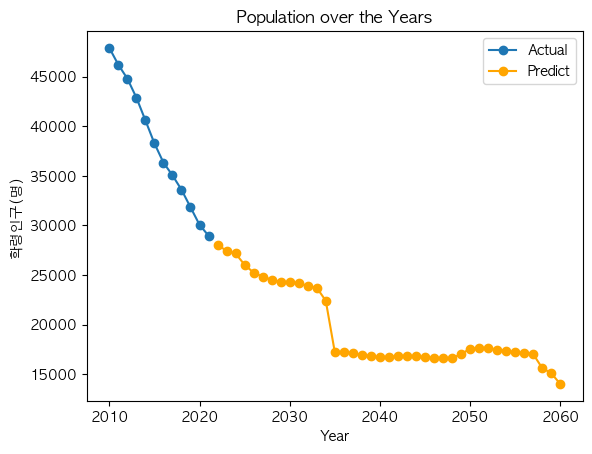

부산광역시 기장군


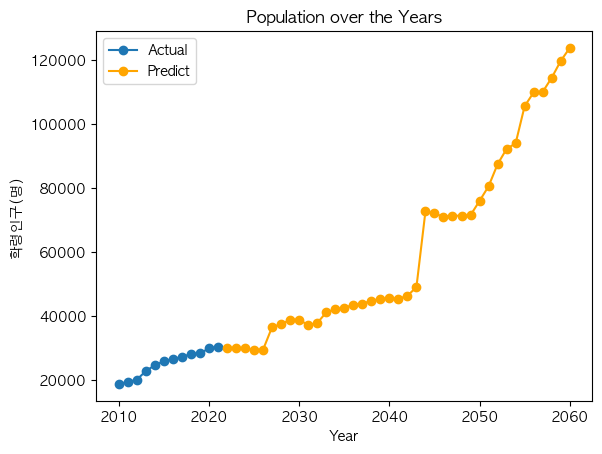

부산광역시 남구


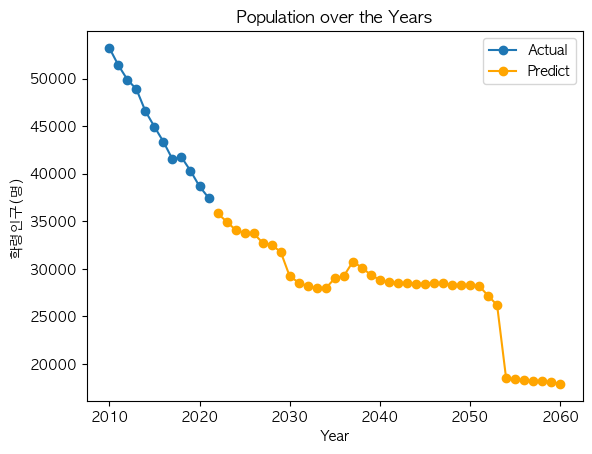

부산광역시 동구


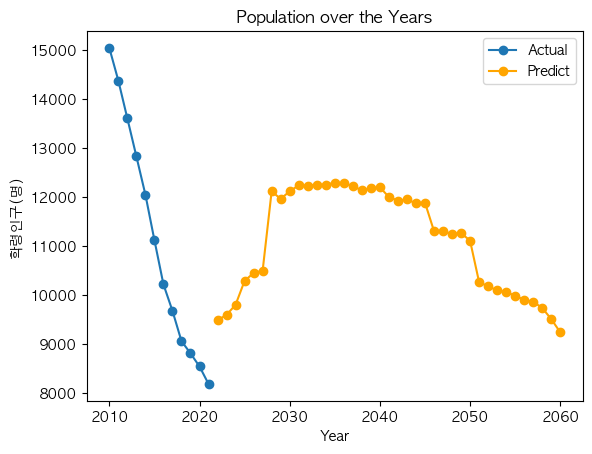

부산광역시 동래구


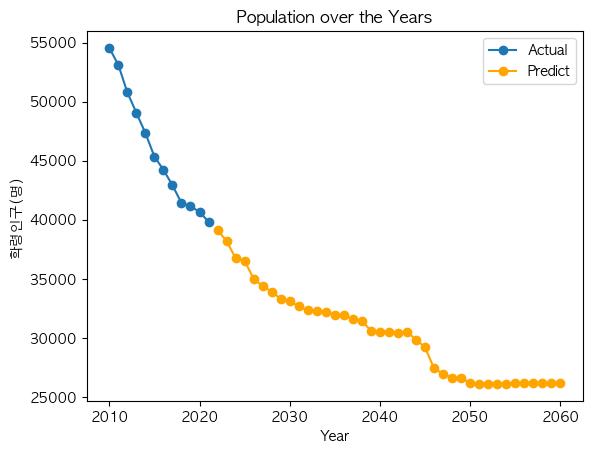

부산광역시 부산진구


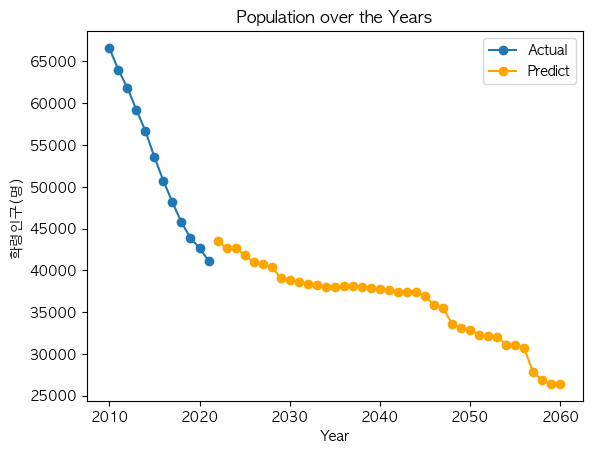

부산광역시 북구


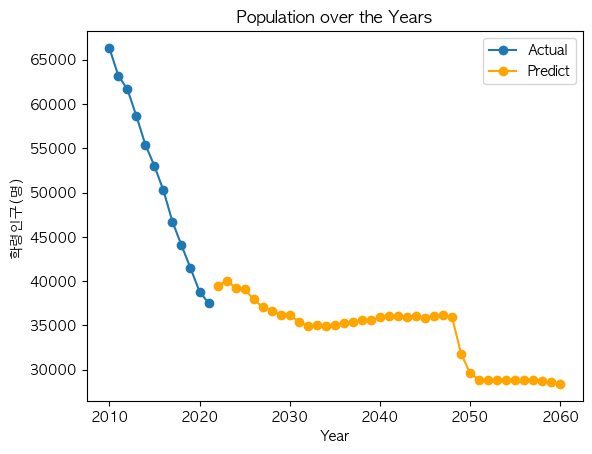

부산광역시 사상구


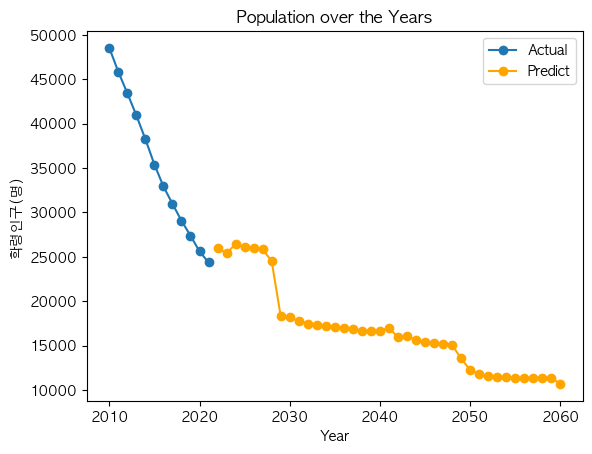

부산광역시 사하구


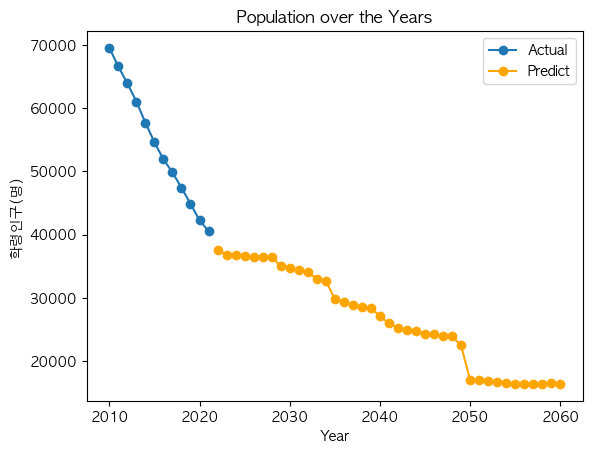

부산광역시 서구


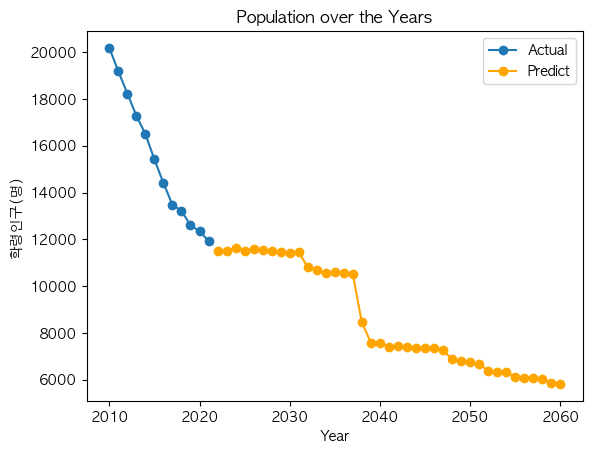

부산광역시 수영구


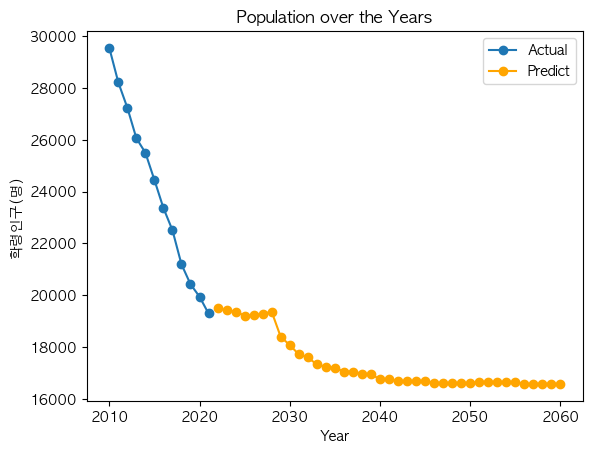

부산광역시 연제구


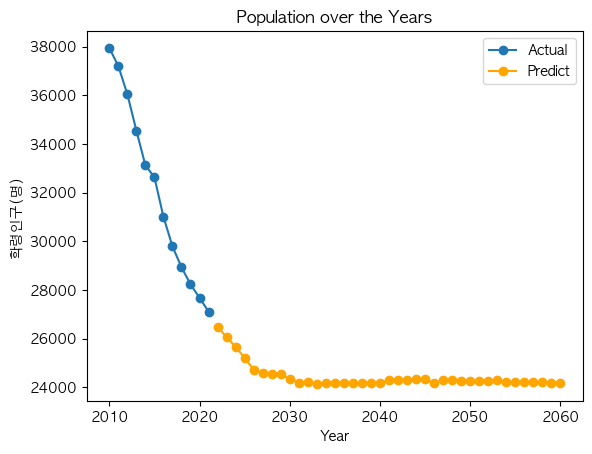

부산광역시 영도구


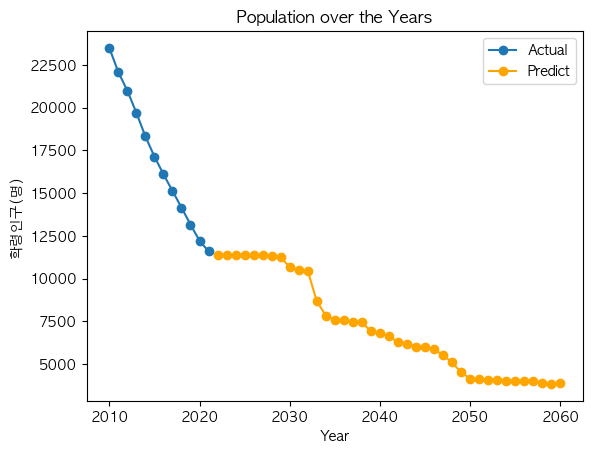

부산광역시 중구


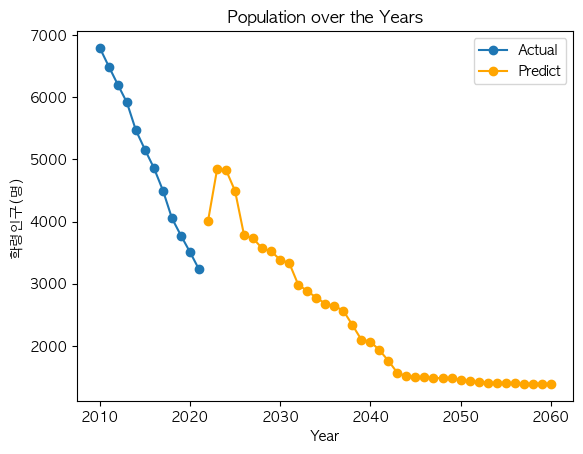

부산광역시 해운대구


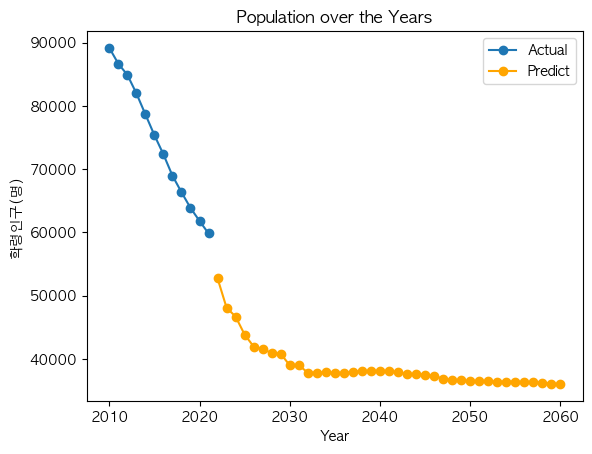

서울특별시 강남구


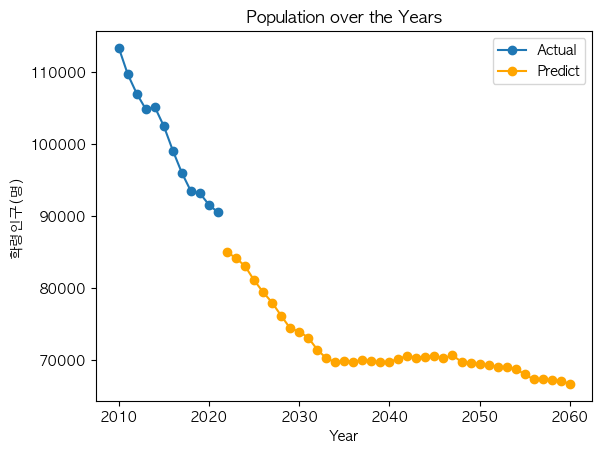

서울특별시 강동구


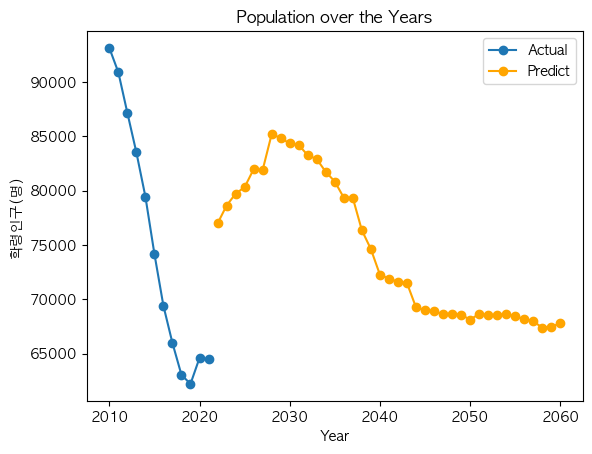

서울특별시 강북구


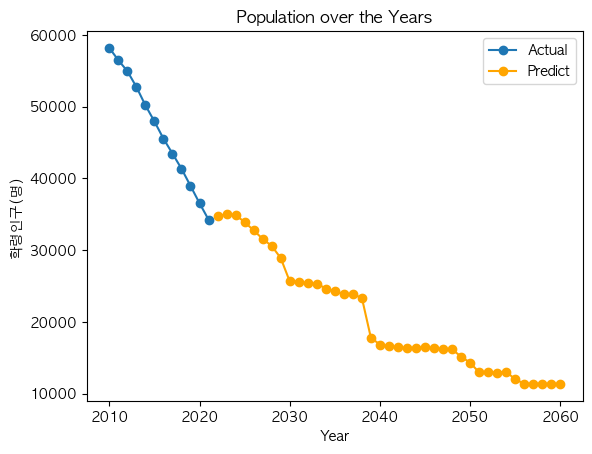

서울특별시 강서구


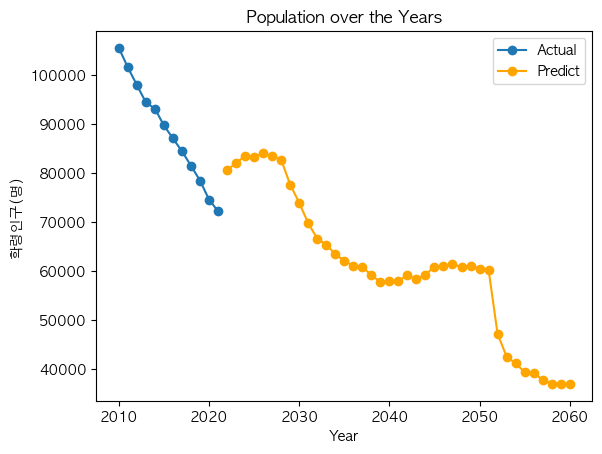

서울특별시 관악구


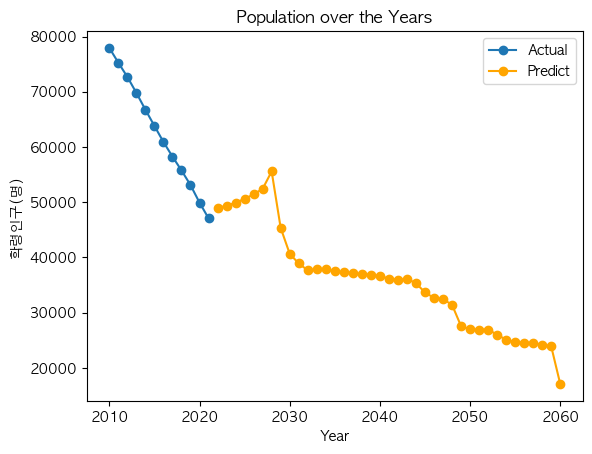

서울특별시 광진구


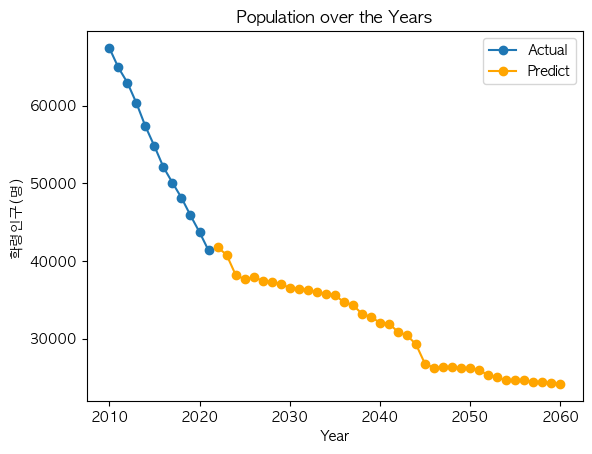

서울특별시 구로구


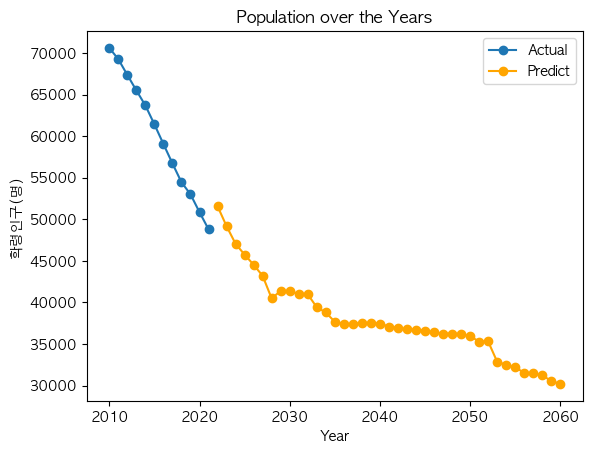

서울특별시 금천구


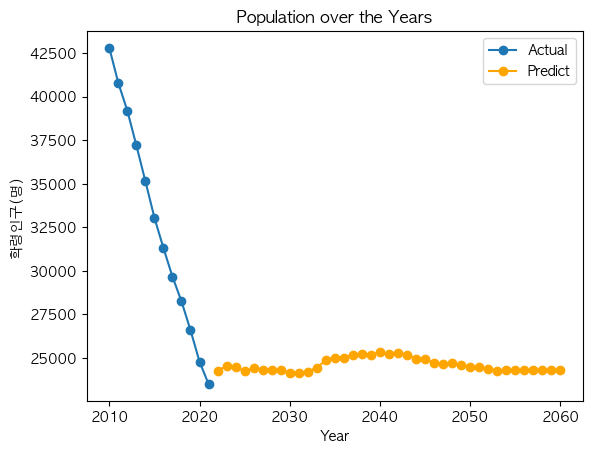

서울특별시 노원구


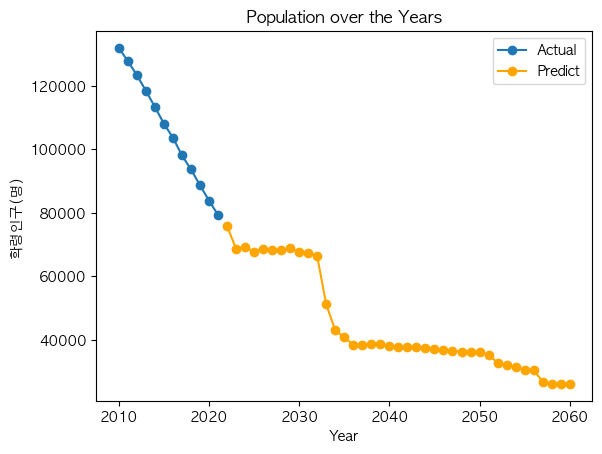

서울특별시 도봉구


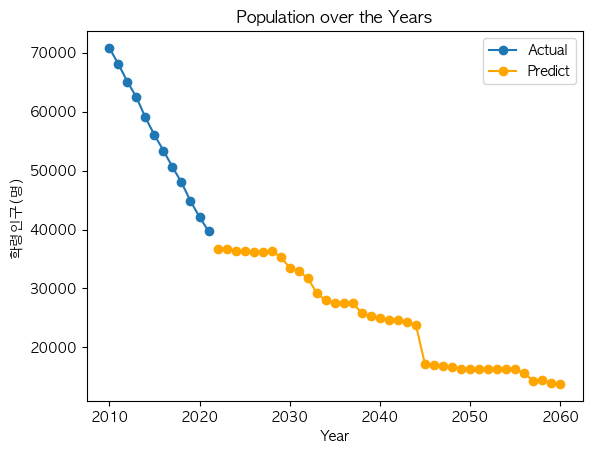

서울특별시 동대문구


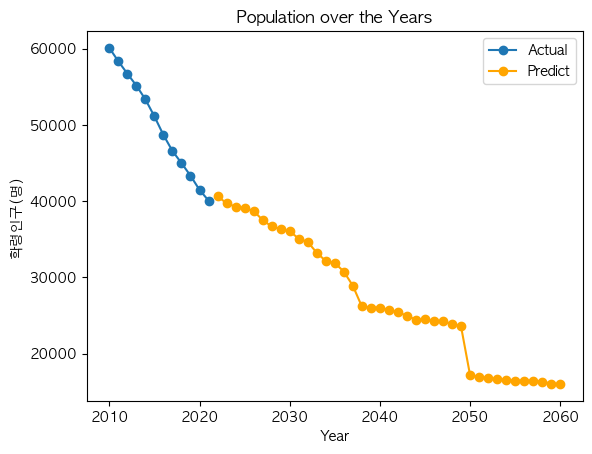

서울특별시 동작구


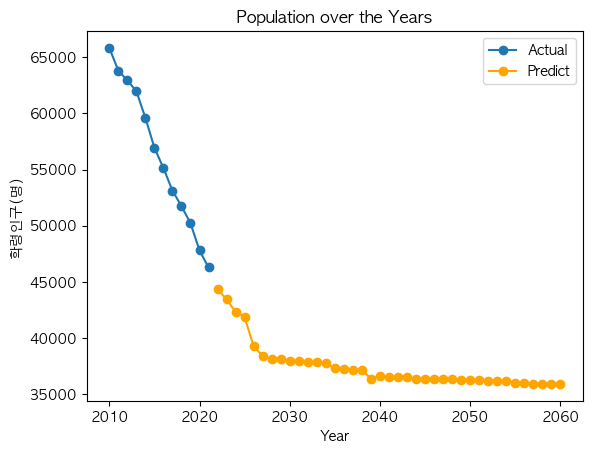

서울특별시 마포구


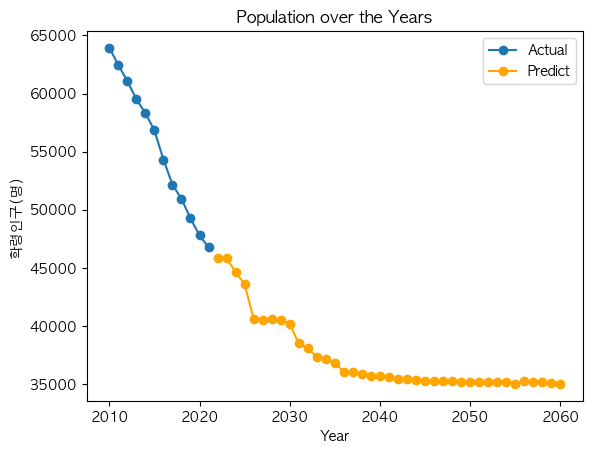

서울특별시 서대문구


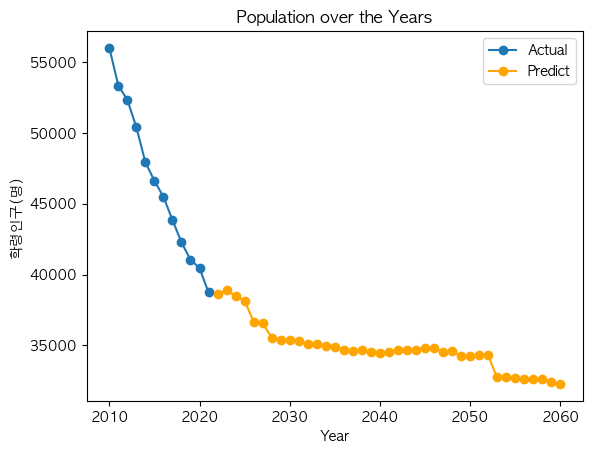

서울특별시 서초구


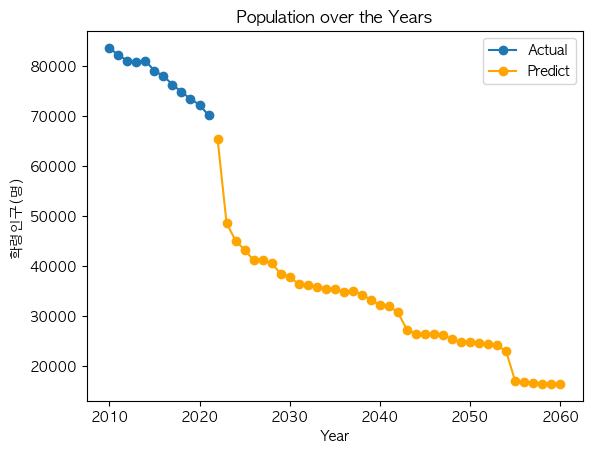

서울특별시 성동구


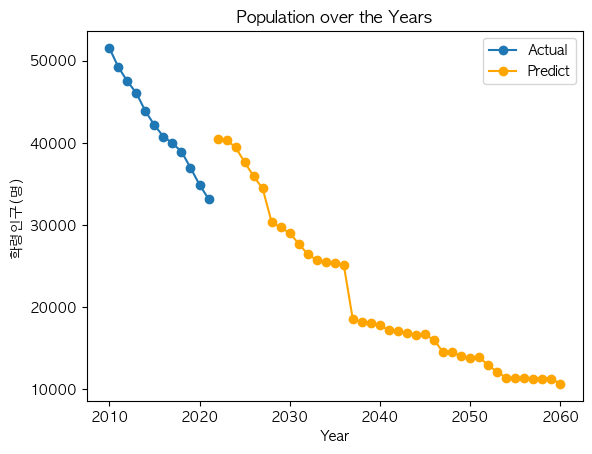

서울특별시 성북구


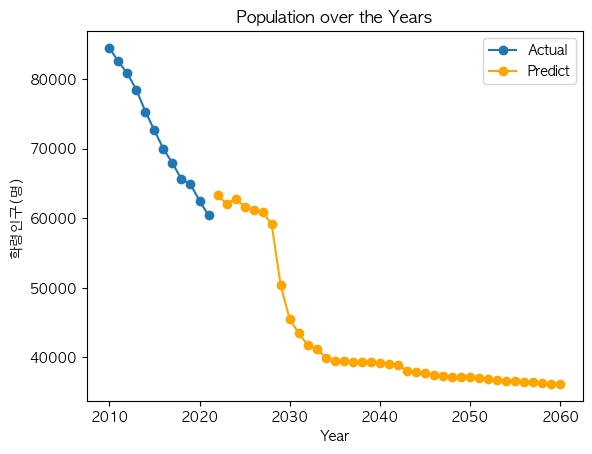

서울특별시 송파구


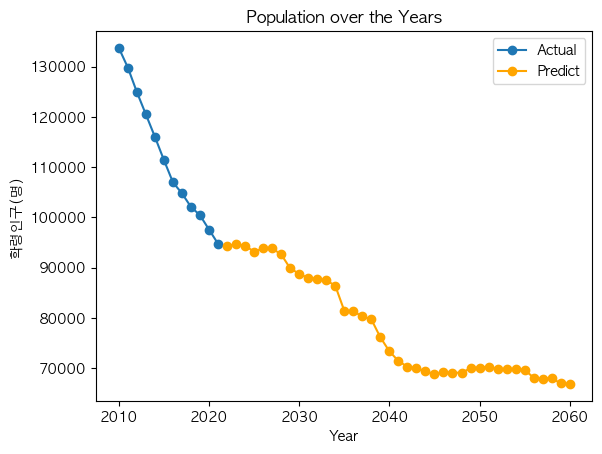

서울특별시 양천구


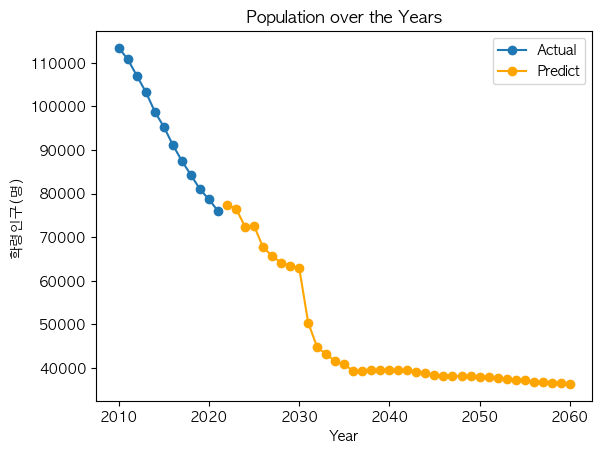

서울특별시 영등포구


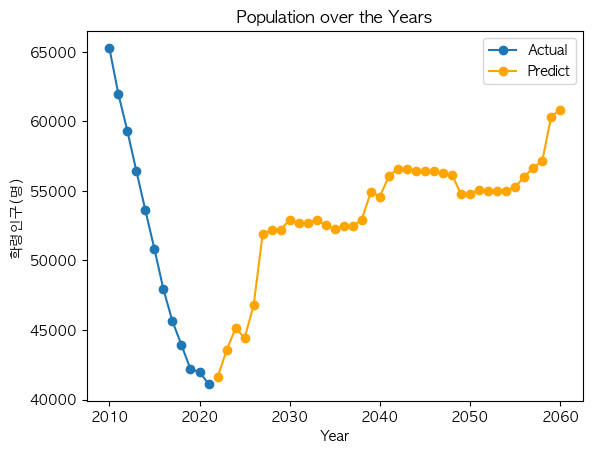

서울특별시 용산구


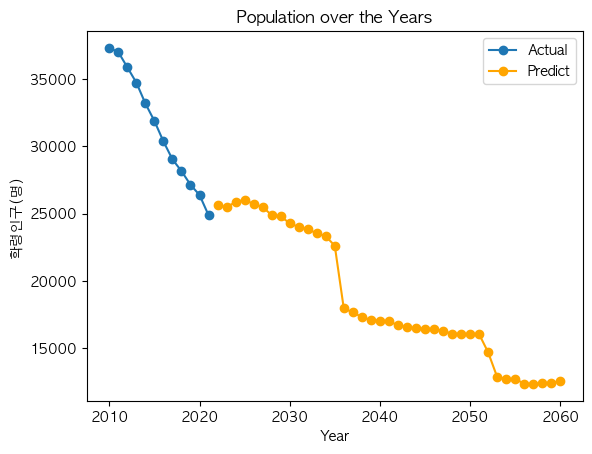

서울특별시 은평구


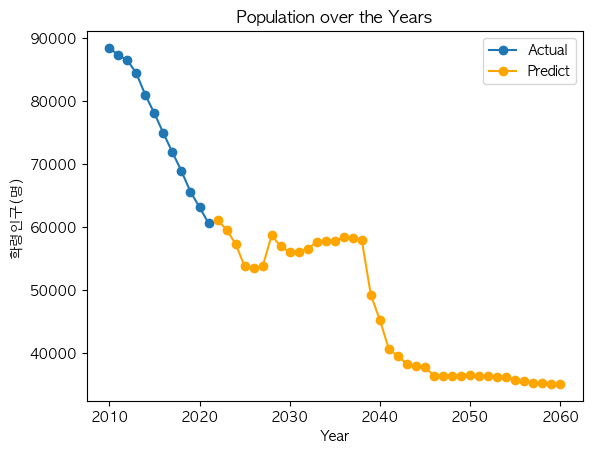

서울특별시 종로구


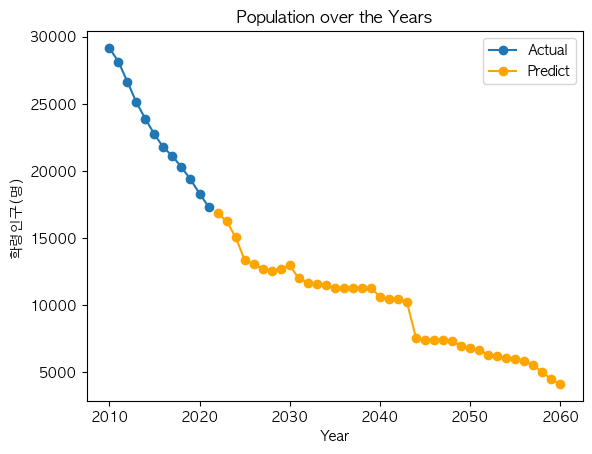

서울특별시 중구


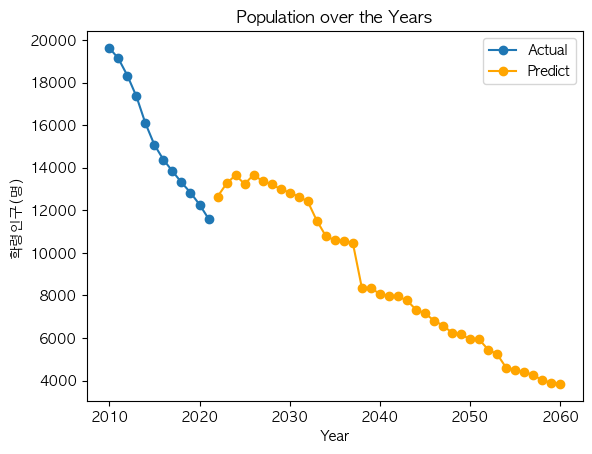

서울특별시 중랑구


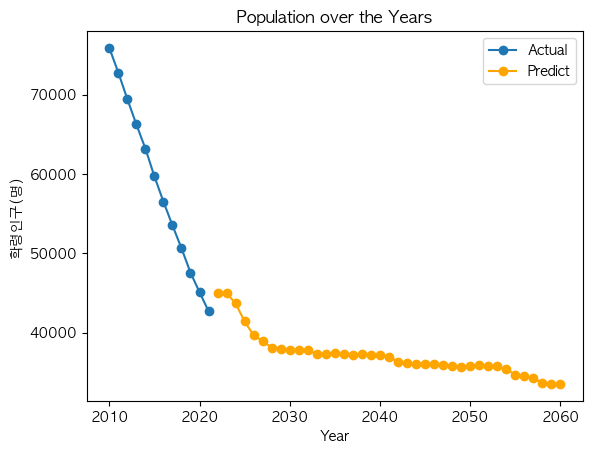

울산광역시 남구


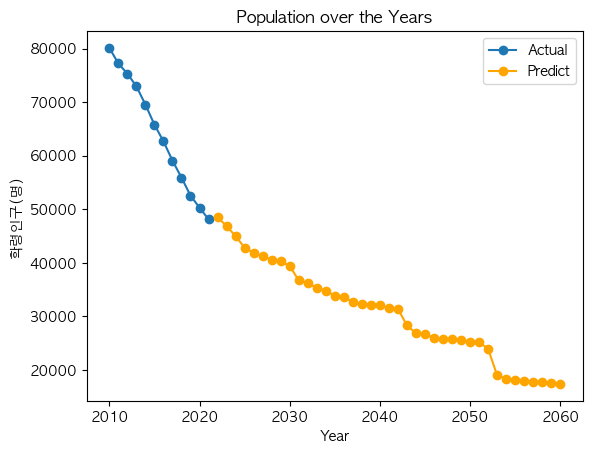

울산광역시 동구


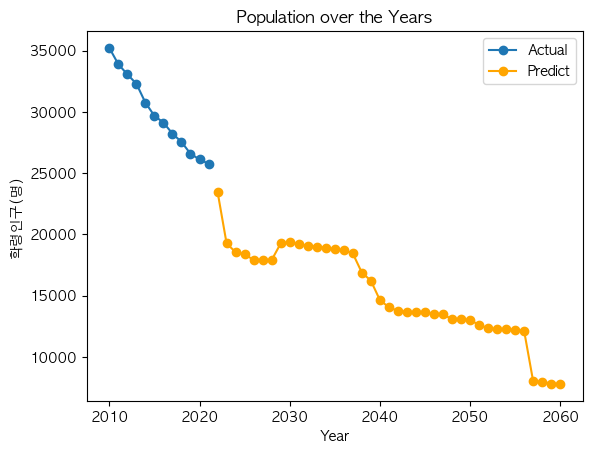

울산광역시 북구


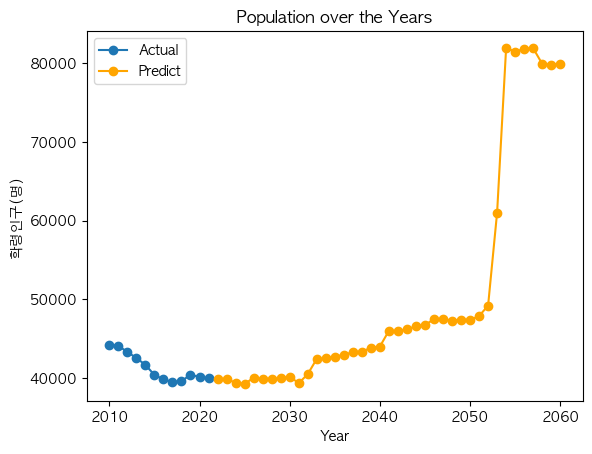

울산광역시 울주군


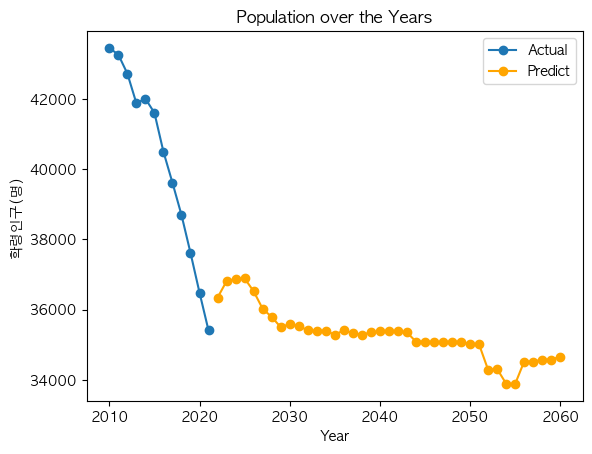

울산광역시 중구


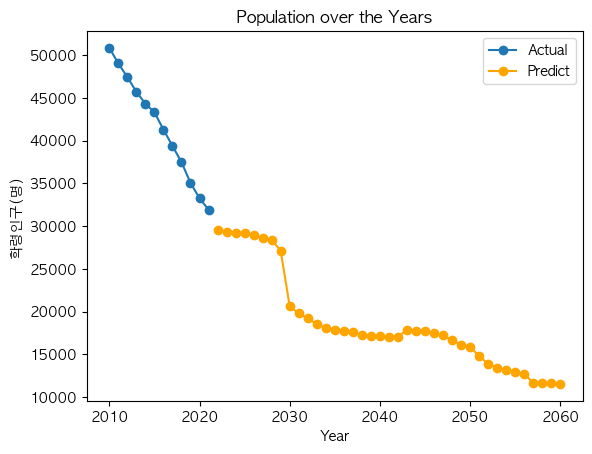

인천광역시 강화군


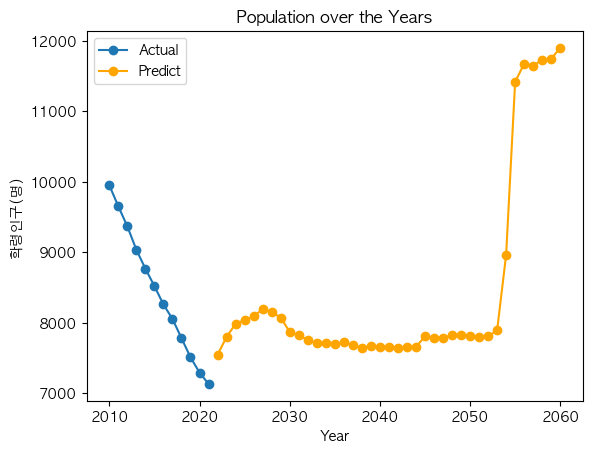

인천광역시 계양구


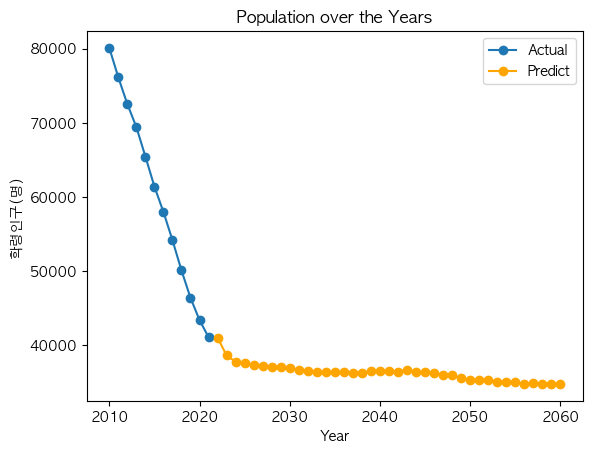

인천광역시 남동구


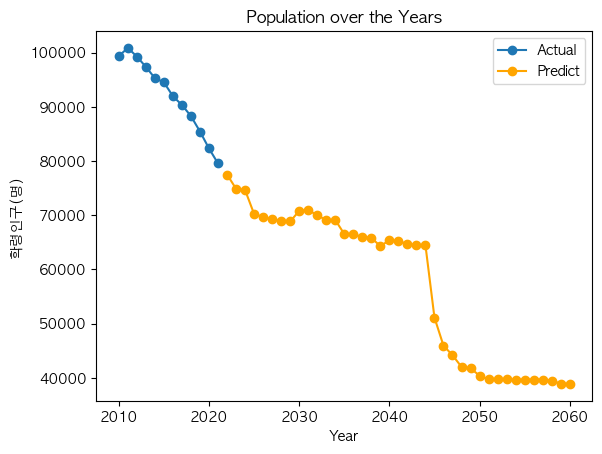

인천광역시 동구


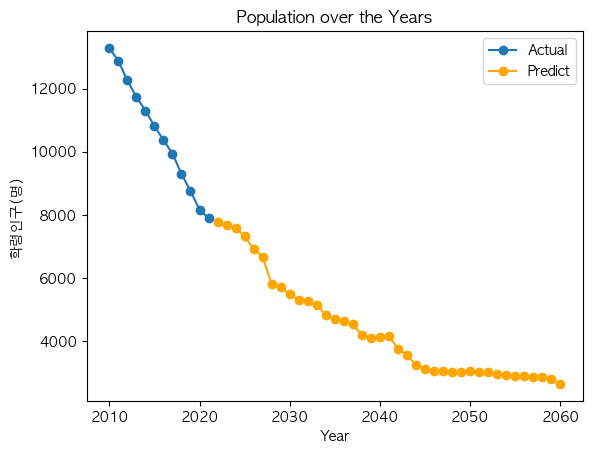

인천광역시 부평구


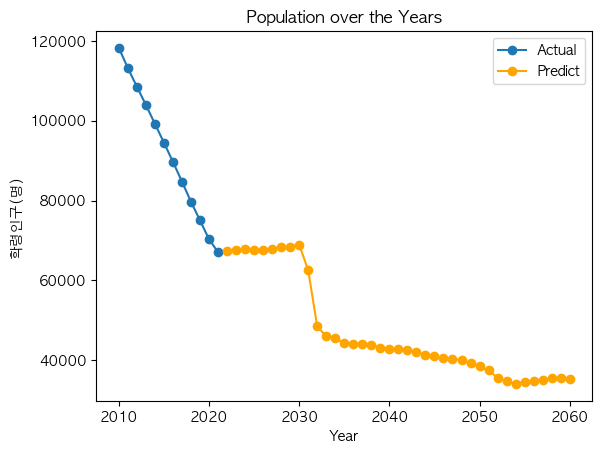

인천광역시 서구


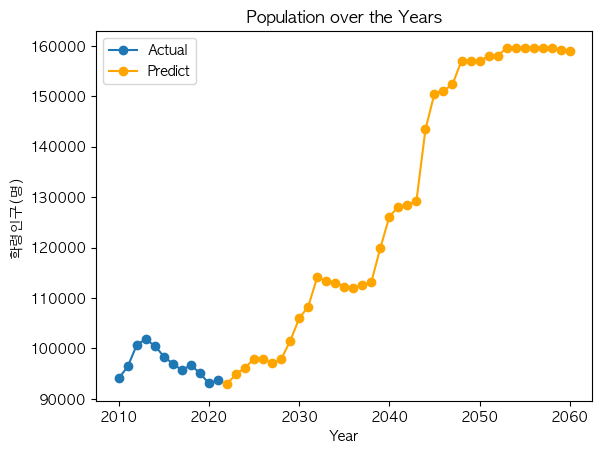

인천광역시 연수구


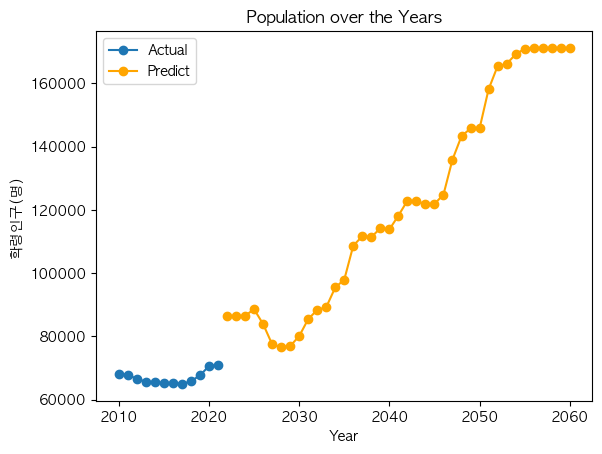

인천광역시 옹진군


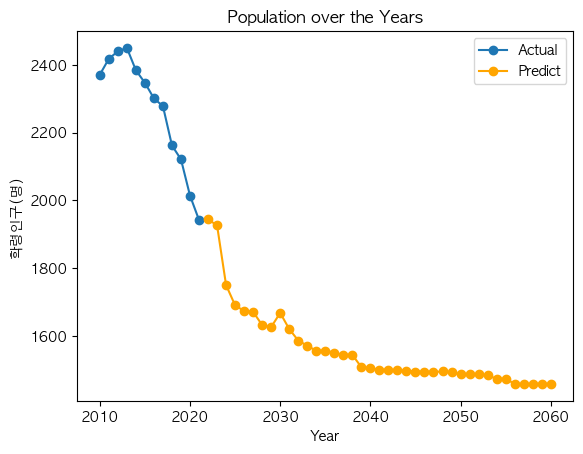

인천광역시 중구


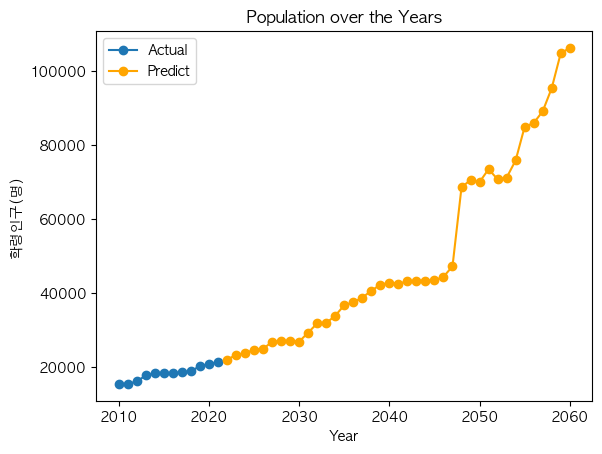

전라남도 강진군


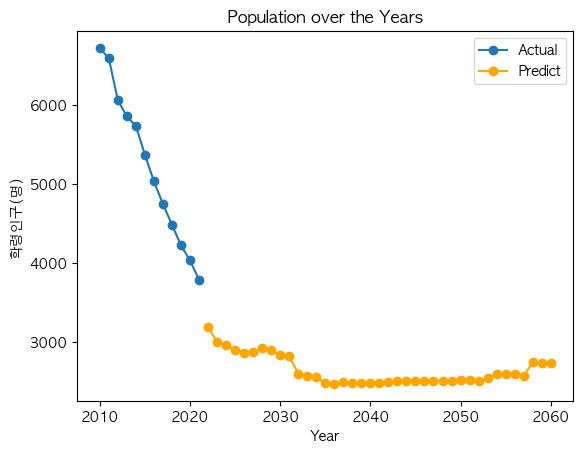

전라남도 고흥군


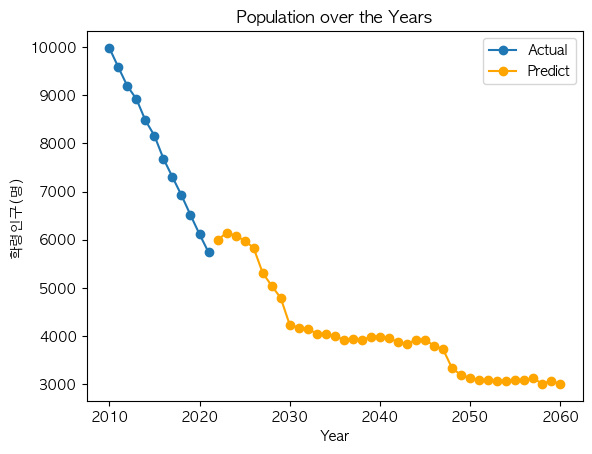

전라남도 곡성군


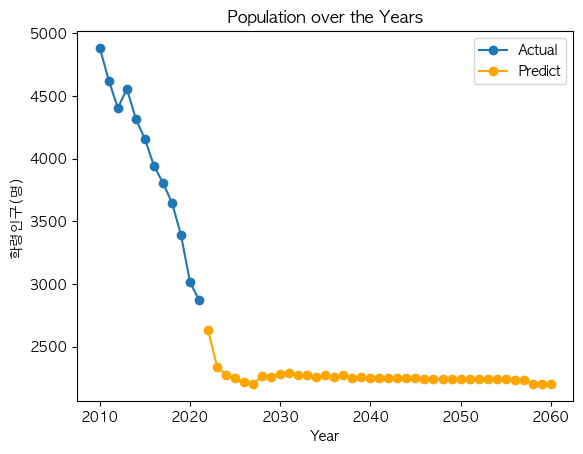

전라남도 광양시


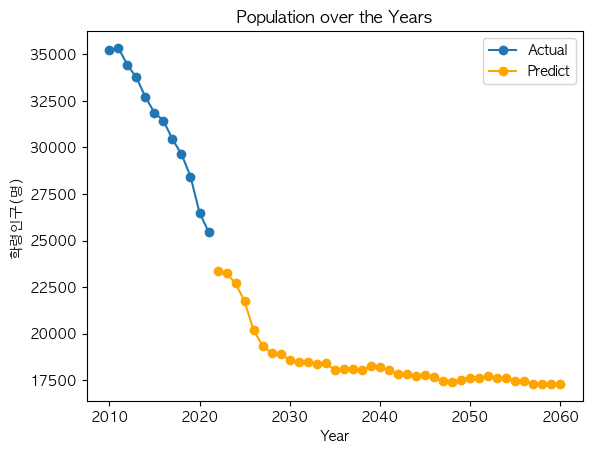

전라남도 구례군


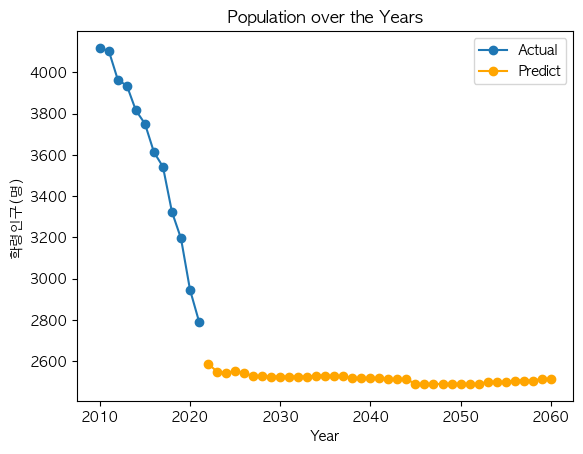

전라남도 나주시


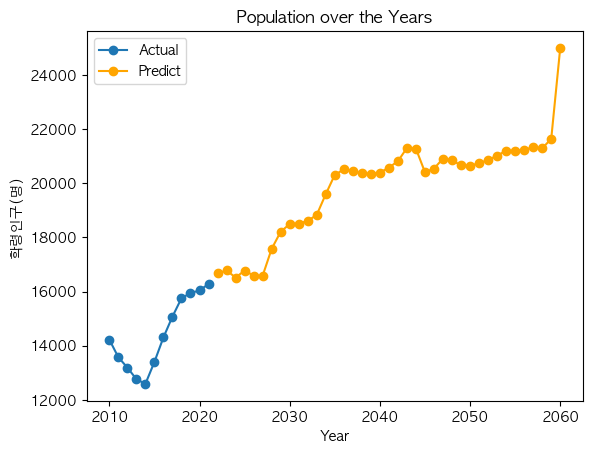

전라남도 담양군


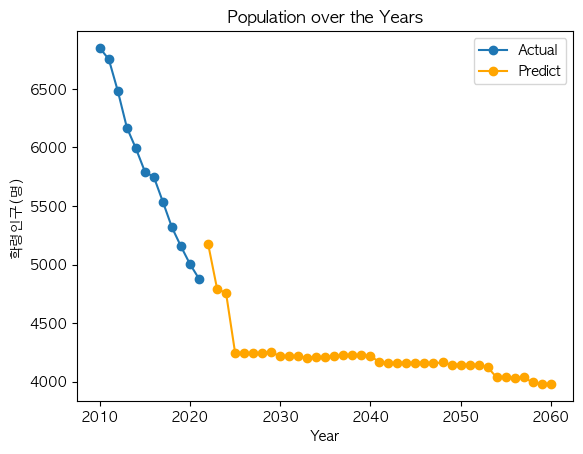

전라남도 목포시


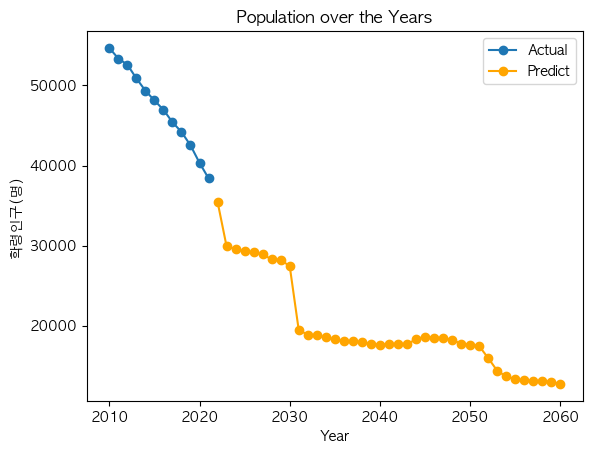

전라남도 무안군


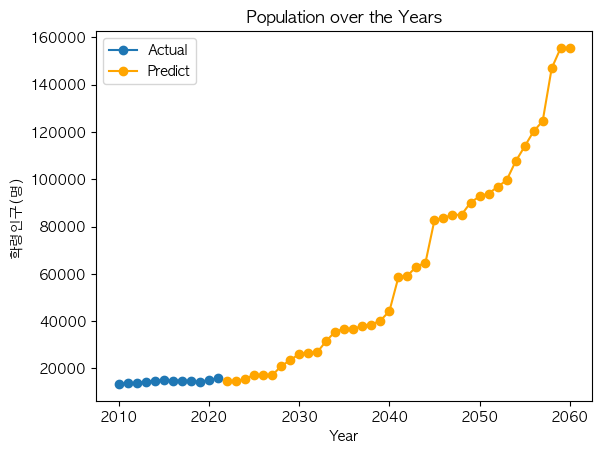

전라남도 보성군


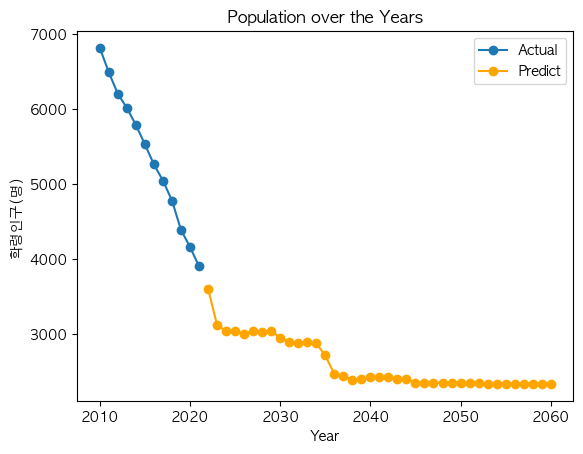

전라남도 순천시


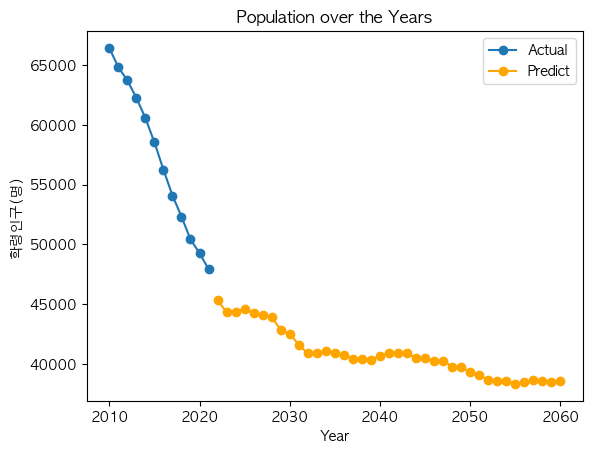

전라남도 신안군


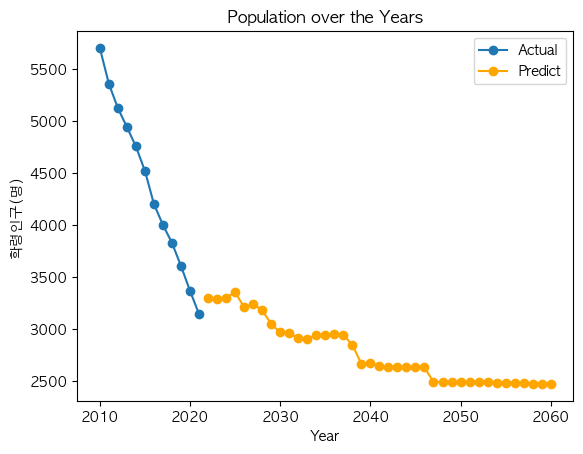

전라남도 여수시


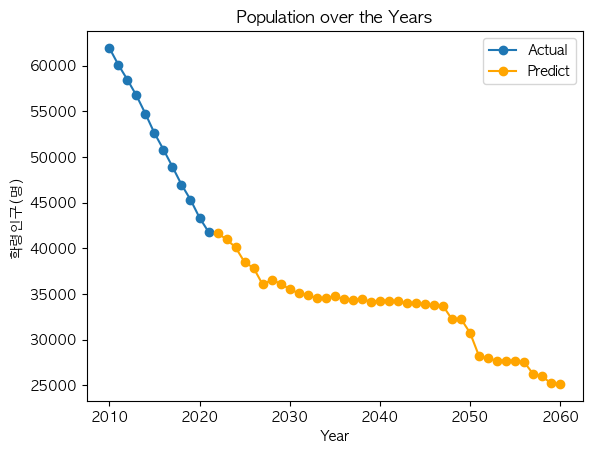

전라남도 영광군


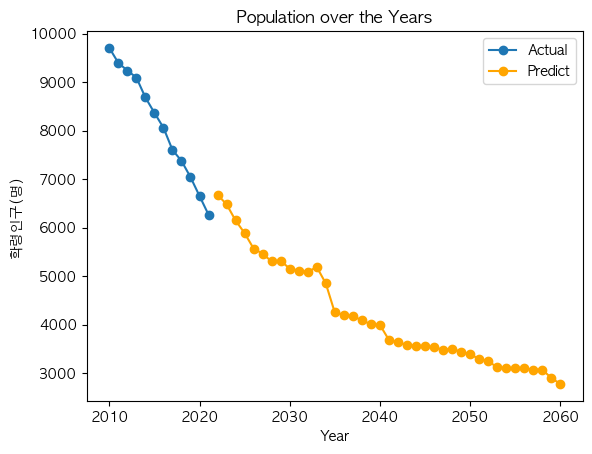

전라남도 영암군


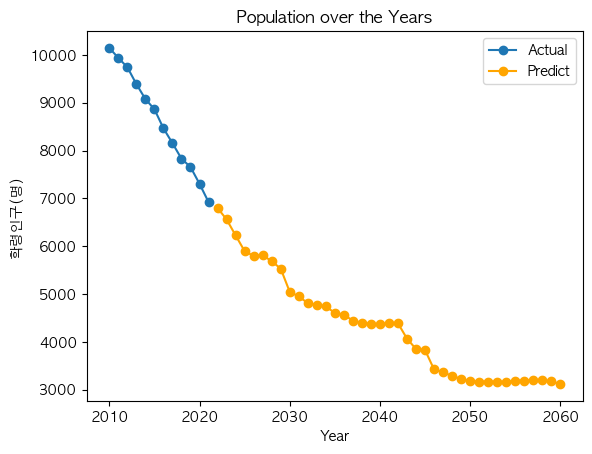

전라남도 완도군


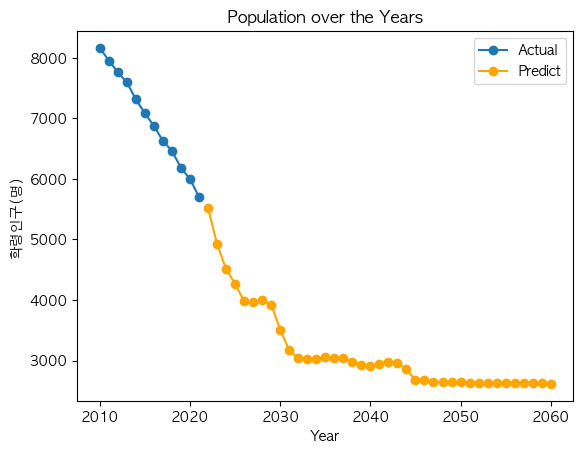

전라남도 장성군


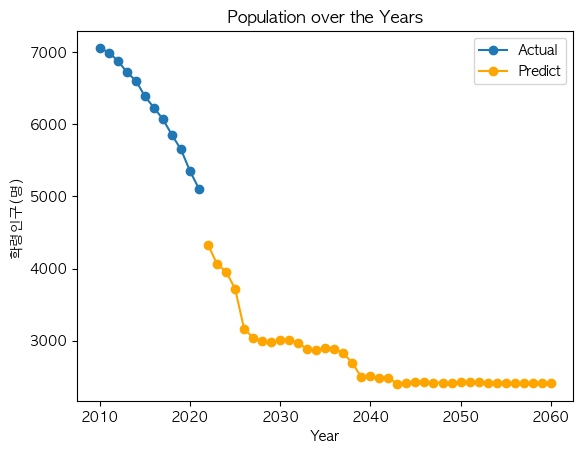

전라남도 장흥군


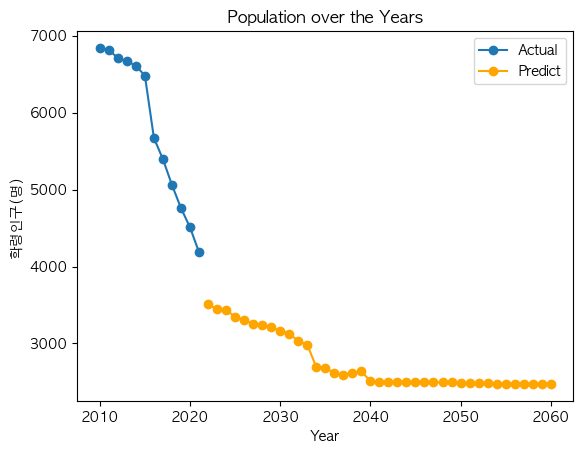

전라남도 진도군


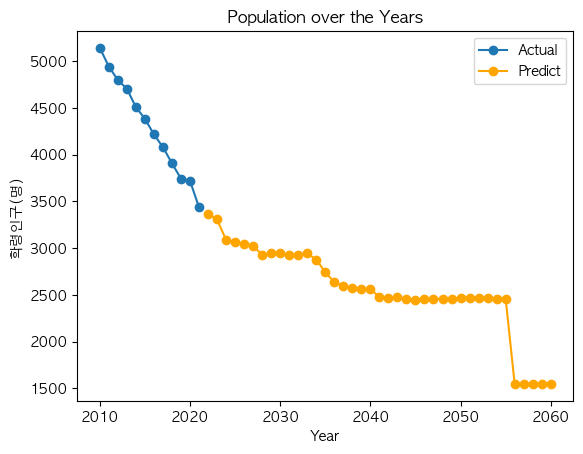

전라남도 함평군


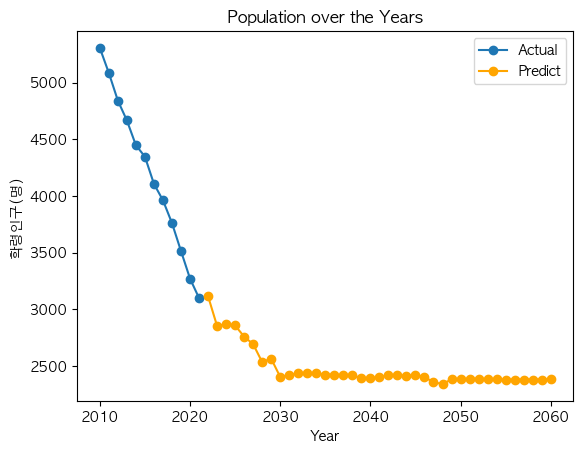

전라남도 해남군


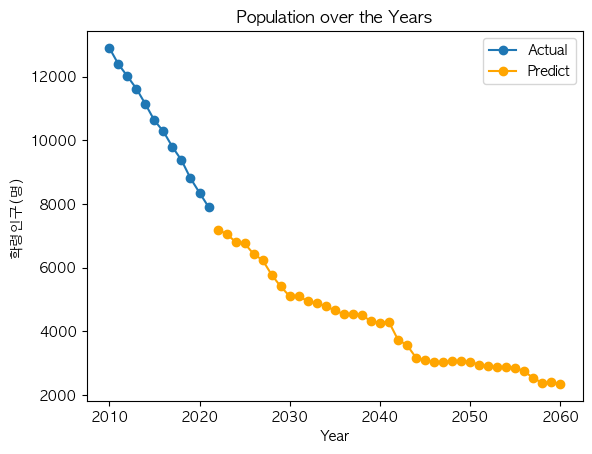

전라남도 화순군


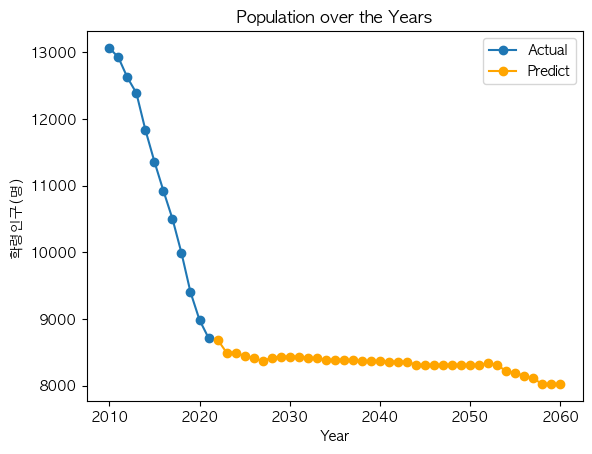

전라북도 고창군


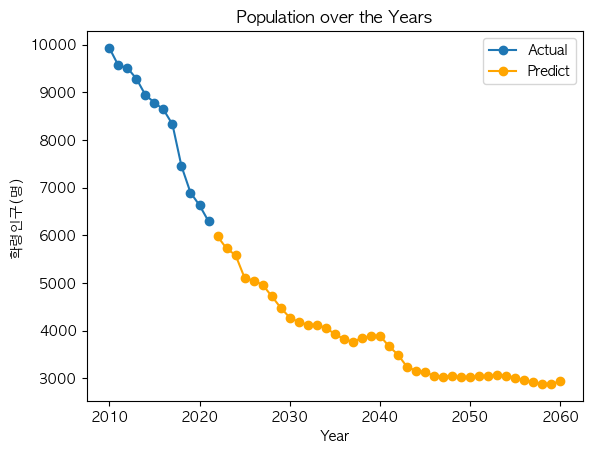

전라북도 군산시


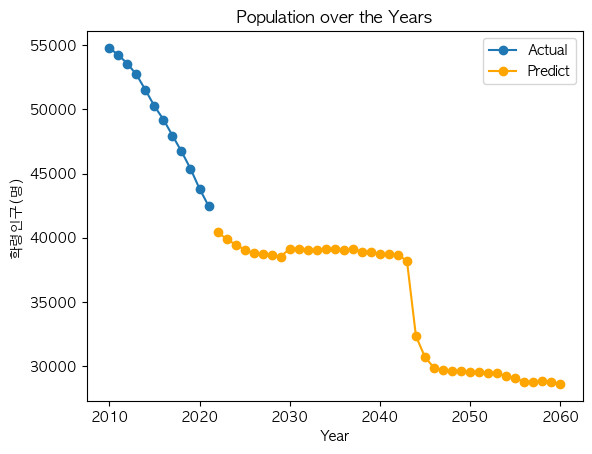

전라북도 김제시


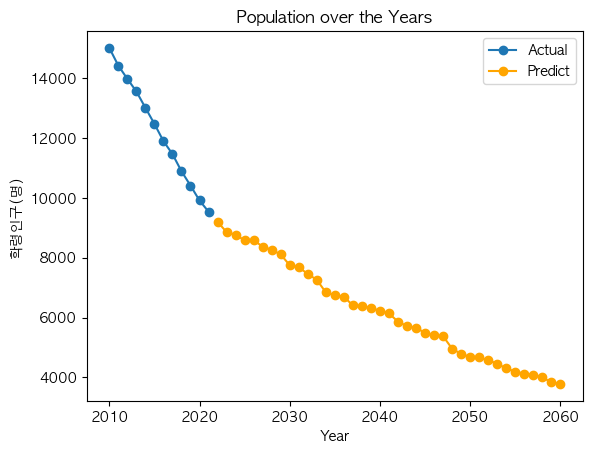

전라북도 남원시


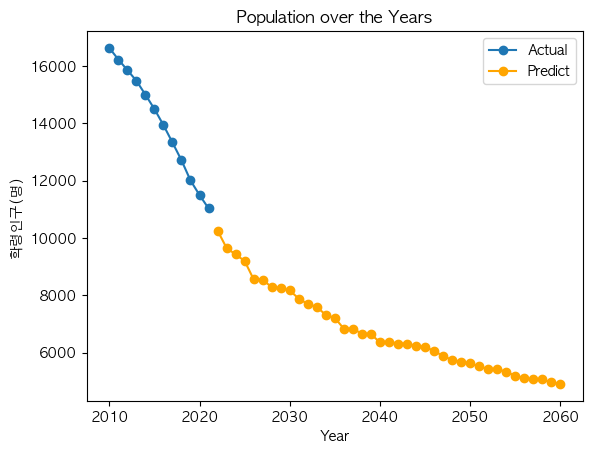

전라북도 무주군


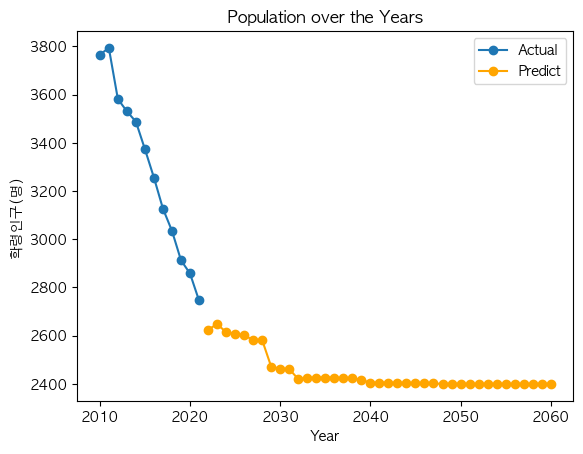

전라북도 부안군


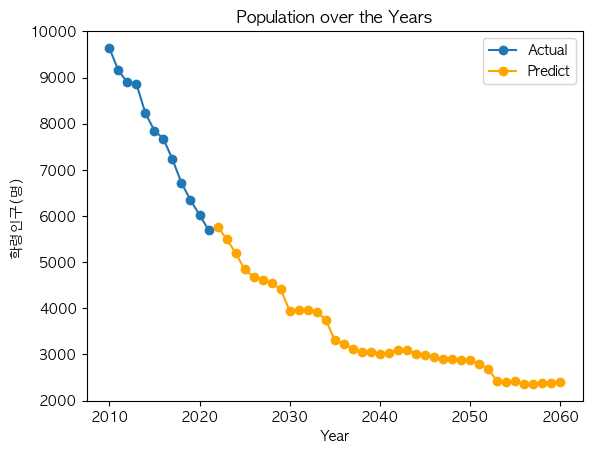

전라북도 순창군


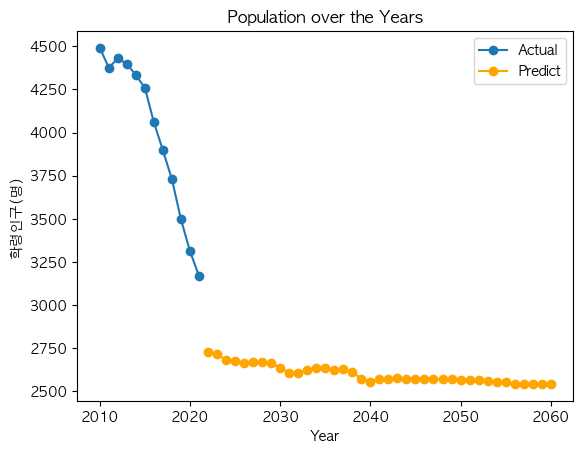

전라북도 완주군


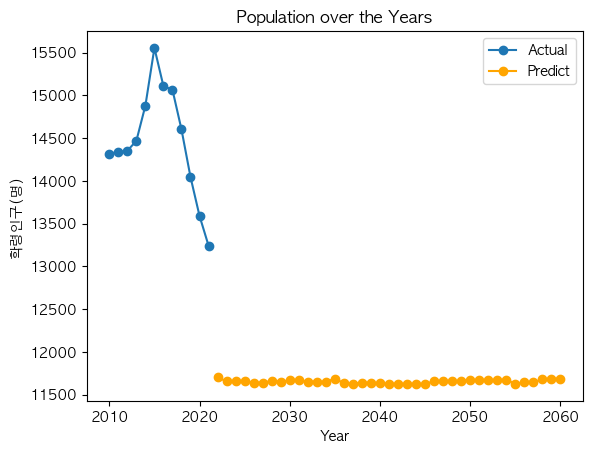

전라북도 익산시


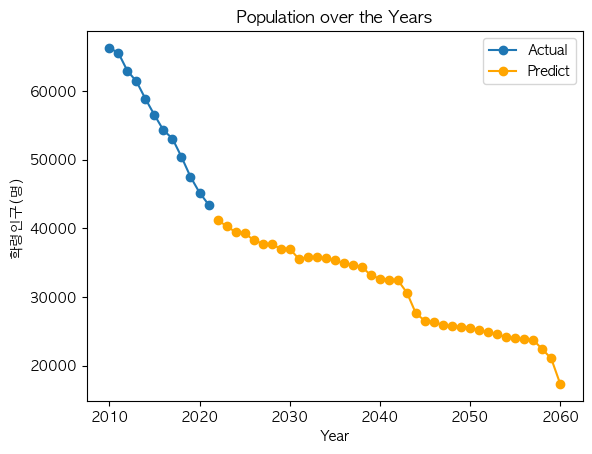

전라북도 임실군


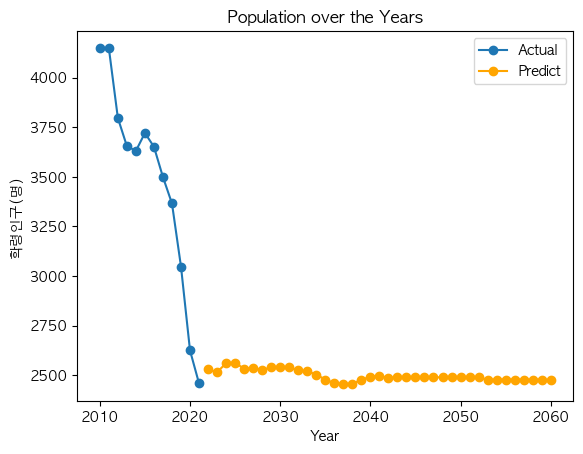

전라북도 장수군


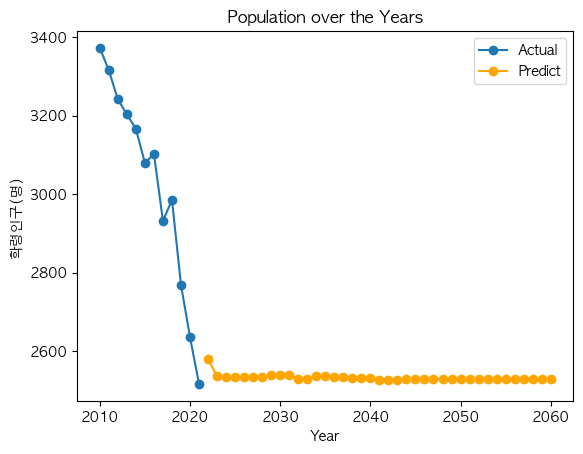

전라북도 전주시


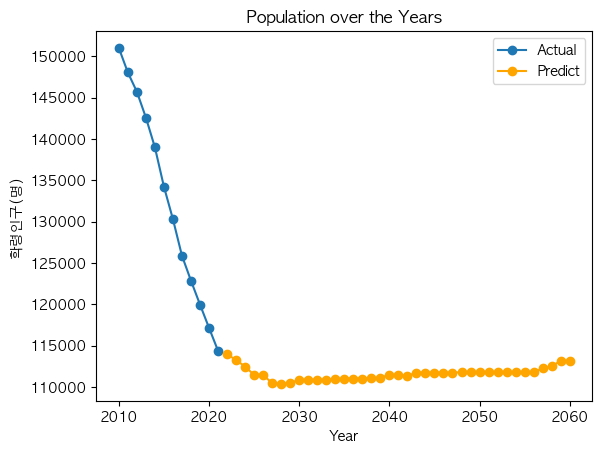

전라북도 정읍시


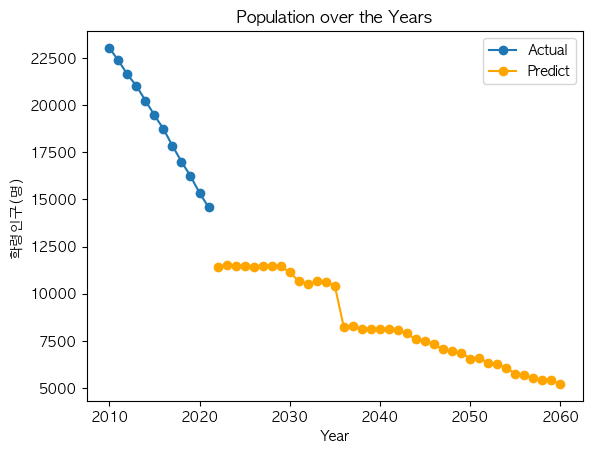

전라북도 진안군


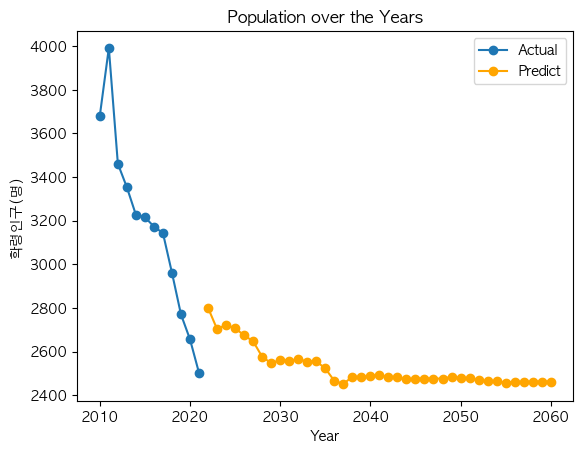

제주특별자치도 서귀포시


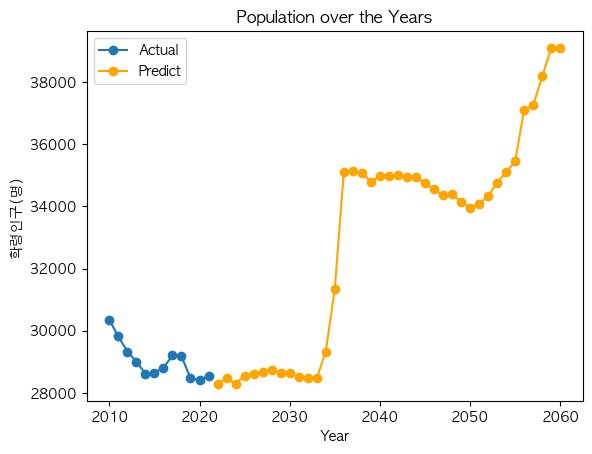

제주특별자치도 제주시


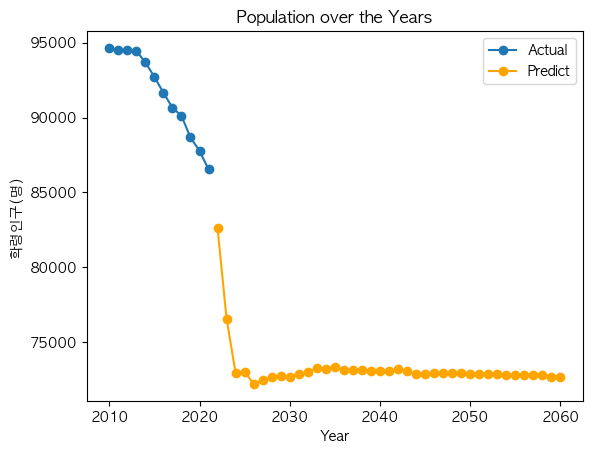

충청남도 계룡시


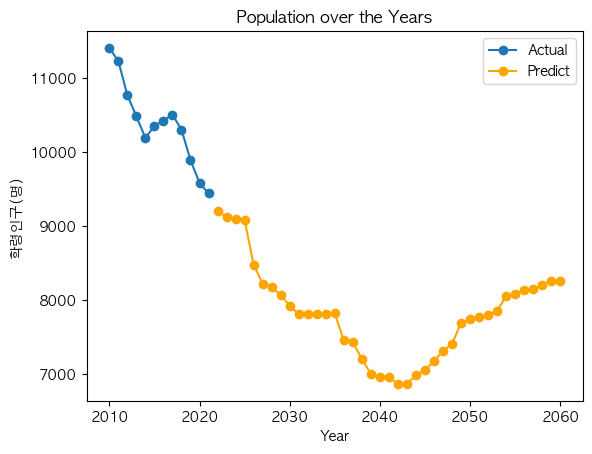

충청남도 공주시


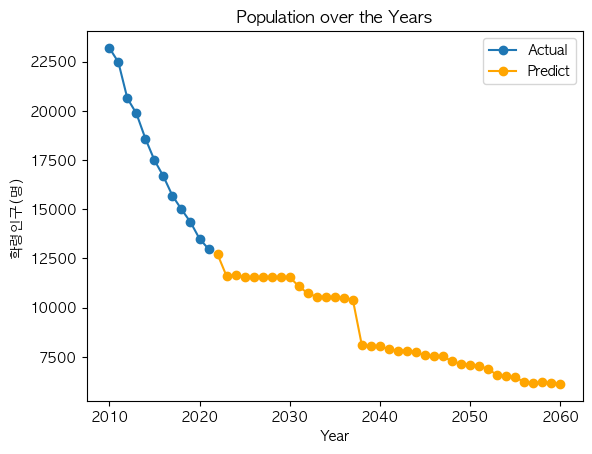

충청남도 금산군


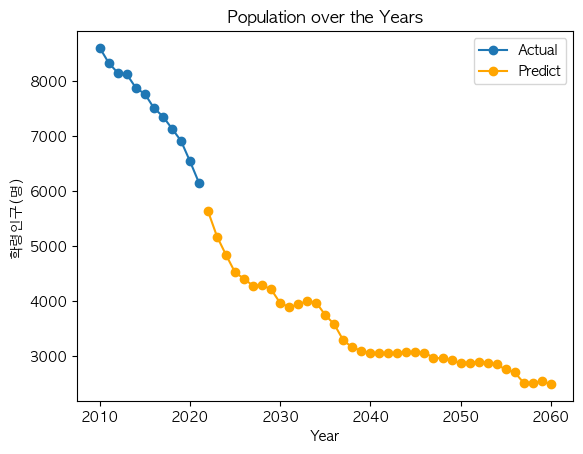

충청남도 논산시


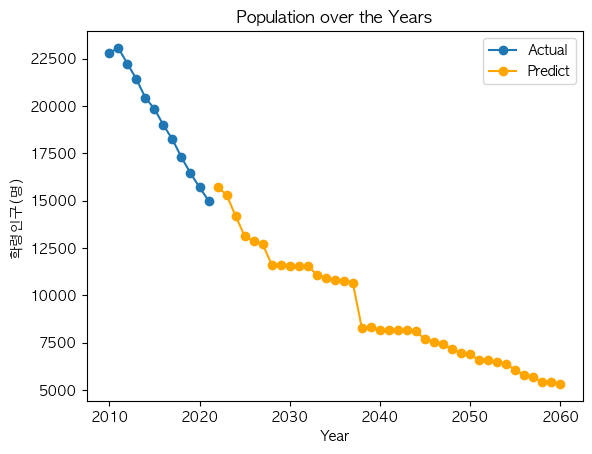

충청남도 보령시


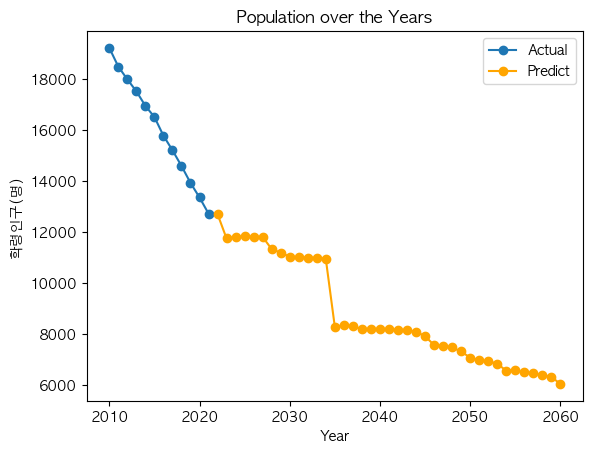

충청남도 부여군


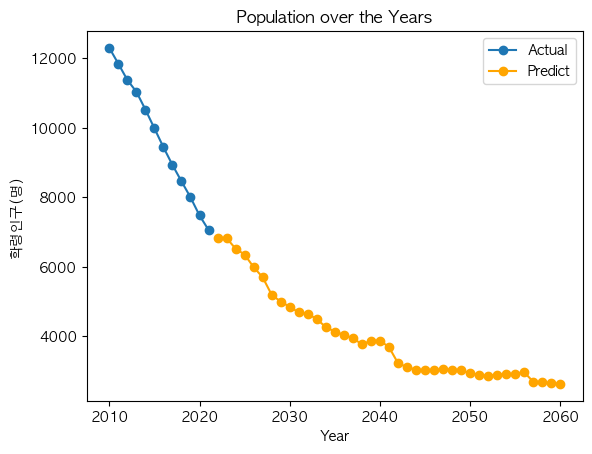

충청남도 서산시


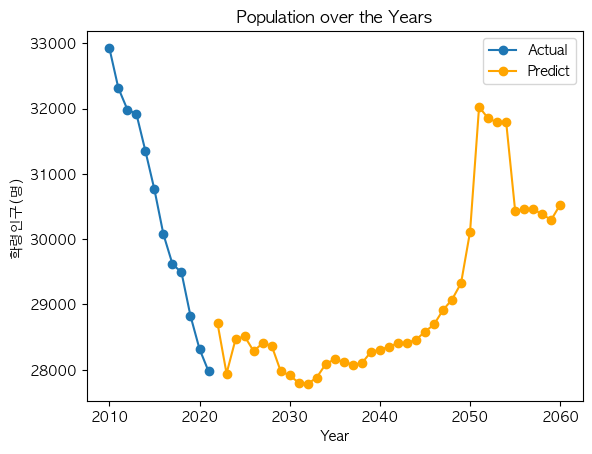

충청남도 서천군


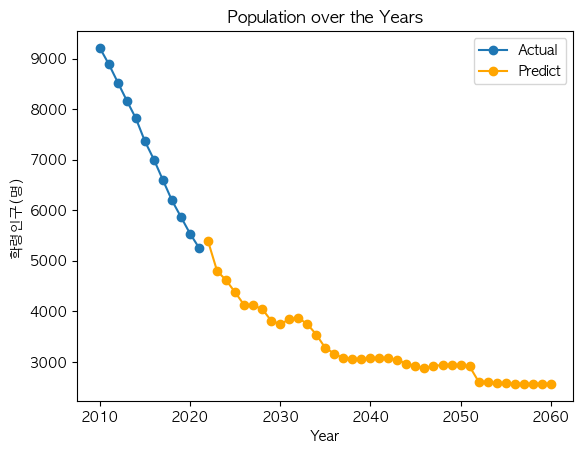

충청남도 아산시


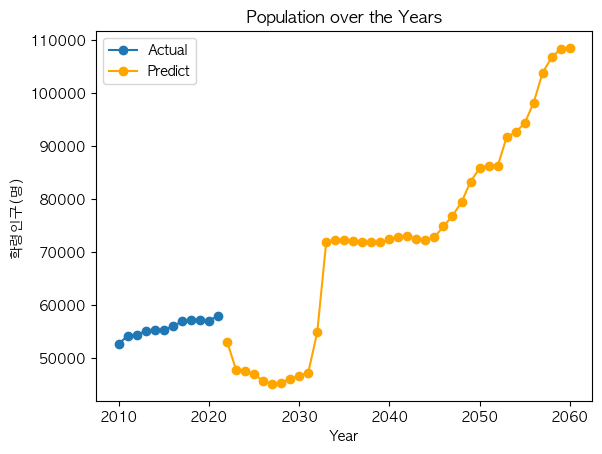

충청남도 예산군


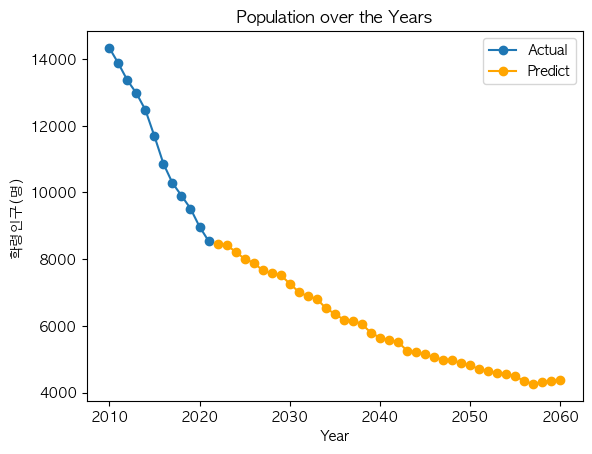

충청남도 천안시


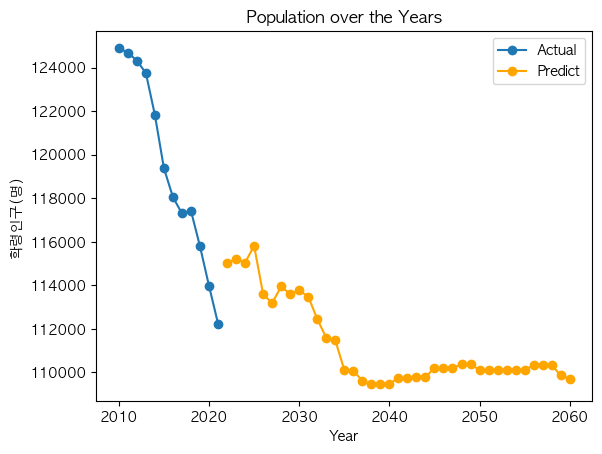

충청남도 청양군


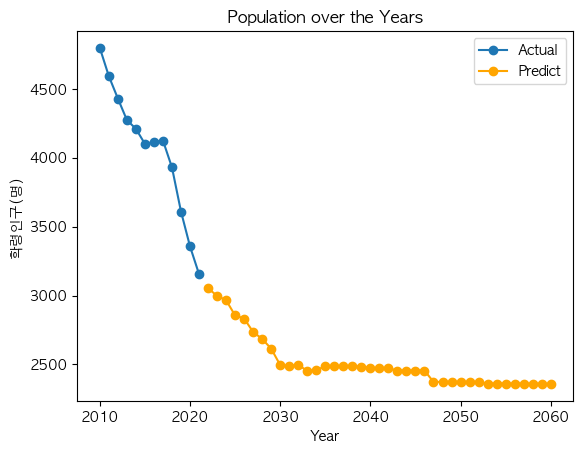

충청남도 태안군


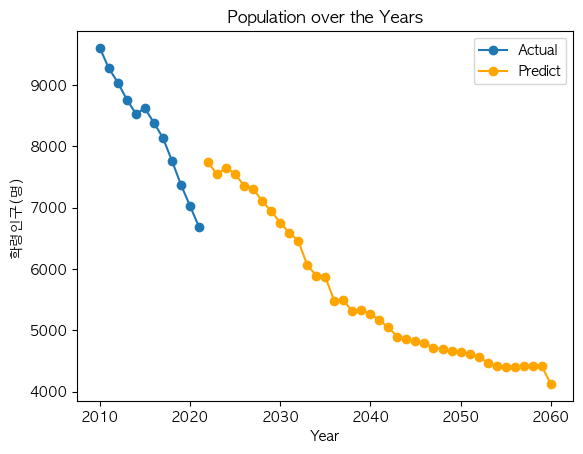

충청남도 홍성군


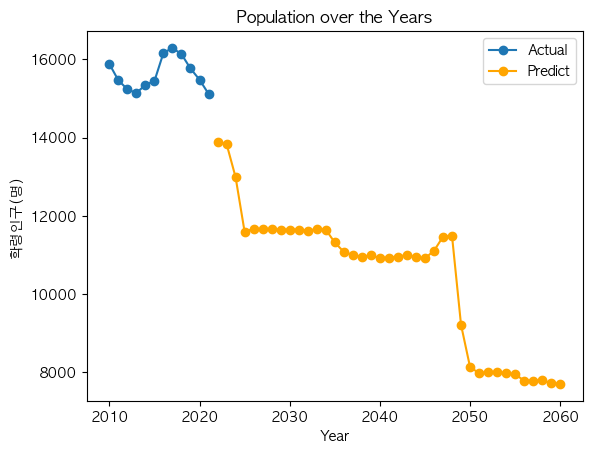

충청북도 괴산군


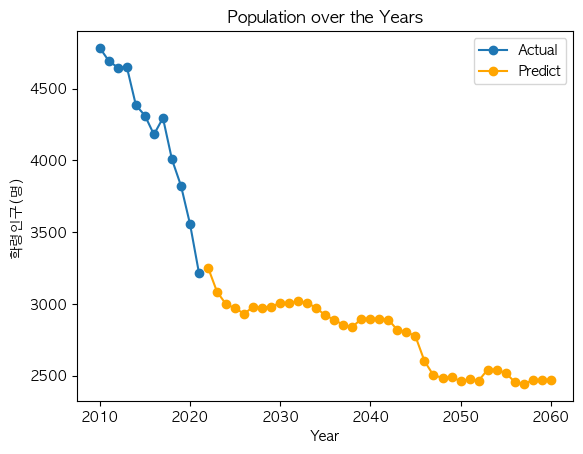

충청북도 단양군


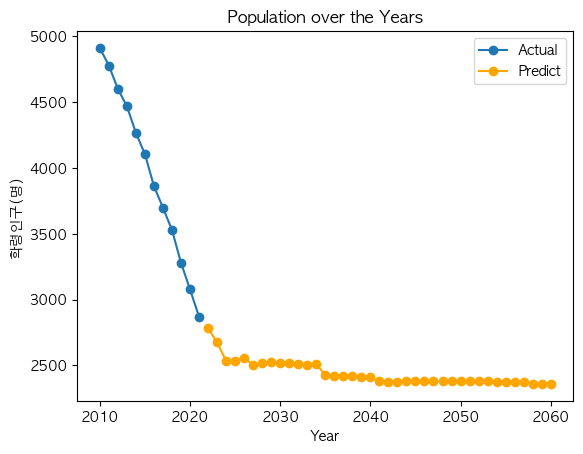

충청북도 보은군


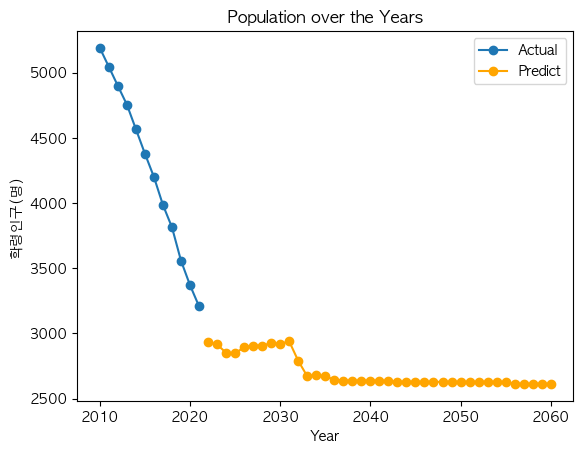

충청북도 영동군


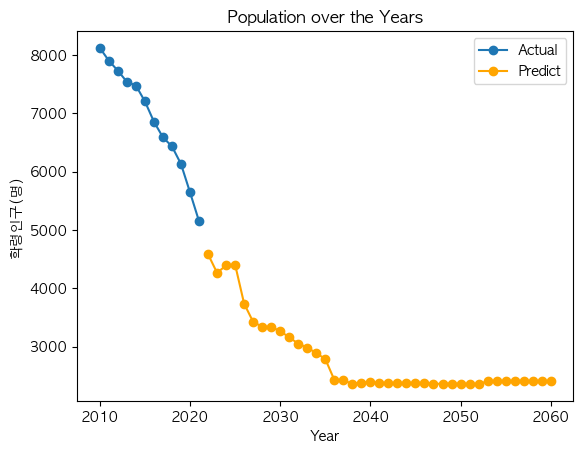

충청북도 옥천군


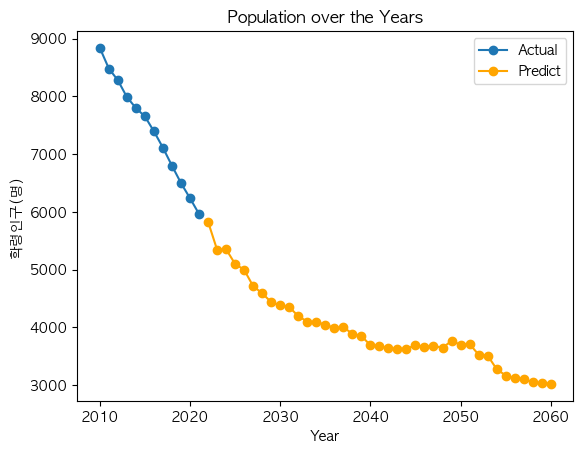

충청북도 음성군


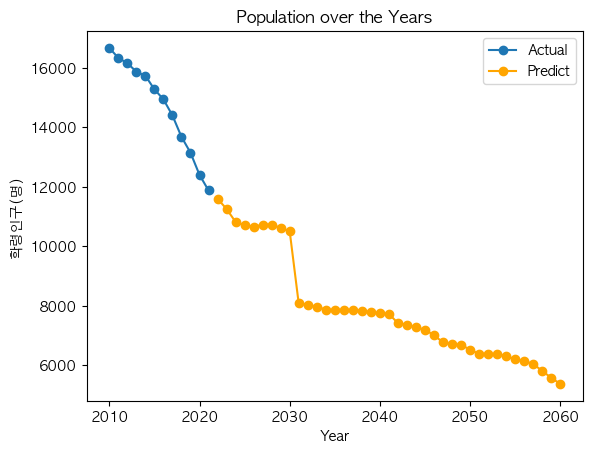

충청북도 제천시


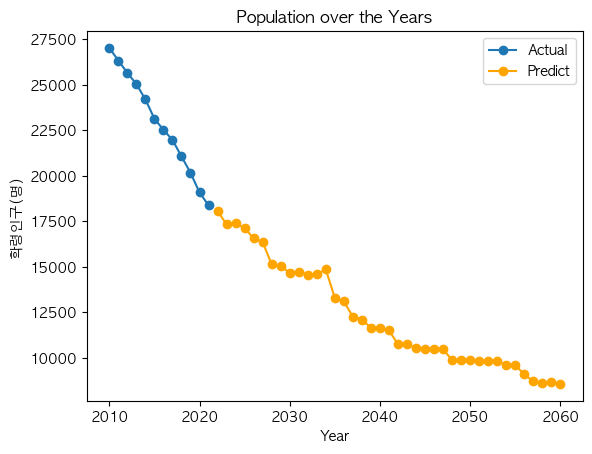

충청북도 증평군


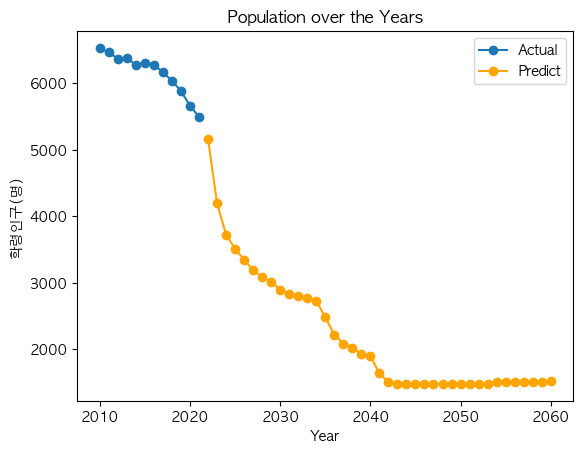

충청북도 진천군


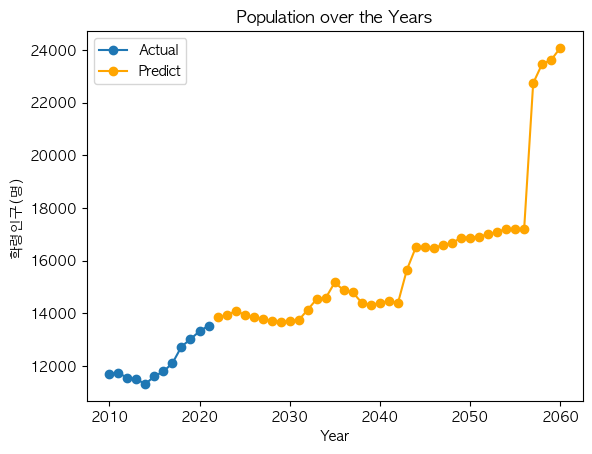

충청북도 청주시


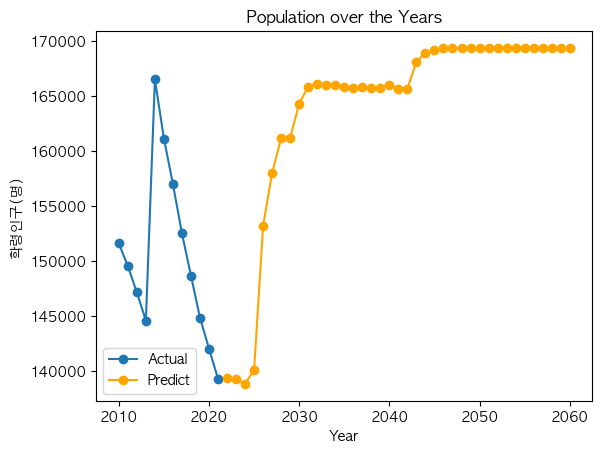

충청북도 충주시


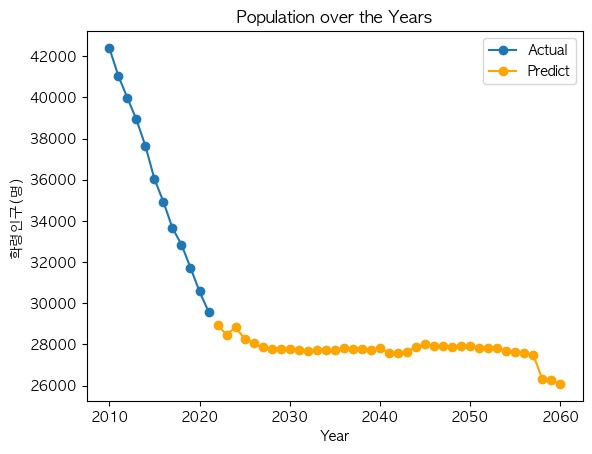

In [57]:
def visualization_graph(df):
# Assuming your DataFrame is named 'df'
    df_2023_onwards = df[df['연도'] > 2021]

    #plt.figure(figsize=(10, 6))
    #print(df)
    # Plotting data before 2023
    plt.plot(df['연도'][:df_2023_onwards.index[0]], df['학령인구(명)'][:df_2023_onwards.index[0]], label='Actual', marker='o')
    
    # Plotting data from 2023 onwards with a different color
    plt.plot(df_2023_onwards['연도'], df_2023_onwards['학령인구(명)'], label='Predict', marker='o', color='orange')

    # Adding labels and title
    plt.xticks(range(2010, 2062,10))
    plt.xlabel('Year')
    plt.ylabel('학령인구(명)')
    plt.title('Population over the Years')
    plt.legend()

    # Show the plot
    plt.show()
    
for i in range(len(cluster)):
    print(str(cluster[i]['행정구역'].unique()[0]))
  
    visualization_graph(cluster[i])

# 도별로 예측 학령인구 visualization

In [58]:

result_merge_df  = pd.concat(cluster, axis=0, ignore_index=True)
#merge_df1 = pd.concat(cluster1, axis=0, ignore_index=True)
#result_merge_df =  pd.concat(merge_df0, axis=0, ignore_index=True)

result_merge_df[['시도', '시군구']] = result_merge_df['행정구역'].str.split(n=1, expand=True)

result_merge_df = result_merge_df[['시도','시군구','연도','학령인구(명)']]
result_merge_df['학령인구(명)'] = result_merge_df['학령인구(명)'].round()
result_merge_df['연도'] = result_merge_df['연도'].round()

result_merge_df = result_merge_df.sort_values(by=['시도', '시군구'])


result_merge_df

,시도,시군구,연도,학령인구(명)
0,강원특별자치도,강릉시,2010.0,43102.0
1,강원특별자치도,강릉시,2011.0,41960.0
2,강원특별자치도,강릉시,2012.0,41589.0
3,강원특별자치도,강릉시,2013.0,40758.0
4,강원특별자치도,강릉시,2014.0,39345.0
...,...,...,...,...
11368,충청북도,충주시,2056.0,27592.0
11369,충청북도,충주시,2057.0,27506.0
11370,충청북도,충주시,2058.0,26320.0
11371,충청북도,충주시,2059.0,26257.0


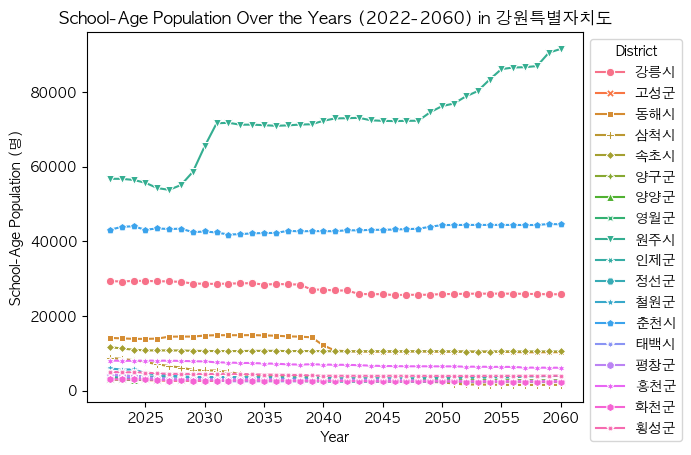

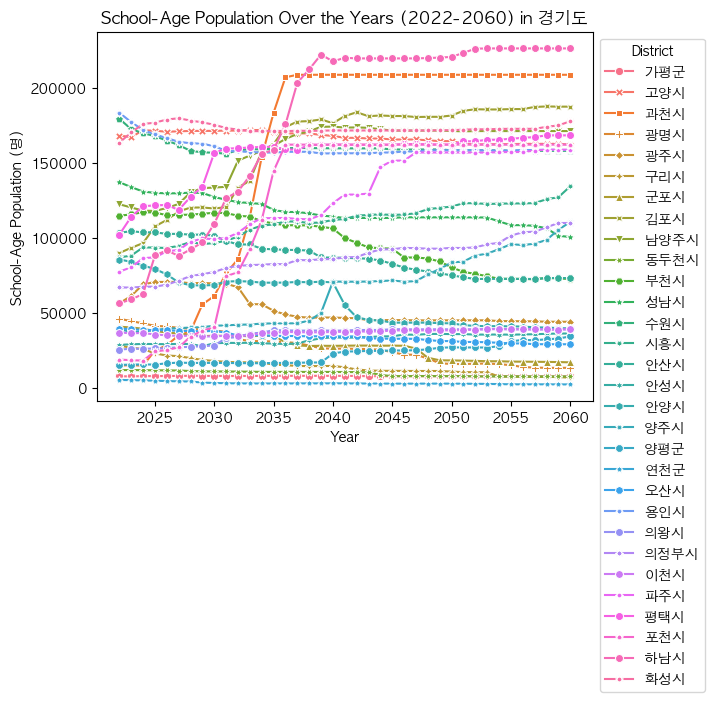

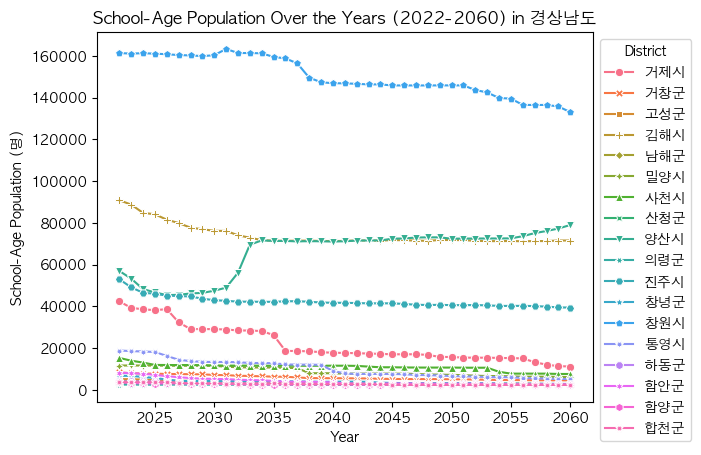

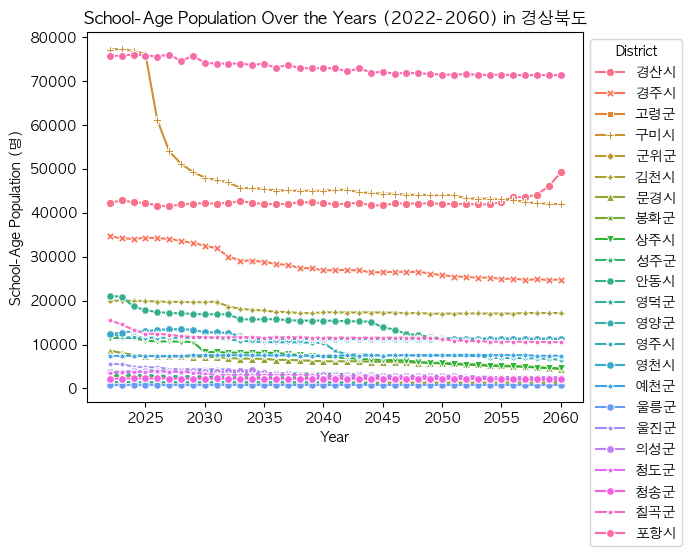

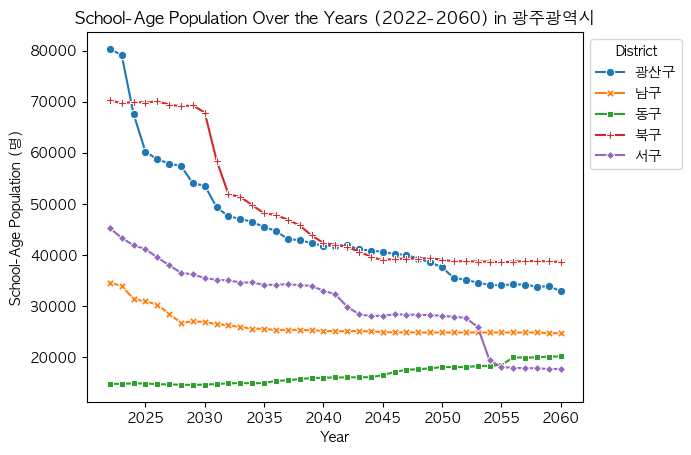

...

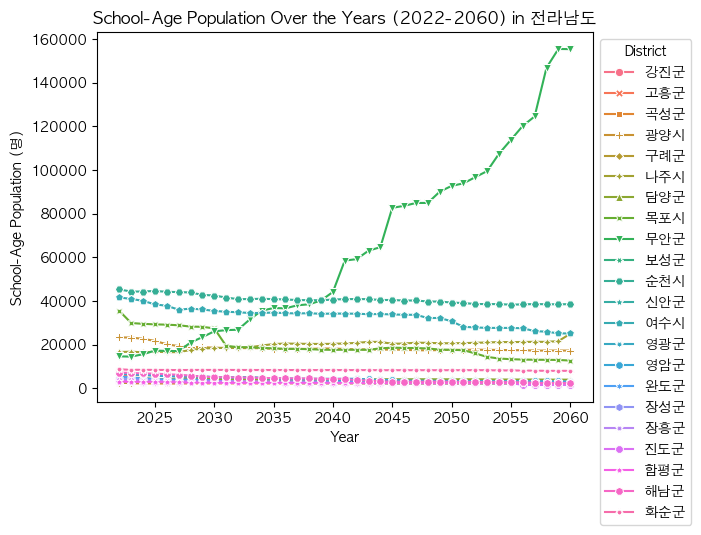

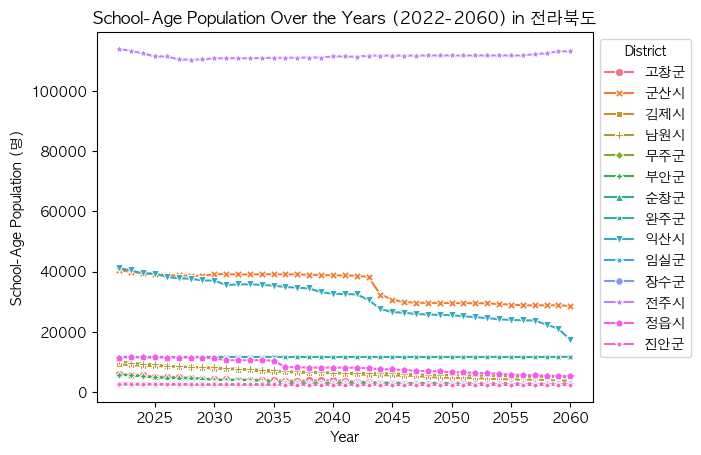

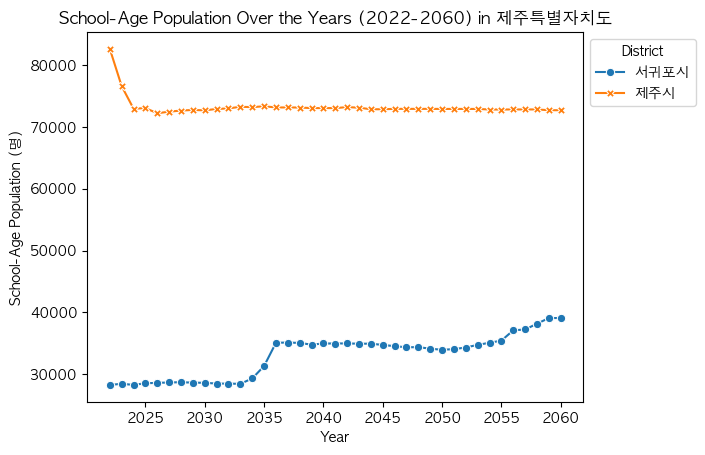

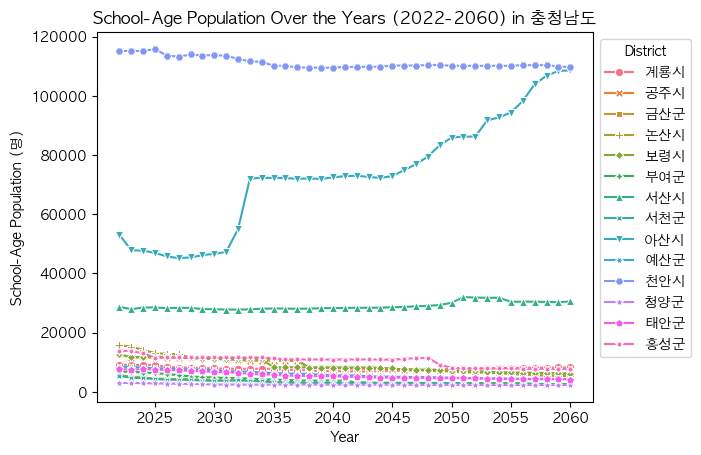

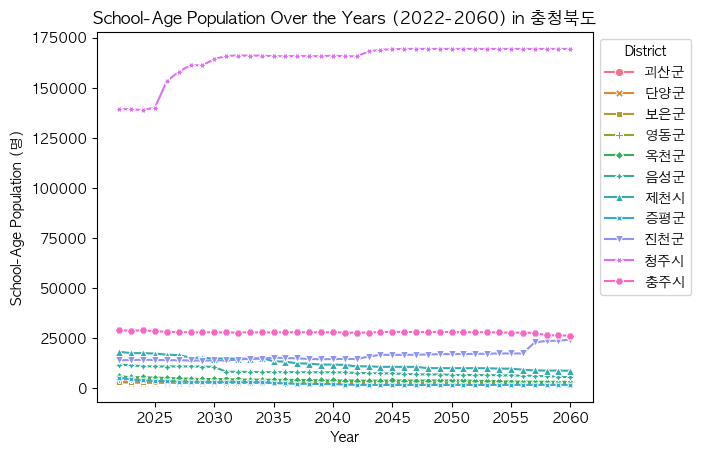

In [59]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming result_merge_df is your DataFrame

# Convert the '연도' column to int and filter for years 2022 and beyond
result_merge_df['연도'] = result_merge_df['연도'].astype(int)
filtered_df = result_merge_df[result_merge_df['연도'] >= 2022]

# Get unique cities in the '시도' column
unique_cities = filtered_df['시도'].unique()

# Create separate line plots for each city
for city in unique_cities:
    city_df = filtered_df[filtered_df['시도'] == city]

    # Create a line plot for the city and its districts
    #plt.figure(figsize=(12, 6))
    sns.lineplot(x='연도', y='학령인구(명)', hue='시군구', style='시군구', data=city_df, markers=True, dashes=False)
    
    plt.title(f'School-Age Population Over the Years (2022-2060) in {city}')
    plt.xlabel('Year')
    plt.ylabel('School-Age Population (명)')
    plt.legend(title='District', bbox_to_anchor=(1, 1), loc='upper left')
    plt.show()
